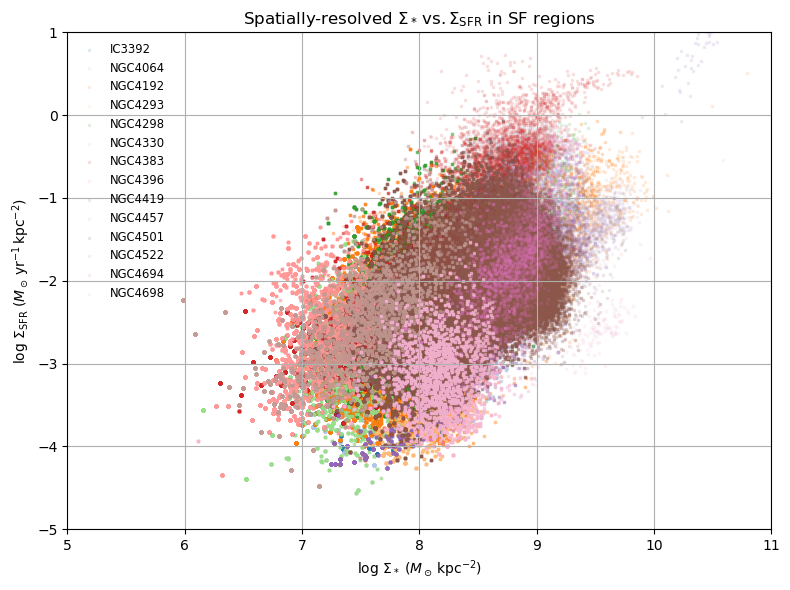

In [1]:
from pathlib import Path
import itertools
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits           # for FITS I/O

# ------------------------------------------------------------------
# 1.  Discover the galaxies present
# ------------------------------------------------------------------
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bin_maps] # do all galaxies on disk
# galaxies = ['IC3392', 'NGC4501']      # or edit this list as you like

# Colour cycle (expand if you have >10 galaxies)
colors = itertools.cycle(plt.get_cmap('tab20').colors)

# ------------------------------------------------------------------
# 2.  Build the plot
# ------------------------------------------------------------------
plt.figure(figsize=(8, 6))

for gal, colour in zip(galaxies, colors):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    # --- read FITS extensions -------------------------------------
    with fits.open(bin_file) as hdul:
        logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
    with fits.open(gas_file) as hdul:
        logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

    # --- mask bad pixels ------------------------------------------
    good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

    # --- scatter --------------------------------------------------
    plt.scatter(
        logSigmaM[good],
        logSigmaSFR[good],
        s=1, 
        marker=',', 
        alpha=0.1,
        color=[colour],
        label=gal
    )

# ------------------------------------------------------------------
# 3.  Final cosmetics
# ------------------------------------------------------------------
plt.xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$')
plt.ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$')
plt.title(r'Spatially-resolved $\Sigma_*\,\text{vs.}\,\Sigma_{\mathrm{SFR}}$ in SF regions')
plt.xlim(5, 11)
plt.ylim(-5, 1)
plt.grid()
plt.legend(frameon=False, fontsize='small', loc='upper left')
plt.tight_layout()
plt.show()


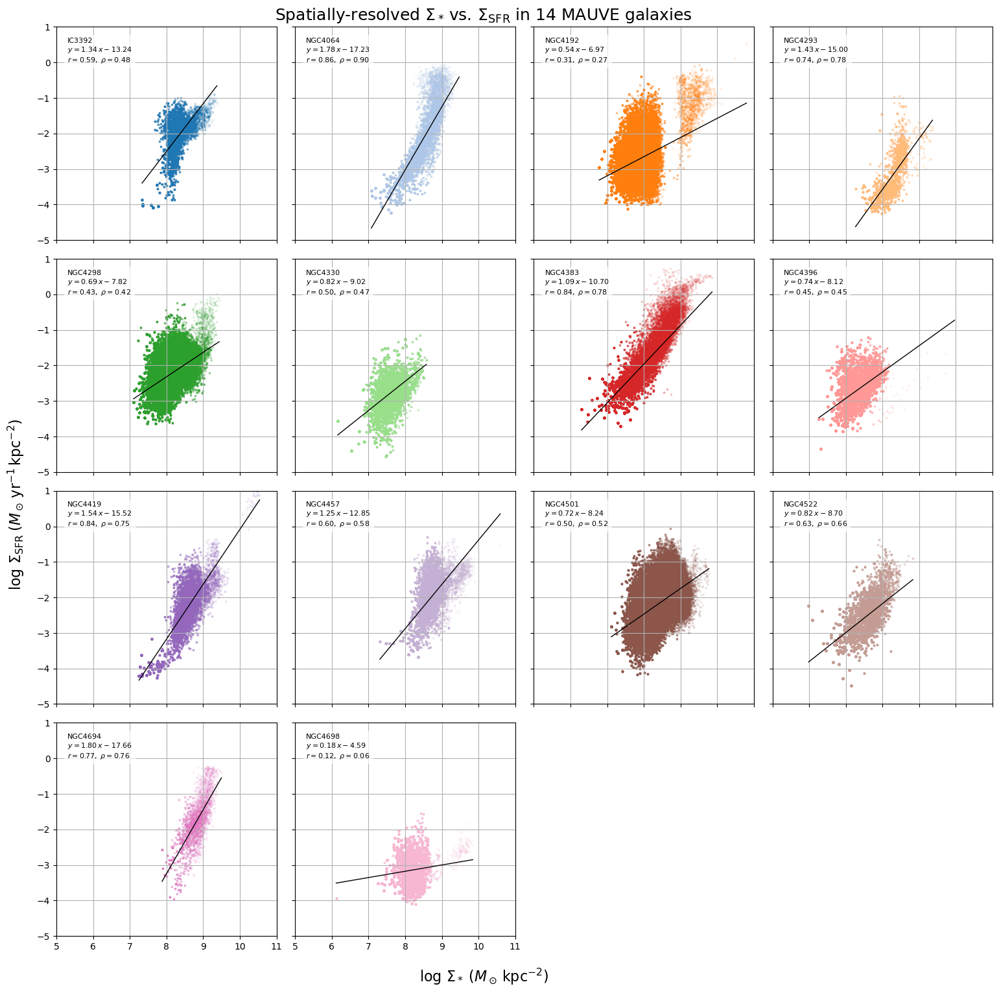

In [2]:
# ------------------------------------------------------------------
# FULL CELL: resolved SFMS for every galaxy on disk
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress, spearmanr
import itertools

# 0.  Auto-discover galaxies from *_SPATIAL_BINNING_maps_extended.fits
bin_maps  = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bin_maps]
ngal      = len(galaxies)

# 1.  Layout sizes
ncols = int(np.ceil(np.sqrt(ngal)))
nrows = int(np.ceil(ngal / ncols))

# 2.  Assign one distinct colour to each galaxy
cmap   = plt.get_cmap('tab20').colors          # 20 distinct hues
colour = {g: cmap[i % len(cmap)]               # wrap if >20 galaxies
          for i, g in enumerate(galaxies)}

# 3.  Helper to pull Σ* and Σ_SFR as 1-D arrays (finite pixels only)
def load_sigma(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
    good = np.isfinite(sigM) & np.isfinite(sigSFR)
    return sigM[good], sigSFR[good]

# 4.  Build the figure
fig, axes = plt.subplots(
    nrows, ncols, figsize=(4*ncols, 4*nrows),
    sharex=True, sharey=True
)
axes = axes.flatten()

for i, gal in enumerate(galaxies):
    ax = axes[i]
    x, y = load_sigma(gal)

    # linear fit y = kx + b
    slope, intercept, r_val, p_val, _ = linregress(x, y)
    rho, _ = spearmanr(x, y)
    xx = np.linspace(x.min(), x.max(), 200)
    yy = slope*xx + intercept

    # scatter + fit line
    ax.scatter(x, y, s=1, alpha=0.1, marker=',', color=colour[gal])
    ax.plot(xx, yy, lw=1, color='k')

    ax.text(
        0.05, 0.95,
        (f'{gal}\n'
         fr'$y={slope:.2f}\,x{intercept:+.2f}$' '\n'
         fr'$r={r_val:.2f},\; \rho={rho:.2f}$'),
        transform=ax.transAxes, va='top', ha='left',
        fontsize=8,
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
    )

    ax.set_xlim(5, 11)
    ax.set_ylim(-5, 1)
    ax.grid(True)

# 5.  Hide any unused sub-axes
for ax in axes[ngal:]:
    ax.axis('off')

# 6.  Shared labels and title
fig.text(0.5, 0.04,
         r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=16)
fig.text(0.04, 0.5,
         r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$',
         va='center', rotation='vertical', fontsize=16)
fig.suptitle(
    fr'Spatially-resolved $\Sigma_*\,\mathrm{{vs.}}\,\Sigma_{{\mathrm{{SFR}}}}$ '
    f'in {ngal} MAUVE galax{"y" if ngal==1 else "ies"}',
    fontsize=18
)
fig.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.show()

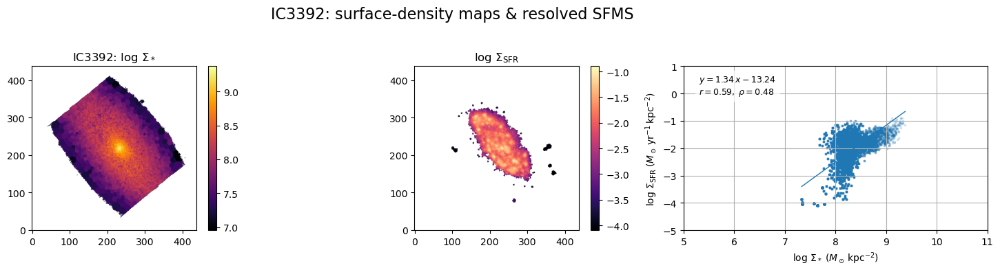

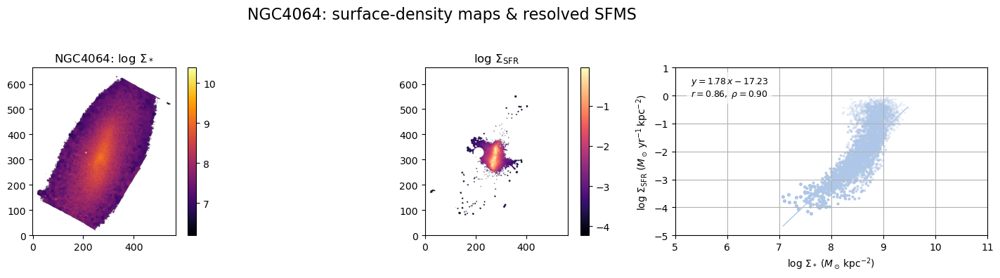

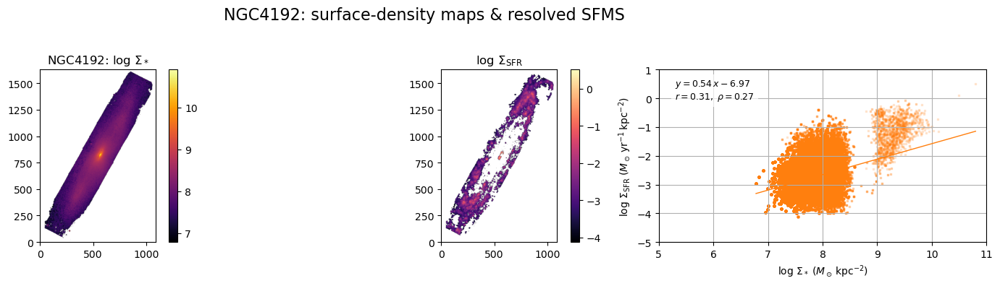

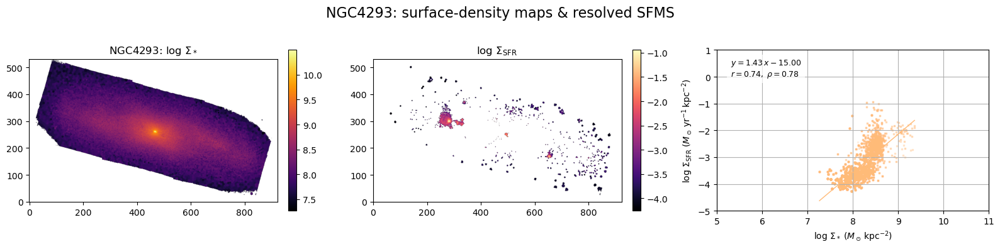

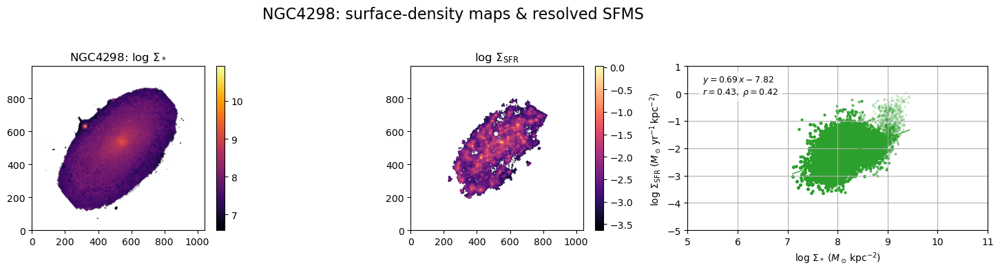

...

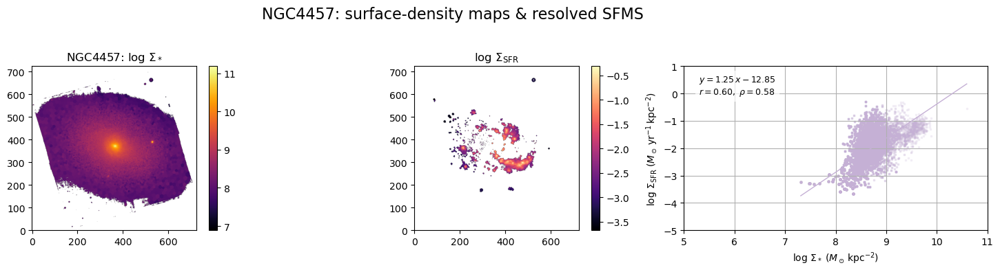

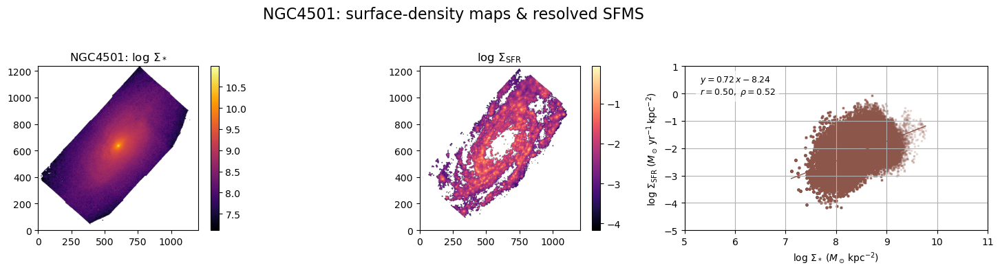

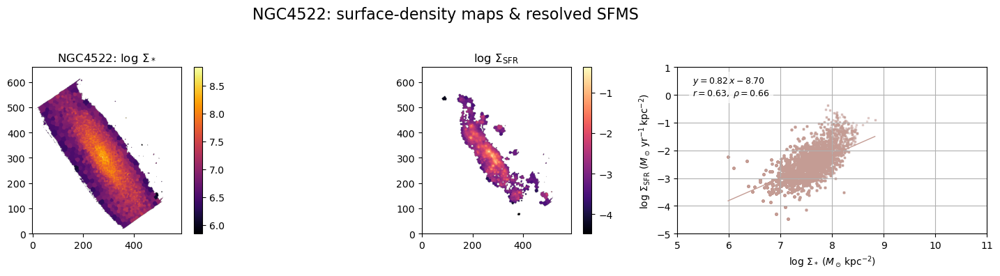

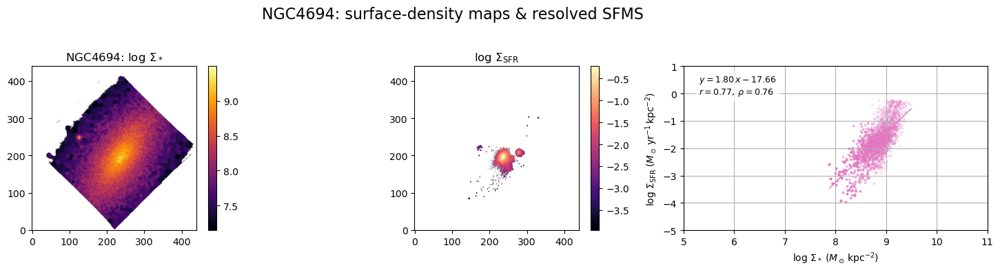

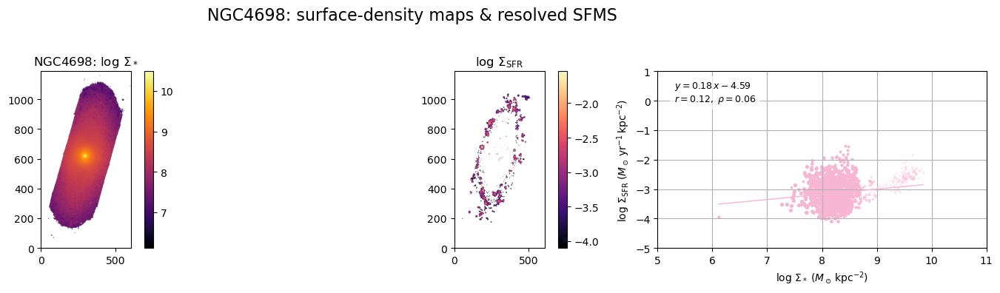

In [3]:
import itertools
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
from astropy.io import fits
from scipy.stats import linregress, spearmanr

# ------------------------------------------------------------------
# 0.  List galaxies and pin one colour to each
# ------------------------------------------------------------------
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bin_maps]        # auto-detect
cmap   = plt.get_cmap('tab20').colors                      # 20 hues
colour = {g: cmap[i % len(cmap)] for i, g in enumerate(galaxies)}

# ------------------------------------------------------------------
# 1.  Helper: read the two maps
# ------------------------------------------------------------------
def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
    return sigM, sigSFR

# ------------------------------------------------------------------
# 2.  One figure (3 panels) per galaxy
# ------------------------------------------------------------------
for gal in galaxies:
    sigM, sigSFR = load_maps(gal)
    good = np.isfinite(sigM) & np.isfinite(sigSFR)
    x, y = sigM[good], sigSFR[good]

    slope, intercept, r, p, _ = linregress(x, y)
    rho, _ = spearmanr(x, y)
    xx = np.linspace(x.min(), x.max(), 200)
    yy = slope*xx + intercept

    fig, (axM, axSFR, axSc) = plt.subplots(1, 3, figsize=(16, 4))

    # --- Σ* map ---------------------------------------------------
    im1 = axM.imshow(sigM, origin='lower', cmap='inferno')
    axM.set_title(rf'{gal}: $\log\,\Sigma_*$')
    fig.colorbar(im1, ax=axM, fraction=0.046, pad=0.04)

    # --- Σ_SFR map -----------------------------------------------
    im2 = axSFR.imshow(sigSFR, origin='lower', cmap='magma')
    axSFR.set_title(r'$\log\,\Sigma_{\mathrm{SFR}}$')
    fig.colorbar(im2, ax=axSFR, fraction=0.046, pad=0.04)

    # --- SFMS scatter --------------------------------------------
    axSc.scatter(x, y, s=2, alpha=0.15, marker=',', color=colour[gal])
    axSc.plot(xx, yy, lw=1, color=colour[gal])
    axSc.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$')
    axSc.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$')
    axSc.set_xlim(5, 11)
    axSc.set_ylim(-5, 1)
    axSc.grid(True)
    stats = fr'$y={slope:.2f}\,x{intercept:+.2f}$' '\n' + fr'$r={r:.2f},\; \rho={rho:.2f}$'
    axSc.text(0.05, 0.95, stats, transform=axSc.transAxes,
              va='top', ha='left', fontsize=9,
              bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    fig.suptitle(f'{gal}: surface-density maps & resolved SFMS', fontsize=16)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


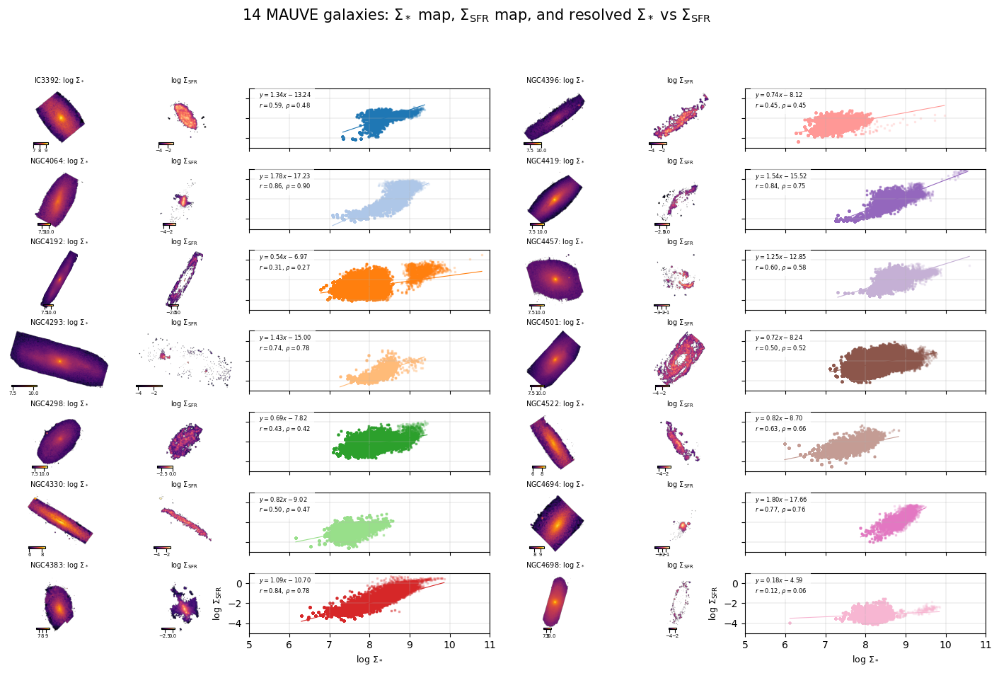

In [4]:
# --------------------------------------------------------------
# 7 rows × 2 blocks (each block = Σ*, Σ_SFR, SFMS)  → 6-column grid
# --------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress, spearmanr

# 0 · discover galaxies & colour palette
bins      = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bins]          # 14 expected
ngal      = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

cmap   = plt.get_cmap('tab20').colors
colour = {g: cmap[i % len(cmap)] for i, g in enumerate(galaxies)}

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
    return sigM, sigSFR

# 1 · figure & GridSpec  (rows=7, cols=6 → two 3-column blocks)
fig = plt.figure(figsize=(18, 10))                      # still ~16:9
gs  = GridSpec(
        nrows=7, ncols=6, figure=fig,
        width_ratios=[1, 1, 2, 1, 1, 2],                # Σ*, Σ_SFR, SFMS
        wspace=0.03, hspace=0.35
)

for idx, gal in enumerate(galaxies):
    row  = idx % 7                      # 0–6
    blk  = idx // 7                     # 0 or 1   (left / right big column)
    col0 = blk * 3                      # 0 or 3   (start col of that block)

    sigM, sigSFR = load_maps(gal)
    good         = np.isfinite(sigM) & np.isfinite(sigSFR)
    x, y         = sigM[good], sigSFR[good]

    k, b, r, *_  = linregress(x, y)
    rho, _       = spearmanr(x, y)
    xx           = np.linspace(x.min(), x.max(), 200)
    yy           = k*xx + b

    # Σ* map
    axM = fig.add_subplot(gs[row, col0])
    imM = axM.imshow(sigM, origin='lower', cmap='inferno')
    axM.set_title(rf'{gal}: $\log\,\Sigma_*$', fontsize=7)
    axM.axis('off')
    cax = inset_axes(axM, width='25%', height='3%', loc='lower left',
                     borderpad=0.4)
    fig.colorbar(imM, cax=cax, orientation='horizontal')
    cax.tick_params(labelsize=5, pad=1)

    # Σ_SFR map
    axS = fig.add_subplot(gs[row, col0+1])
    imS = axS.imshow(sigSFR, origin='lower', cmap='magma')
    axS.set_title(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=7)
    axS.axis('off')
    cax2 = inset_axes(axS, width='25%', height='3%', loc='lower left',
                      borderpad=0.4)
    fig.colorbar(imS, cax=cax2, orientation='horizontal')
    cax2.tick_params(labelsize=5, pad=1)

    # SFMS scatter
    axP = fig.add_subplot(gs[row, col0+2])
    axP.scatter(x, y, s=3, alpha=0.18, marker=',', color=colour[gal])
    axP.plot(xx, yy, lw=0.8, color=colour[gal])
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

    if row == 6:                               # bottom row gets labels
        axP.set_xlabel(r'$\log\,\Sigma_*$', fontsize=9)
        axP.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=9)
    else:
        axP.set_xticklabels([]); axP.set_yticklabels([])

    axP.text(0.04, 0.96,
             fr'$y={k:.2f}x{b:+.2f}$' '\n' fr'$r={r:.2f},\,\rho={rho:.2f}$',
             transform=axP.transAxes, va='top', ha='left', fontsize=6,
             bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

# 2 · global title
fig.suptitle(
    r'14 MAUVE galaxies: $\Sigma_*$ map, $\Sigma_{\mathrm{SFR}}$ map, and resolved '
    r'$\Sigma_*{\rm\ vs\ }\Sigma_{\mathrm{SFR}}$',
    fontsize=15, y=0.995
)
plt.show()


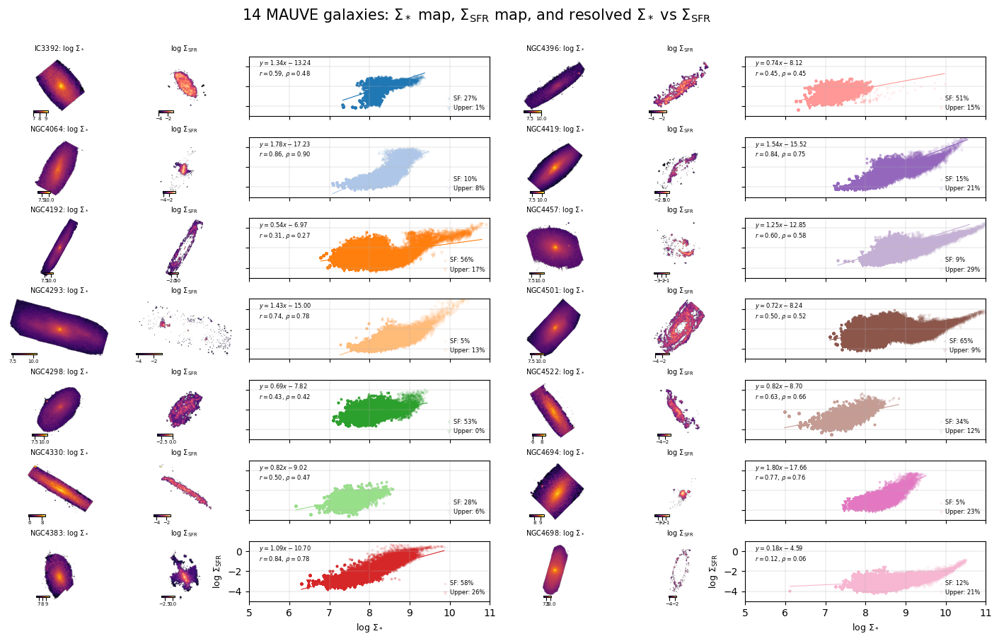

In [5]:
# 0 · discover galaxies & colour palette
bins      = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bins]          # 14 expected
ngal      = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

cmap   = plt.get_cmap('tab20').colors
colour = {g: cmap[i % len(cmap)] for i, g in enumerate(galaxies)}

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# 1 · figure & GridSpec  (rows=7, cols=6 → two 3-column blocks)
fig = plt.figure(figsize=(18, 10))                      # still ~16:9
gs  = GridSpec(
        nrows=7, ncols=6, figure=fig,
        width_ratios=[1, 1, 2, 1, 1, 2],                # Σ*, Σ_SFR, SFMS
        wspace=0.03, hspace=0.35
)

plot_idx = 0  # Track position for plotting
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    # Check for valid data in either dataset
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    # Skip if no valid data points in either dataset
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row  = plot_idx % 7                      # 0–6
    blk  = plot_idx // 7                     # 0 or 1   (left / right big column)
    col0 = blk * 3                           # 0 or 3   (start col of that block)
    plot_idx += 1

    # Σ* map
    axM = fig.add_subplot(gs[row, col0])
    imM = axM.imshow(sigM, origin='lower', cmap='inferno')
    axM.set_title(rf'{gal}: $\log\,\Sigma_*$', fontsize=7)
    axM.axis('off')
    cax = inset_axes(axM, width='25%', height='3%', loc='lower left',
                     borderpad=0.4)
    fig.colorbar(imM, cax=cax, orientation='horizontal')
    cax.tick_params(labelsize=5, pad=1)

    # Σ_SFR map (showing SF data)
    axS = fig.add_subplot(gs[row, col0+1])
    imS = axS.imshow(sigSFR_SF, origin='lower', cmap='magma')
    axS.set_title(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=7)
    axS.axis('off')
    cax2 = inset_axes(axS, width='25%', height='3%', loc='lower left',
                      borderpad=0.4)
    fig.colorbar(imS, cax=cax2, orientation='horizontal')
    cax2.tick_params(labelsize=5, pad=1)

    # SFMS scatter with both datasets
    axP = fig.add_subplot(gs[row, col0+2])
    
    # Calculate percentages for non-nan values relative to sigSFR
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    # Plot SF data with comma markers
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        axP.scatter(x_sf, y_sf, s=1, alpha=0.1, marker=',', color=colour[gal], label=f'SF: {pct_SF:.0f}%')
        
        # Fit line to SF data only
        slope, intercept, r, p, _ = linregress(x_sf, y_sf)
        rho, _ = spearmanr(x_sf, y_sf)
        xx = np.linspace(x_sf.min(), x_sf.max(), 200)
        yy = slope*xx + intercept
        axP.plot(xx, yy, lw=0.8, color=colour[gal])
    
    # Plot non-SFdata with down triangle markers
    if np.any(good_nonSF):
        x_nonSF, y_nonSF = sigM[good_nonSF], sigSFR_nonSF[good_nonSF]
        axP.scatter(x_nonSF, y_nonSF, s=10, alpha=0.1, marker='v', color=colour[gal], label=f'Upper: {pct_nonSF:.0f}%')
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

    if row == 6:                               # bottom row gets labels
        axP.set_xlabel(r'$\log\,\Sigma_*$', fontsize=9)
        axP.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=9)
    else:
        axP.set_xticklabels([]); axP.set_yticklabels([])

    # Display fit parameters in top left
    if np.any(good_SF):
        text_top = fr'$y={slope:.2f}x{intercept:+.2f}$' '\n' fr'$r={r:.2f},\,\rho={rho:.2f}$'
        axP.text(0.04, 0.96, text_top,
                 transform=axP.transAxes, va='top', ha='left', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.7, edgecolor='none'))
    
    # Add legend with percentages in bottom right
    axP.legend(loc='lower right', fontsize=6, frameon=False, handletextpad=0.3, handlelength=1)
# 2 · global title
fig.suptitle(
    r'14 MAUVE galaxies: $\Sigma_*$ map, $\Sigma_{\mathrm{SFR}}$ map, and resolved '
    r'$\Sigma_*{\rm\ vs\ }\Sigma_{\mathrm{SFR}}$',
    fontsize=15, y=0.95
)
plt.show()

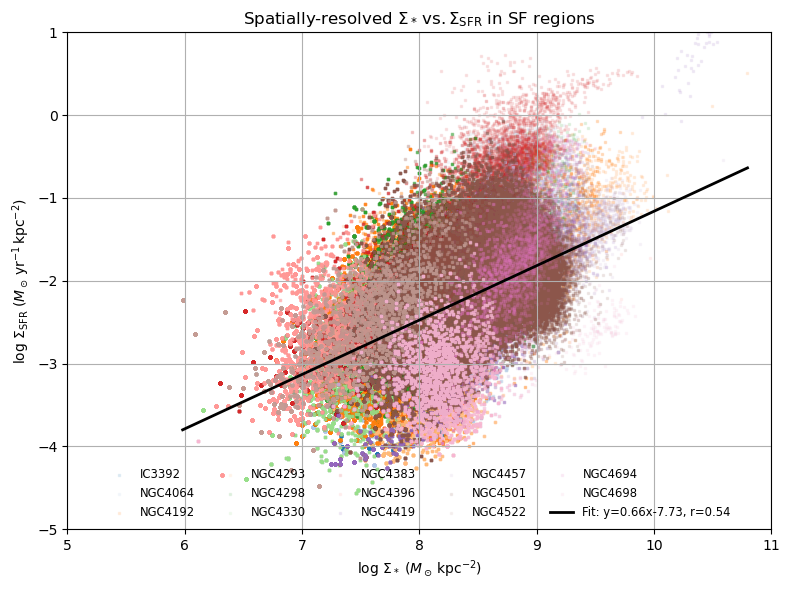

In [6]:
# ------------------------------------------------------------------
# 1.  Discover the galaxies present
# ------------------------------------------------------------------
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bin_maps] # do all galaxies on disk
# galaxies = ['IC3392', 'NGC4501']      # or edit this list as you like

# Colour cycle (expand if you have >10 galaxies)
colors = itertools.cycle(plt.get_cmap('tab20').colors)

# ------------------------------------------------------------------
# 2.  Build the plot
# ------------------------------------------------------------------
plt.figure(figsize=(8, 6))

# Collect all data points for global fit
all_x = []
all_y = []

for gal, colour in zip(galaxies, colors):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    # --- read FITS extensions -------------------------------------
    with fits.open(bin_file) as hdul:
        logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
    with fits.open(gas_file) as hdul:
        logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

    # --- mask bad pixels ------------------------------------------
    good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

    # --- scatter --------------------------------------------------
    plt.scatter(
        logSigmaM[good],
        logSigmaSFR[good],
        s=1, 
        marker=',', 
        alpha=0.1,
        color=[colour],
        label=gal
    )
    
    # Collect points for global fit
    all_x.extend(logSigmaM[good])
    all_y.extend(logSigmaSFR[good])

# Convert to numpy arrays for fitting
all_x = np.array(all_x)
all_y = np.array(all_y)

# Fit regression to all points
slope, intercept, r_val, p_val, _ = linregress(all_x, all_y)

# Plot fit line
xx = np.linspace(all_x.min(), all_x.max(), 200)
yy = slope * xx + intercept
plt.plot(xx, yy, 'k-', linewidth=2, 
         label=f'Fit: y={slope:.2f}x{intercept:+.2f}, r={r_val:.2f}')

# ------------------------------------------------------------------
# 3.  Final cosmetics
# ------------------------------------------------------------------
plt.xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$')
plt.ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$')
plt.title(r'Spatially-resolved $\Sigma_*\,\text{vs.}\,\Sigma_{\mathrm{SFR}}$ in SF regions')
plt.xlim(5, 11)
plt.ylim(-5, 1)
plt.grid()
plt.legend(frameon=False, fontsize='small', loc='lower center', ncol=5)
plt.tight_layout()
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/1723489161.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.06, 0.06, 1, 0.92])


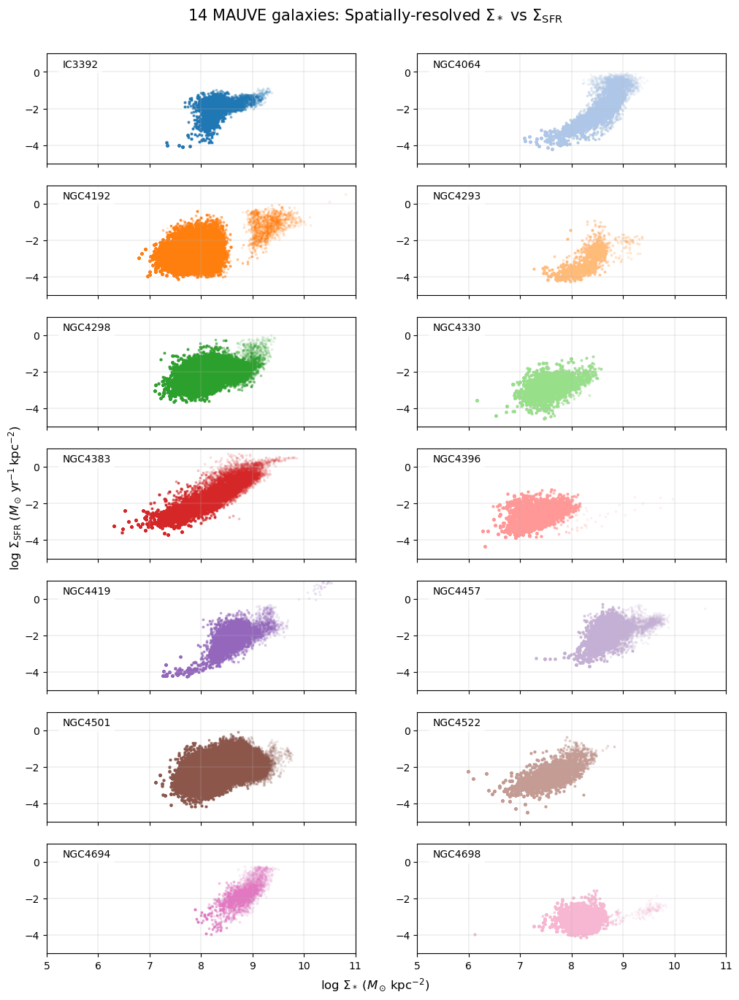

In [7]:
# 0 · discover galaxies & colour palette
bins      = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bins]          # 14 expected
ngal      = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

cmap   = plt.get_cmap('tab20').colors
colour = {g: cmap[i % len(cmap)] for i, g in enumerate(galaxies)}

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# 1 · figure & GridSpec (2 columns layout)
fig = plt.figure(figsize=(12, 16))
gs  = GridSpec(
        nrows=7, ncols=2, figure=fig,
        wspace=0.2, hspace=0.2
)

plot_idx = 0  # Track position for plotting
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    # Check for valid data in either dataset
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    # Skip if no valid data points in either dataset
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = plot_idx // 2  # 0-6
    col = plot_idx % 2   # 0 or 1
    plot_idx += 1

    # SFMS scatter with both datasets
    axP = fig.add_subplot(gs[row, col])
    
    # Calculate percentages for non-nan values relative to sigSFR
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    # Plot SF data with comma markers
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        axP.scatter(x_sf, y_sf, s=1, alpha=0.1, marker=',', color=colour[gal], label=f'SF: {pct_SF:.0f}%')
    
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)
    
    # Add galaxy name as annotation in top left
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, va='top', ha='left', 
             fontsize=10, bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Remove individual x axis ticks except for the last row
    if row == 6:  # Last row gets x labels
        pass
    else:
        axP.set_xticklabels([])

# Add shared axis labels using fig.text
fig.text(0.5, 0.08,
         r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=12)
fig.text(0.08, 0.5,
         r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$',
         va='center', rotation='vertical', fontsize=12)

# 2 · global title
fig.suptitle(
    fr'{ngal} MAUVE galaxies: Spatially-resolved $\Sigma_*{{\rm\ vs\ }}\Sigma_{{\mathrm{{SFR}}}}$',
    fontsize=15, y=0.92
)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.92])
plt.show()


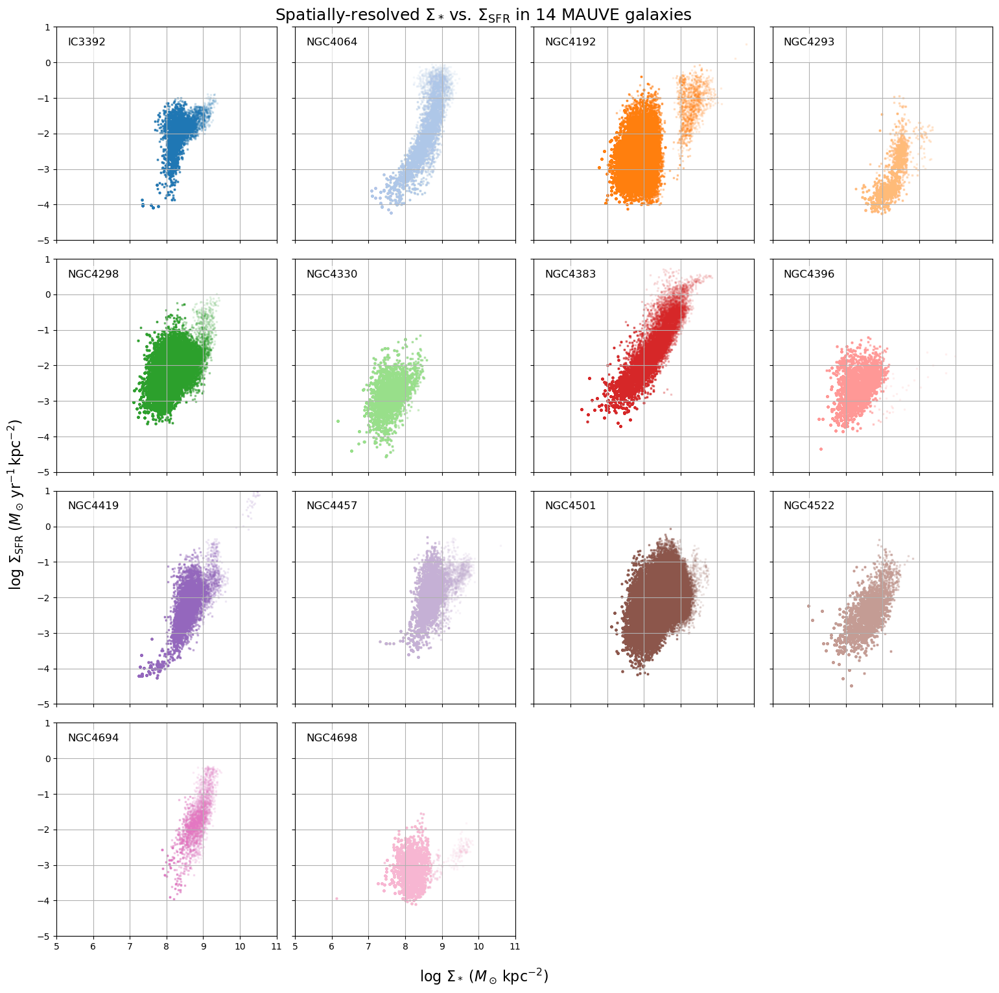

In [8]:
# ------------------------------------------------------------------
# FULL CELL: resolved SFMS for every galaxy on disk
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress, spearmanr
import itertools

# 0.  Auto-discover galaxies from *_SPATIAL_BINNING_maps_extended.fits
bin_maps  = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bin_maps]
ngal      = len(galaxies)

# 1.  Layout sizes
ncols = int(np.ceil(np.sqrt(ngal)))
nrows = int(np.ceil(ngal / ncols))

# 2.  Assign one distinct colour to each galaxy
cmap   = plt.get_cmap('tab20').colors          # 20 distinct hues
colour = {g: cmap[i % len(cmap)]               # wrap if >20 galaxies
          for i, g in enumerate(galaxies)}

# 3.  Helper to pull Σ* and Σ_SFR as 1-D arrays (finite pixels only)
def load_sigma(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
    good = np.isfinite(sigM) & np.isfinite(sigSFR)
    return sigM[good], sigSFR[good]

# 4.  Build the figure
fig, axes = plt.subplots(
    nrows, ncols, figsize=(4*ncols, 4*nrows),
    sharex=True, sharey=True
)
axes = axes.flatten()

for i, gal in enumerate(galaxies):
    ax = axes[i]
    x, y = load_sigma(gal)

    # linear fit y = kx + b
    slope, intercept, r_val, p_val, _ = linregress(x, y)
    rho, _ = spearmanr(x, y)
    xx = np.linspace(x.min(), x.max(), 200)
    yy = slope*xx + intercept

    # scatter + fit line
    ax.scatter(x, y, s=1, alpha=0.1, marker=',', color=colour[gal])
    # ax.plot(xx, yy, lw=1, color='k')

    ax.text(
        0.05, 0.95,
        (f'{gal}\n'),
        #  fr'$y={slope:.2f}\,x{intercept:+.2f}$' '\n'
        #  fr'$r={r_val:.2f},\; \rho={rho:.2f}$'),
        transform=ax.transAxes, va='top', ha='left',
        fontsize=12,
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
    )

    ax.set_xlim(5, 11)
    ax.set_ylim(-5, 1)
    ax.grid(True)

# 5.  Hide any unused sub-axes
for ax in axes[ngal:]:
    ax.axis('off')

# 6.  Shared labels and title
fig.text(0.5, 0.04,
         r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=16)
fig.text(0.04, 0.5,
         r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$',
         va='center', rotation='vertical', fontsize=16)
fig.suptitle(
    fr'Spatially-resolved $\Sigma_*\,\mathrm{{vs.}}\,\Sigma_{{\mathrm{{SFR}}}}$ '
    f'in {ngal} MAUVE galax{"y" if ngal==1 else "ies"}',
    fontsize=18
)
fig.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/785635638.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.06, 0.06, 1, 0.85])


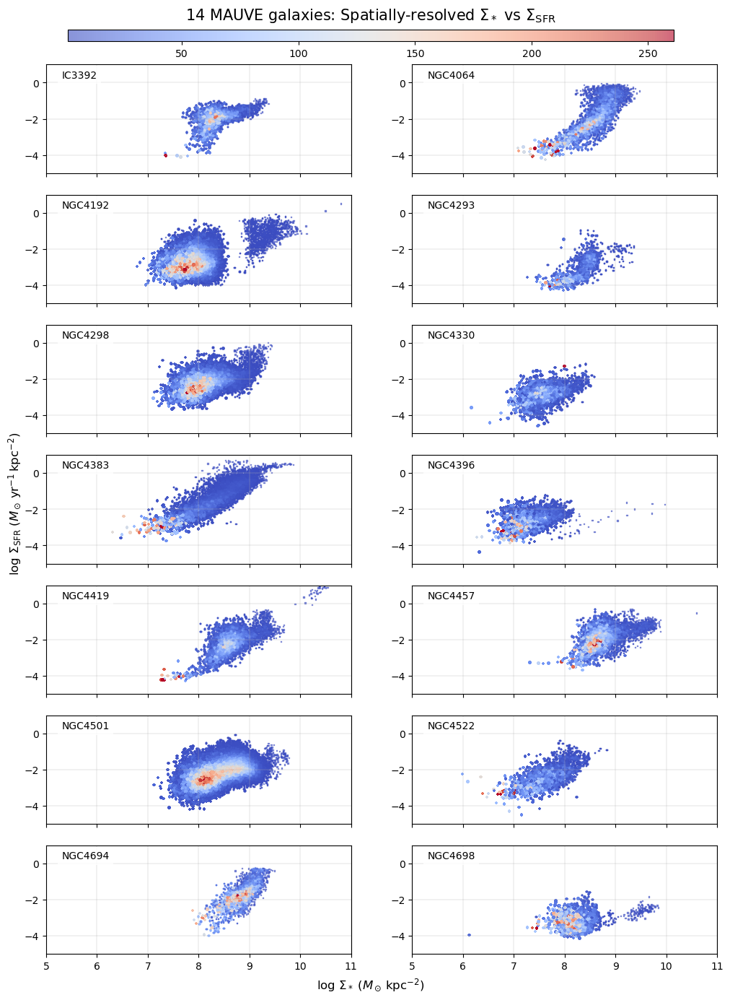

In [9]:
# 0 · discover galaxies & colour palette
bins      = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bins]          # 14 expected
ngal      = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# 1 · figure & GridSpec (2 columns layout)
fig = plt.figure(figsize=(12, 16))
gs  = GridSpec(
        nrows=7, ncols=2, figure=fig,
        wspace=0.2, hspace=0.2
)

plot_idx = 0  # Track position for plotting
scatter_for_cbar = None  # Store scatter plot for colorbar

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    # Check for valid data in either dataset
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    # Skip if no valid data points in either dataset
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = plot_idx // 2  # 0-6
    col = plot_idx % 2   # 0 or 1
    plot_idx += 1

    # SFMS scatter with both datasets
    axP = fig.add_subplot(gs[row, col])
    
    # Calculate percentages for non-nan values relative to sigSFR
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    # Plot SF data with density-based colormap
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Create 2D histogram for density calculation
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        
        # Find bin indices for each point
        x_idx = np.digitize(x_sf, xedges) - 1
        y_idx = np.digitize(y_sf, yedges) - 1
        
        # Clip indices to valid range
        x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
        y_idx = np.clip(y_idx, 0, H.shape[1] - 1)
        
        # Get density for each point
        density = H[x_idx, y_idx]
        
        # Create scatter plot colored by density
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Store scatter plot for colorbar (use the first one)
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)
    
    # Add galaxy name as annotation in top left
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, va='top', ha='left', 
             fontsize=10, bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Remove individual x axis ticks except for the last row
    if row == 6:  # Last row gets x labels
        pass
    else:
        axP.set_xticklabels([])

# Add horizontal colorbar below the suptitle
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.9, 0.7, 0.01])  # [left, bottom, width, height]
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    # cbar.set_label('Number Density', fontsize=10)

# Add shared axis labels using fig.text
fig.text(0.5, 0.08,
         r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=12)
fig.text(0.08, 0.5,
         r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$',
         va='center', rotation='vertical', fontsize=12)

# 2 · global title
fig.suptitle(
    fr'{ngal} MAUVE galaxies: Spatially-resolved $\Sigma_*{{\rm\ vs\ }}\Sigma_{{\mathrm{{SFR}}}}$',
    fontsize=15, y=0.93
)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.85])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/3266935671.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.06, 0.06, 1, 1])


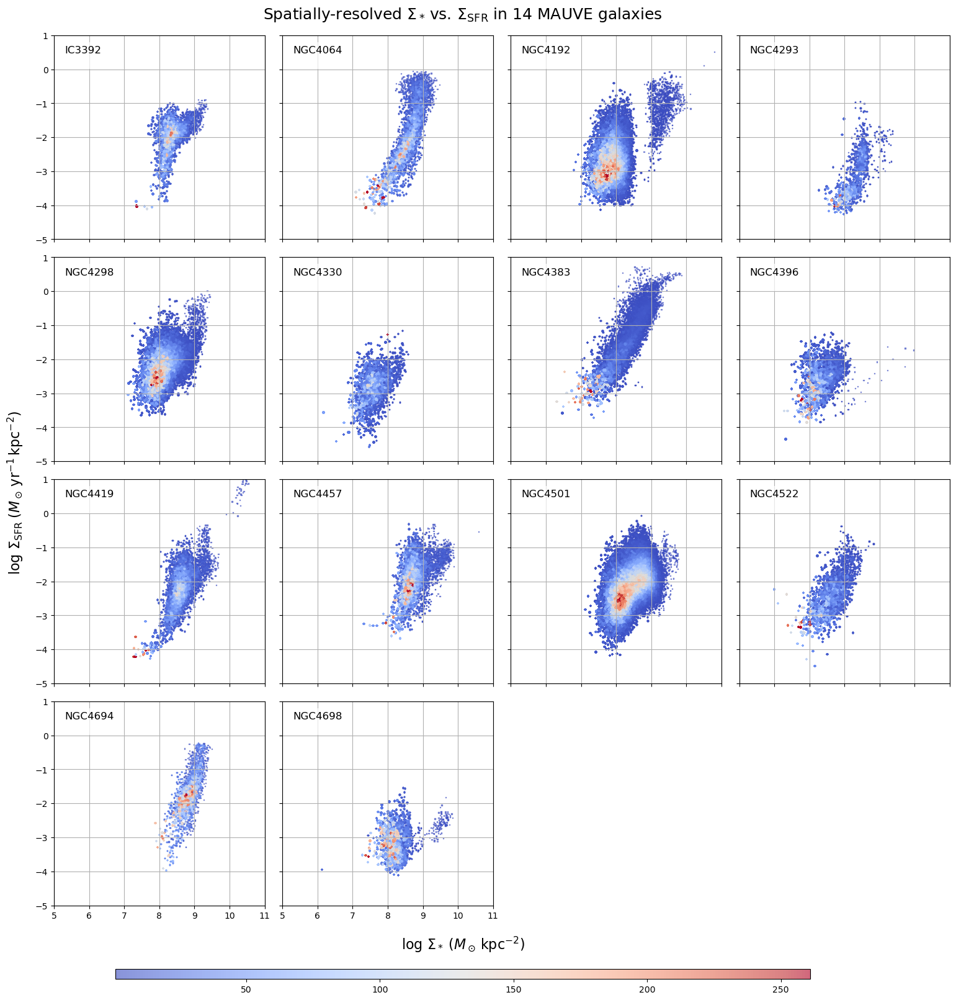

In [10]:
# ------------------------------------------------------------------
# FULL CELL: resolved SFMS for every galaxy on disk with density coloring
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress, spearmanr
import itertools

# 0.  Auto-discover galaxies from *_SPATIAL_BINNING_maps_extended.fits
bin_maps  = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bin_maps]
ngal      = len(galaxies)

# 1.  Layout sizes
ncols = int(np.ceil(np.sqrt(ngal)))
nrows = int(np.ceil(ngal / ncols))

# 3.  Helper to pull Σ* and Σ_SFR as 1-D arrays (finite pixels only)
def load_sigma(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
    good = np.isfinite(sigM) & np.isfinite(sigSFR)
    return sigM[good], sigSFR[good]

# 4.  Build the figure
fig, axes = plt.subplots(
    nrows, ncols, figsize=(4*ncols, 4*nrows),
    sharex=True, sharey=True
)
axes = axes.flatten()

scatter_for_cbar = None  # Store scatter plot for colorbar

for i, gal in enumerate(galaxies):
    ax = axes[i]
    x, y = load_sigma(gal)

    # Create 2D histogram for density calculation
    H, xedges, yedges = np.histogram2d(x, y, bins=100, range=[[5, 11], [-5, 1]])
    
    # Find bin indices for each point
    x_idx = np.digitize(x, xedges) - 1
    y_idx = np.digitize(y, yedges) - 1
    
    # Clip indices to valid range
    x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
    y_idx = np.clip(y_idx, 0, H.shape[1] - 1)
    
    # Get density for each point
    density = H[x_idx, y_idx]
    
    # scatter with density coloring
    scatter = ax.scatter(x, y, c=density, s=1, alpha=0.6, marker=',', cmap='coolwarm')
    
    # Store scatter plot for colorbar (use the first one)
    if scatter_for_cbar is None:
        scatter_for_cbar = scatter

    ax.text(
        0.05, 0.95,
        (f'{gal}\n'),
        transform=ax.transAxes, va='top', ha='left',
        fontsize=12,
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
    )

    ax.set_xlim(5, 11)
    ax.set_ylim(-5, 1)
    ax.grid(True)

# 5.  Hide any unused sub-axes
for ax in axes[ngal:]:
    ax.axis('off')

# Add colorbar
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.01, 0.7, 0.01])  # [left, bottom, width, height]
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')

# 6.  Shared labels and title
fig.text(0.5, 0.04,
         r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=16)
fig.text(0.04, 0.5,
         r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$',
         va='center', rotation='vertical', fontsize=16)
fig.suptitle(
    fr'Spatially-resolved $\Sigma_*\,\mathrm{{vs.}}\,\Sigma_{{\mathrm{{SFR}}}}$ '
    f'in {ngal} MAUVE galax{"y" if ngal==1 else "ies"}',
    fontsize=18, y=0.99
)
fig.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/172721614.py:138: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


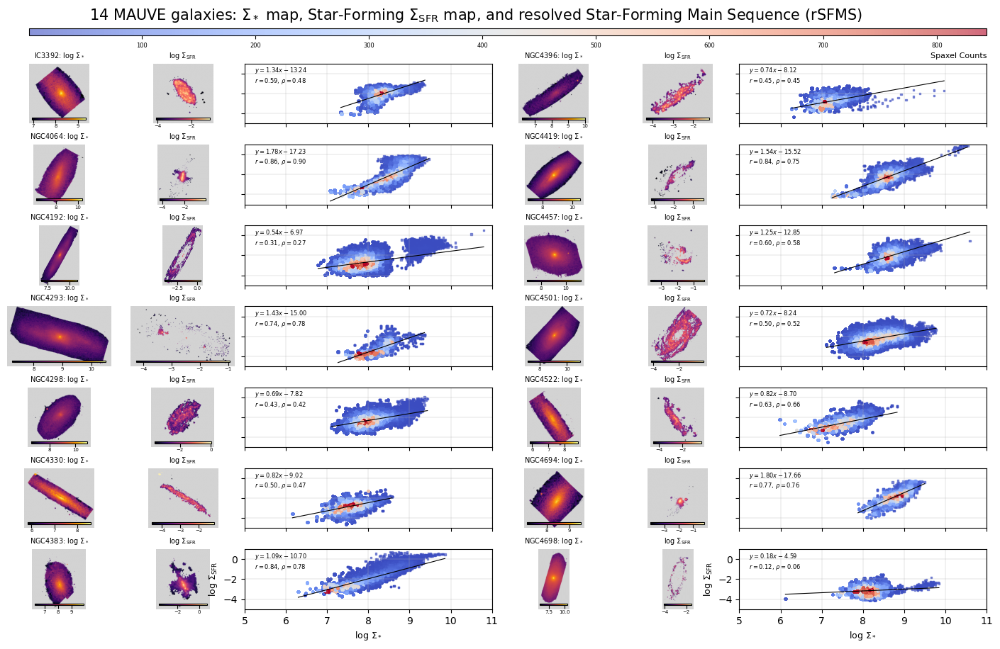

In [11]:
# --------------------------------------------------------------
# 7 rows × 2 blocks (each block = Σ*, Σ_SFR, SFMS)  → 6-column grid
# --------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress, spearmanr
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# 0 · discover galaxies & colour palette
bins      = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bins]          # 14 expected
ngal      = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

cmap   = plt.get_cmap('tab20').colors
colour = {g: cmap[i % len(cmap)] for i, g in enumerate(galaxies)}

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
    return sigM, sigSFR_SF

# Use standard colormaps with built-in NaN handling
# matplotlib automatically shows NaN values as lightgray when using set_bad()

# 1 · figure & GridSpec  (rows=7, cols=6 → two 3-column blocks)
fig = plt.figure(figsize=(18, 10))                      # still ~16:9
gs  = GridSpec(
        nrows=7, ncols=6, figure=fig,
        width_ratios=[1, 1, 2, 1, 1, 2],                # Σ*, Σ_SFR, SFMS
        wspace=0.00, hspace=0.35
)

scatter_for_cbar = None  # Store scatter plot for colorbar

for idx, gal in enumerate(galaxies):
    row  = idx % 7                      # 0–6
    blk  = idx // 7                     # 0 or 1   (left / right big column)
    col0 = blk * 3                      # 0 or 3   (start col of that block)

    sigM, sigSFR_SF = load_maps(gal)
    good         = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    x, y         = sigM[good], sigSFR_SF[good]

    k, b, r, *_  = linregress(x, y)
    rho, _       = spearmanr(x, y)
    xx           = np.linspace(x.min(), x.max(), 200)
    yy           = k*xx + b

    # Σ* map with NaN shown as light gray
    axM = fig.add_subplot(gs[row, col0])
    # Set up colormap with built-in NaN handling
    cmap_M = plt.cm.inferno.copy()
    cmap_M.set_bad('lightgray')
    
    imM = axM.imshow(sigM, origin='lower', cmap=cmap_M)
    axM.set_title(rf'{gal}: $\log\,\Sigma_*$', fontsize=7)
    axM.axis('off')
    cax = inset_axes(axM, width='90%', height='3%', loc='lower center',
                     borderpad=0.4)
    fig.colorbar(imM, cax=cax, orientation='horizontal')
    cax.tick_params(labelsize=5, pad=1)

    # Σ_SFR map with NaN shown as light gray
    axS = fig.add_subplot(gs[row, col0+1])
    # Set up colormap with built-in NaN handling
    cmap_S = plt.cm.magma.copy()
    cmap_S.set_bad('lightgray')
    
    imS = axS.imshow(sigSFR_SF, origin='lower', cmap=cmap_S)
    axS.set_title(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=7)
    axS.axis('off')
    cax2 = inset_axes(axS, width='90%', height='3%', loc='lower center',
                      borderpad=0.4)
    fig.colorbar(imS, cax=cax2, orientation='horizontal')
    cax2.tick_params(labelsize=5, pad=1)

    # SFMS scatter with density-based coloring
    axP = fig.add_subplot(gs[row, col0+2])
    
    # Create 2D histogram for density calculation
    H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[5, 11], [-6, 2]])
    
    # Find bin indices for each point
    x_idx = np.digitize(x, xedges) - 1
    y_idx = np.digitize(y, yedges) - 1
    
    # Clip indices to valid range
    x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
    y_idx = np.clip(y_idx, 0, H.shape[1] - 1)
    
    # Get density for each point
    density = H[x_idx, y_idx]
    
    # Create scatter plot colored by density
    scatter = axP.scatter(x, y, c=density, s=3, alpha=0.6, marker=',', cmap='coolwarm')
    axP.plot(xx, yy, lw=0.8, color='black')  # Use black for fit line to stand out
    
    # Store scatter plot for colorbar (use the first one)
    if scatter_for_cbar is None:
        scatter_for_cbar = scatter
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

    if row == 6:                               # bottom row gets labels
        axP.set_xlabel(r'$\log\,\Sigma_*$', fontsize=9)
        axP.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=9)
    else:
        axP.set_xticklabels([]); axP.set_yticklabels([])

    axP.text(0.04, 0.96,
             fr'$y={k:.2f}x{b:+.2f}$' '\n' fr'$r={r:.2f},\,\rho={rho:.2f}$',
             transform=axP.transAxes, va='top', ha='left', fontsize=6,
             bbox=dict(facecolor='none', alpha=0.7, edgecolor='none'))

# Add horizontal colorbar for density
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.92, 0.75, 0.01])  # [left, bottom, width, height]
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=8, loc='right')
    cbar.ax.tick_params(labelsize=6)

# 2 · global title
fig.suptitle(
    r'14 MAUVE galaxies: $\Sigma_*$ map, Star-Forming $\Sigma_{\mathrm{SFR}}$ map, and resolved '
    r'Star-Forming Main Sequence (rSFMS)',
    fontsize=15, y=0.96
)
plt.tight_layout()
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/1152778716.py:180: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


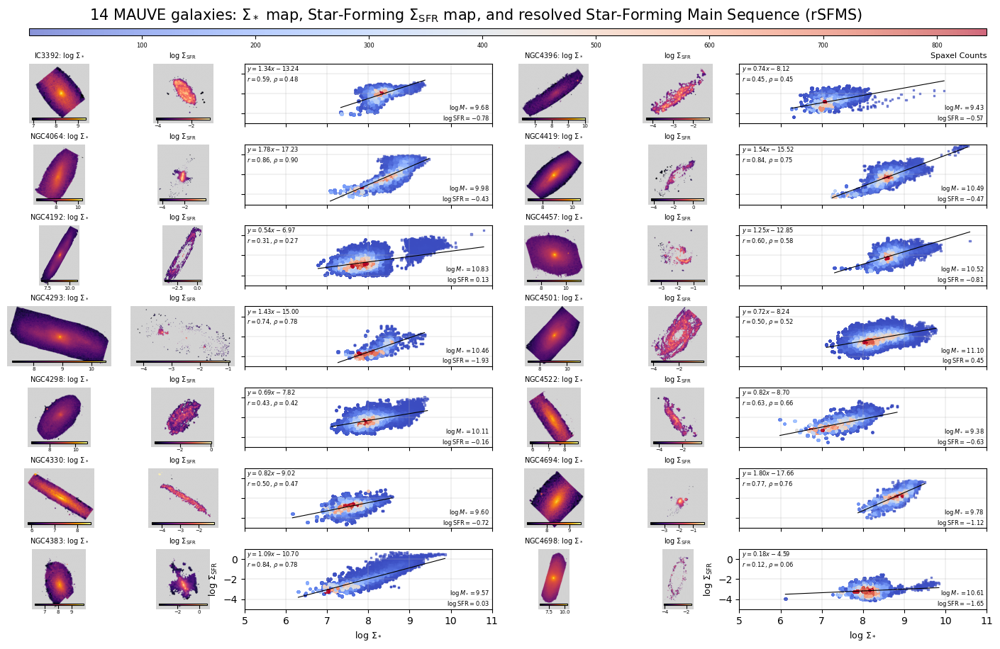

In [12]:
# --------------------------------------------------------------
# Enhanced rSFMS plots with density coloring, NaN handling, and log annotations
# --------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress, spearmanr
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import re

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# 0 · discover galaxies & colour palette
bins      = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bins]          # 14 expected
ngal      = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

cmap   = plt.get_cmap('tab20').colors
colour = {g: cmap[i % len(cmap)] for i, g in enumerate(galaxies)}

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
    return sigM, sigSFR_SF

# 1 · figure & GridSpec  (rows=7, cols=6 → two 3-column blocks)
fig = plt.figure(figsize=(18, 10))                      # still ~16:9
gs  = GridSpec(
        nrows=7, ncols=6, figure=fig,
        width_ratios=[1, 1, 2, 1, 1, 2],                # Σ*, Σ_SFR, SFMS
        wspace=0.00, hspace=0.35
)

scatter_for_cbar = None  # Store scatter plot for colorbar

for idx, gal in enumerate(galaxies):
    row  = idx % 7                      # 0–6
    blk  = idx // 7                     # 0 or 1   (left / right big column)
    col0 = blk * 3                      # 0 or 3   (start col of that block)

    sigM, sigSFR_SF = load_maps(gal)
    good         = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    x, y         = sigM[good], sigSFR_SF[good]

    k, b, r, *_  = linregress(x, y)
    rho, _       = spearmanr(x, y)
    xx           = np.linspace(x.min(), x.max(), 200)
    yy           = k*xx + b

    # Σ* map with NaN shown as light gray
    axM = fig.add_subplot(gs[row, col0])
    # Set up colormap with built-in NaN handling
    cmap_M = plt.cm.inferno.copy()
    cmap_M.set_bad('lightgray')
    
    imM = axM.imshow(sigM, origin='lower', cmap=cmap_M)
    axM.set_title(rf'{gal}: $\log\,\Sigma_*$', fontsize=7)
    axM.axis('off')
    cax = inset_axes(axM, width='90%', height='3%', loc='lower center',
                     borderpad=0.4)
    fig.colorbar(imM, cax=cax, orientation='horizontal')
    cax.tick_params(labelsize=5, pad=1)

    # Σ_SFR map with NaN shown as light gray
    axS = fig.add_subplot(gs[row, col0+1])
    # Set up colormap with built-in NaN handling
    cmap_S = plt.cm.magma.copy()
    cmap_S.set_bad('lightgray')
    
    imS = axS.imshow(sigSFR_SF, origin='lower', cmap=cmap_S)
    axS.set_title(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=7)
    axS.axis('off')
    cax2 = inset_axes(axS, width='90%', height='3%', loc='lower center',
                      borderpad=0.4)
    fig.colorbar(imS, cax=cax2, orientation='horizontal')
    cax2.tick_params(labelsize=5, pad=1)

    # SFMS scatter with density-based coloring
    axP = fig.add_subplot(gs[row, col0+2])
    
    # Create 2D histogram for density calculation
    H, xedges, yedges = np.histogram2d(x, y, bins=50, range=[[5, 11], [-6, 2]])
    
    # Find bin indices for each point
    x_idx = np.digitize(x, xedges) - 1
    y_idx = np.digitize(y, yedges) - 1
    
    # Clip indices to valid range
    x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
    y_idx = np.clip(y_idx, 0, H.shape[1] - 1)
    
    # Get density for each point
    density = H[x_idx, y_idx]
    
    # Create scatter plot colored by density
    scatter = axP.scatter(x, y, c=density, s=3, alpha=0.6, marker=',', cmap='coolwarm')
    axP.plot(xx, yy, lw=0.8, color='black')  # Use black for fit line to stand out
    
    # Store scatter plot for colorbar (use the first one)
    if scatter_for_cbar is None:
        scatter_for_cbar = scatter
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

    if row == 6:                               # bottom row gets labels
        axP.set_xlabel(r'$\log\,\Sigma_*$', fontsize=9)
        axP.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}$', fontsize=9)
    else:
        axP.set_xticklabels([]); axP.set_yticklabels([])

    # Top left: regression statistics
    axP.text(0.01, 0.99,
             fr'$y={k:.2f}x{b:+.2f}$' '\n' fr'$r={r:.2f},\,\rho={rho:.2f}$',
             transform=axP.transAxes, va='top', ha='left', fontsize=6,
             bbox=dict(facecolor='none', alpha=0.7, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none'))

# Add horizontal colorbar for density
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.92, 0.75, 0.01])  # [left, bottom, width, height]
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=8, loc='right')
    cbar.ax.tick_params(labelsize=6)

# 2 · global title
fig.suptitle(
    r'14 MAUVE galaxies: $\Sigma_*$ map, Star-Forming $\Sigma_{\mathrm{SFR}}$ map, and resolved '
    r'Star-Forming Main Sequence (rSFMS)',
    fontsize=15, y=0.96
)
plt.tight_layout()
plt.savefig('mauve_14galaxies_mass_sfr_rSFMS.pdf')
plt.savefig('mauve_14galaxies_mass_sfr_rSFMS.png', dpi=600)
plt.show()

IC3392: log M* = 9.68, log SFR = -0.78
NGC4064: log M* = 9.98, log SFR = -0.43
NGC4192: log M* = 10.83, log SFR = 0.13
NGC4293: log M* = 10.46, log SFR = -1.93
NGC4298: log M* = 10.11, log SFR = -0.16
NGC4330: log M* = 9.60, log SFR = -0.72
NGC4383: log M* = 9.57, log SFR = 0.03
NGC4396: log M* = 9.43, log SFR = -0.57
NGC4419: log M* = 10.49, log SFR = -0.47
NGC4457: log M* = 10.52, log SFR = -0.81
NGC4501: log M* = 11.10, log SFR = 0.45
NGC4522: log M* = 9.38, log SFR = -0.63
NGC4694: log M* = 9.78, log SFR = -1.12
NGC4698: log M* = 10.61, log SFR = -1.65


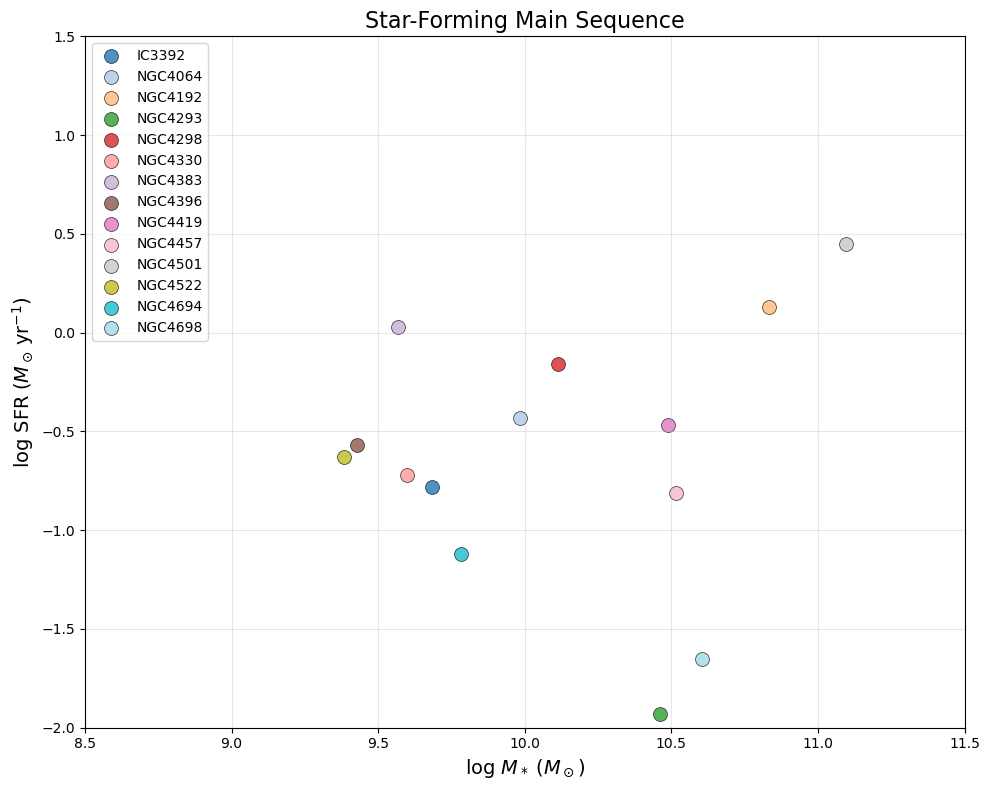


Plotted 14 galaxies with valid mass and SFR data


In [13]:
# ------------------------------------------------------------------
# Single SFMS plot: Total Stellar Mass vs Total SFR from log files
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# Discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Extract total masses and SFRs
log_masses = []
log_sfrs = []
galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        galaxy_names.append(gal)
        print(f"{gal}: log M* = {mass:.2f}, log SFR = {sfr:.2f}")
    else:
        print(f"Warning: Could not extract data for {gal}")

# Convert to numpy arrays
log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Create the plot
fig, ax = plt.subplots(figsize=(10, 8))

# Color-code each galaxy
colors = plt.cm.tab20(np.linspace(0, 1, len(galaxy_names)))

for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, galaxy_names)):
    ax.scatter(mass, sfr, s=100, c=[colors[i]], label=gal, alpha=0.8, edgecolors='black', linewidth=0.5)

# Add labels and formatting
ax.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=14)
ax.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=14)
ax.set_title('Star-Forming Main Sequence', fontsize=16)
ax.grid(True, alpha=0.3)

# Add legend
ax.legend(loc='upper left', fontsize=10)

# Set reasonable axis limits
ax.set_xlim(8.5, 11.5)
ax.set_ylim(-2, 1.5)

plt.tight_layout()
plt.show()

print(f"\nPlotted {len(galaxy_names)} galaxies with valid mass and SFR data")

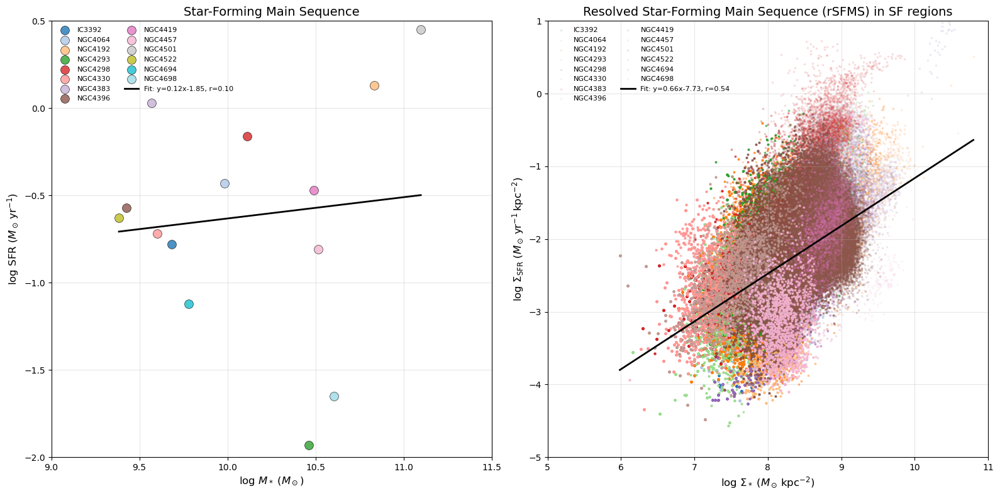

Subplot 1: Plotted 14 galaxies with valid total mass and SFR data
Subplot 2: Plotted spatially-resolved data for 14 galaxies


In [14]:
# ------------------------------------------------------------------
# Combined Plot: Total SFMS + Spatially-resolved Star Formation
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
import itertools
from scipy.stats import linregress
from astropy.io import fits

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# ------------------------------------------------------------------
# SUBPLOT 1: Total Stellar Mass vs Total SFR from log files
# ------------------------------------------------------------------

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# Discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Extract total masses and SFRs
log_masses = []
log_sfrs = []
galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        galaxy_names.append(gal)

# Convert to numpy arrays
log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Color-code each galaxy
colors_total = plt.cm.tab20(np.linspace(0, 1, len(galaxy_names)))

for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, galaxy_names)):
    ax1.scatter(mass, sfr, s=100, c=[colors_total[i]], label=gal, alpha=0.8, 
               edgecolors='black', linewidth=0.5)

# Fit regression line to total SFMS data
if len(log_masses) > 1:
    slope_total, intercept_total, r_val_total, p_val_total, _ = linregress(log_masses, log_sfrs)
    
    # Plot fit line
    xx_total = np.linspace(log_masses.min(), log_masses.max(), 200)
    yy_total = slope_total * xx_total + intercept_total
    ax1.plot(xx_total, yy_total, 'k-', linewidth=2, 
             label=f'Fit: y={slope_total:.2f}x{intercept_total:+.2f}, r={r_val_total:.2f}')

# Add labels and formatting for subplot 1
ax1.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=12)
ax1.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=12)
ax1.set_title('Star-Forming Main Sequence', fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper left', fontsize=8, ncol=2, frameon=False)
ax1.set_xlim(9, 11.5)
ax1.set_ylim(-2.0, 0.5)

# ------------------------------------------------------------------
# SUBPLOT 2: Spatially-resolved Σ* vs ΣSFR
# ------------------------------------------------------------------

# Colour cycle for spatially-resolved plot
colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# Collect all data points for global fit
all_x = []
all_y = []

for gal, colour in zip(galaxies, colors_spatial):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
    if not bin_file.exists() or not gas_file.exists():
        continue

    # Read FITS extensions
    try:
        with fits.open(bin_file) as hdul:
            logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
        with fits.open(gas_file) as hdul:
            logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

        # Mask bad pixels
        good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

        # Scatter plot
        ax2.scatter(
            logSigmaM[good],
            logSigmaSFR[good],
            s=1, 
            marker=',', 
            alpha=0.1,
            color=colour,
            label=gal
        )
        
        # Collect points for global fit
        all_x.extend(logSigmaM[good])
        all_y.extend(logSigmaSFR[good])
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Convert to numpy arrays for fitting
all_x = np.array(all_x)
all_y = np.array(all_y)

# Fit regression to all points
if len(all_x) > 0:
    slope, intercept, r_val, p_val, _ = linregress(all_x, all_y)

    # Plot fit line
    xx = np.linspace(all_x.min(), all_x.max(), 200)
    yy = slope * xx + intercept
    ax2.plot(xx, yy, 'k-', linewidth=2, 
             label=f'Fit: y={slope:.2f}x{intercept:+.2f}, r={r_val:.2f}')

# Final cosmetics for subplot 2
ax2.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_title(r'Resolved Star-Forming Main Sequence (rSFMS) in SF regions', fontsize=14)
ax2.set_xlim(5, 11)
ax2.set_ylim(-5, 1)
ax2.grid(True, alpha=0.3)
ax2.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

plt.tight_layout()
plt.show()

print(f"Subplot 1: Plotted {len(galaxy_names)} galaxies with valid total mass and SFR data")
print(f"Subplot 2: Plotted spatially-resolved data for {len([g for g in galaxies if Path(f'{g}_SPATIAL_BINNING_maps_extended.fits').exists()])} galaxies")

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/3387108293.py:182: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.06, 0.06, 1, 0.85])


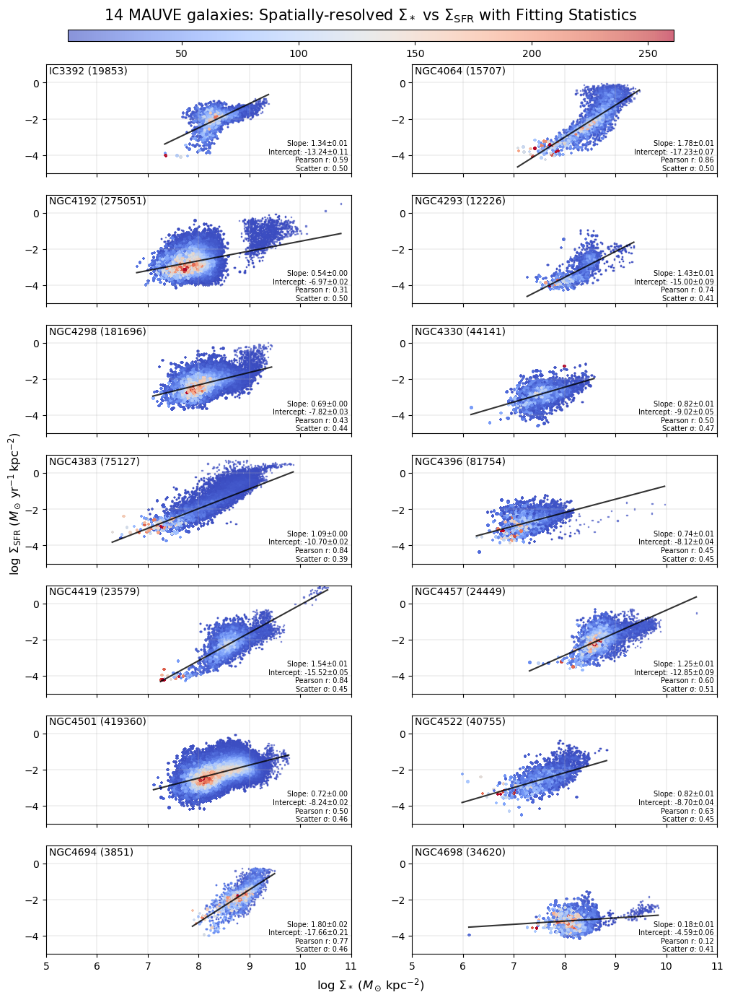

COMPREHENSIVE FITTING STATISTICS
Galaxy       Slope          Intercept      Pearson R    Scatter σ   
Name         ±Error         ±Error         Coeff.       (dex)       
------------------------------------------------------------------------------------------
IC3392         1.34±0.01   -13.24±0.11         0.59        0.50
NGC4064        1.78±0.01   -17.23±0.07         0.86        0.50
NGC4192        0.54±0.00    -6.97±0.02         0.31        0.50
NGC4293        1.43±0.01   -15.00±0.09         0.74        0.41
NGC4298        0.69±0.00    -7.82±0.03         0.43        0.44
NGC4330        0.82±0.01    -9.02±0.05         0.50        0.47
NGC4383        1.09±0.00   -10.70±0.02         0.84        0.39
NGC4396        0.74±0.01    -8.12±0.04         0.45        0.45
NGC4419        1.54±0.01   -15.52±0.05         0.84        0.45
NGC4457        1.25±0.01   -12.85±0.09         0.60        0.51
NGC4501        0.72±0.00    -8.24±0.02         0.50        0.46
NGC4522        0.82±0.01    -8.70±

In [15]:
# ------------------------------------------------------------------
# ENHANCED PLOT: resolved SFMS with comprehensive fitting statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress, spearmanr

# 0 · discover galaxies & colour palette
bins      = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies  = [f.name.split('_')[0] for f in bins]          # 14 expected
ngal      = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

def calculate_fit_statistics(x, y):
    """Calculate comprehensive fitting statistics"""
    # Perform linear regression
    slope, intercept, r_val, p_val, std_err = linregress(x, y)
    
    # Calculate slope and intercept errors
    n = len(x)
    
    # Calculate standard error of slope and intercept
    x_mean = np.mean(x)
    ss_xx = np.sum((x - x_mean)**2)
    ss_yy = np.sum((y - np.mean(y))**2)
    ss_xy = np.sum((x - x_mean) * (y - np.mean(y)))
    
    # Residual standard error
    y_pred = slope * x + intercept
    scatter = y - y_pred
    mse = np.sum(scatter**2) / (n - 2)  # mean squared error
    rmse = np.sqrt(mse)  # root mean squared error
    
    # Standard errors
    slope_err = rmse / np.sqrt(ss_xx)
    intercept_err = rmse * np.sqrt(1/n + x_mean**2/ss_xx)
    
    # Standard deviation of y-axis after subtracting best-fit
    std_scatter = np.std(scatter, ddof=2)  # ddof=2 for linear regression
    
    return {
        'slope': slope,
        'slope_err': slope_err,
        'intercept': intercept,
        'intercept_err': intercept_err,
        'pearson_r': r_val,
        'std_scatter': std_scatter,
        'y_pred': y_pred,
        'scatter': scatter
    }

# 1 · figure & GridSpec (2 columns layout)
fig = plt.figure(figsize=(12, 16))
gs  = GridSpec(
        nrows=7, ncols=2, figure=fig,
        wspace=0.2, hspace=0.2
)

plot_idx = 0  # Track position for plotting
scatter_for_cbar = None  # Store scatter plot for colorbar
all_stats = {}  # Store statistics for all galaxies

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    # Check for valid data in either dataset
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    # Skip if no valid data points in either dataset
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = plot_idx // 2  # 0-6
    col = plot_idx % 2   # 0 or 1
    plot_idx += 1

    # SFMS scatter with both datasets
    axP = fig.add_subplot(gs[row, col])
    
    # Calculate percentages for non-nan values relative to sigSFR
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    # Plot SF data with density-based colormap and perform fitting
    stats = None
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate comprehensive fitting statistics
        stats = calculate_fit_statistics(x_sf, y_sf)
        all_stats[gal] = stats  # Store for later printing
        
        # Create 2D histogram for density calculation
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        
        # Find bin indices for each point
        x_idx = np.digitize(x_sf, xedges) - 1
        y_idx = np.digitize(y_sf, yedges) - 1
        
        # Clip indices to valid range
        x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
        y_idx = np.clip(y_idx, 0, H.shape[1] - 1)
        
        # Get density for each point
        density = H[x_idx, y_idx]
        
        # Create scatter plot colored by density
        scatter_plot = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot the best-fit line
        xx = np.linspace(x_sf.min(), x_sf.max(), 200)
        yy = stats['slope'] * xx + stats['intercept']
        axP.plot(xx, yy, 'k-', linewidth=1.5, alpha=0.8)
        
        # Store scatter plot for colorbar (use the first one)
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter_plot
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)
    
    # Add galaxy name and datapoint count as annotation in top left
    if np.any(good_SF):
        count_text = f"{gal} ({len(x_sf)})"
    else:
        count_text = f"{gal} (0)"
    
    axP.text(0.01, 0.99, count_text, transform=axP.transAxes, va='top', ha='left', 
             fontsize=10, bbox=dict(facecolor='none', alpha=0.8, edgecolor='none'))

    # Add fitting statistics in bottom right if available
    if stats is not None:
        stats_text = (f"Slope: {stats['slope']:.2f}±{stats['slope_err']:.2f}\n"
                     f"Intercept: {stats['intercept']:.2f}±{stats['intercept_err']:.2f}\n"
                     f"Pearson r: {stats['pearson_r']:.2f}\n"
                     f"Scatter σ: {stats['std_scatter']:.2f}")
        axP.text(0.99, 0.01, stats_text, transform=axP.transAxes, va='bottom', ha='right',
                fontsize=7, bbox=dict(facecolor='none', alpha=0.8, edgecolor='none'))

    # Remove individual x axis ticks except for the last row
    if row == 6:  # Last row gets x labels
        pass
    else:
        axP.set_xticklabels([])

# Add horizontal colorbar below the suptitle
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.9, 0.7, 0.01])  # [left, bottom, width, height]
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    # cbar.set_label('Number Density', fontsize=10)

# Add shared axis labels using fig.text
fig.text(0.5, 0.08,
         r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=12)
fig.text(0.08, 0.5,
         r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$',
         va='center', rotation='vertical', fontsize=12)

# 2 · global title
fig.suptitle(
    fr'{ngal} MAUVE galaxies: Spatially-resolved $\Sigma_*{{\rm\ vs\ }}\Sigma_{{\mathrm{{SFR}}}}$ with Fitting Statistics',
    fontsize=15, y=0.93
)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.85])
plt.show()

# 3 · Print comprehensive fitting statistics for each galaxy (using stored stats)
print("="*90)
print("COMPREHENSIVE FITTING STATISTICS")
print("="*90)
print(f"{'Galaxy':<12} {'Slope':<14} {'Intercept':<14} {'Pearson R':<12} {'Scatter σ':<12}")
print(f"{'Name':<12} {'±Error':<14} {'±Error':<14} {'Coeff.':<12} {'(dex)':<12}")
print("-"*90)

for gal in galaxies:
    if gal in all_stats:
        stats = all_stats[gal]
        print(f"{gal:<12} {stats['slope']:>6.2f}±{stats['slope_err']:<6.2f} "
              f"{stats['intercept']:>6.2f}±{stats['intercept_err']:<6.2f} "
              f"{stats['pearson_r']:>10.2f}  {stats['std_scatter']:>10.2f}")
    else:
        print(f"{gal:<12} {'No SF data available':<54}")

print("="*90)


Total data points from all galaxies: 1252169


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/1978311965.py:148: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.85])


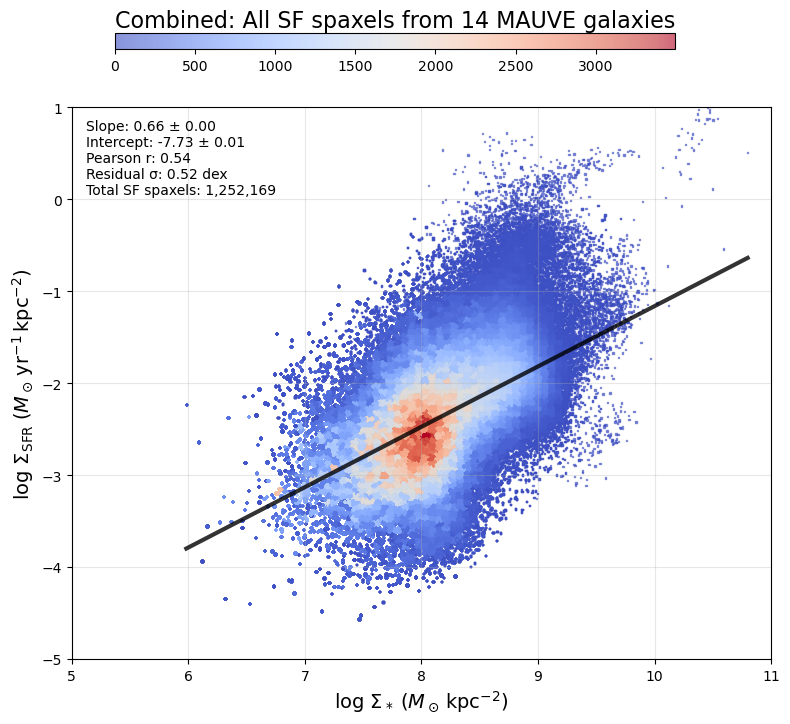

COMBINED FITTING STATISTICS - ALL SF SPAXELS FROM 14 GALAXIES
Total SF spaxels: 1,252,169
Slope: 0.66 ± 0.00
Intercept: -7.73 ± 0.01
Pearson correlation coefficient: 0.54
Standard deviation of residuals: 0.52 dex

GALAXY CONTRIBUTIONS:
----------------------------------------
IC3392      : 19,853 spaxels (  1.6%)
NGC4064     : 15,707 spaxels (  1.3%)
NGC4192     : 275,051 spaxels ( 22.0%)
NGC4293     : 12,226 spaxels (  1.0%)
NGC4298     : 181,696 spaxels ( 14.5%)
NGC4330     : 44,141 spaxels (  3.5%)
NGC4383     : 75,127 spaxels (  6.0%)
NGC4396     : 81,754 spaxels (  6.5%)
NGC4419     : 23,579 spaxels (  1.9%)
NGC4457     : 24,449 spaxels (  2.0%)
NGC4501     : 419,360 spaxels ( 33.5%)
NGC4522     : 40,755 spaxels (  3.3%)
NGC4694     :  3,851 spaxels (  0.3%)
NGC4698     : 34,620 spaxels (  2.8%)
----------------------------------------
Total       : 1,252,169 spaxels (100.0%)


In [16]:
# ------------------------------------------------------------------
# COMBINED PLOT: All SF spaxels from all 14 galaxies with fitting analysis
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress
import itertools

# 0 · discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)

# Colour cycle for individual galaxies
colors = itertools.cycle(plt.get_cmap('tab20').colors)

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
    return sigM, sigSFR_SF

def calculate_fit_statistics(x, y):
    """Calculate comprehensive fitting statistics"""
    # Perform linear regression
    slope, intercept, r_val, p_val, std_err = linregress(x, y)
    
    # Calculate slope and intercept errors
    n = len(x)
    
    # Calculate standard error of slope and intercept
    x_mean = np.mean(x)
    ss_xx = np.sum((x - x_mean)**2)
    
    # Residual standard error
    y_pred = slope * x + intercept
    residuals = y - y_pred
    mse = np.sum(residuals**2) / (n - 2)  # mean squared error
    rmse = np.sqrt(mse)  # root mean squared error
    
    # Standard errors
    slope_err = rmse / np.sqrt(ss_xx)
    intercept_err = rmse * np.sqrt(1/n + x_mean**2/ss_xx)
    
    # Standard deviation of y-axis after subtracting best-fit
    std_residuals = np.std(residuals, ddof=2)  # ddof=2 for linear regression
    
    return {
        'slope': slope,
        'slope_err': slope_err,
        'intercept': intercept,
        'intercept_err': intercept_err,
        'pearson_r': r_val,
        'std_residuals': std_residuals,
        'y_pred': y_pred,
        'residuals': residuals
    }

# 1 · Create single figure with proper layout for colorbar
fig = plt.figure(figsize=(8, 8))

# Collect all data points for global fit
all_x = []
all_y = []
galaxy_counts = {}

for gal, colour in zip(galaxies, colors):
    sigM, sigSFR_SF = load_maps(gal)
    
    # Check for valid SF data
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Collect points for global fit
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0
        print(f"Skipping {gal}: no valid SF data")

# Convert to numpy arrays for fitting
all_x = np.array(all_x)
all_y = np.array(all_y)

# Create 2D histogram for density calculation of ALL combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])

# Find bin indices for each point
x_idx = np.digitize(all_x, xedges) - 1
y_idx = np.digitize(all_y, yedges) - 1

# Clip indices to valid range
x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
y_idx = np.clip(y_idx, 0, H.shape[1] - 1)

# Get density for each point
density = H[x_idx, y_idx]

# Create scatter plot colored by density
scatter = plt.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                     cmap='coolwarm', label=f'All SF spaxels (n={len(all_x):,})')

# Calculate comprehensive fitting statistics for all combined data
print(f"Total data points from all galaxies: {len(all_x)}")
global_stats = calculate_fit_statistics(all_x, all_y)

# Plot global fit line
xx = np.linspace(all_x.min(), all_x.max(), 200)
yy = global_stats['slope'] * xx + global_stats['intercept']
plt.plot(xx, yy, 'k-', linewidth=3, alpha=0.8, 
         label=f'Combined Fit')

# 2 · Plot formatting
plt.xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=14)
plt.ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=14)
plt.xlim(5, 11)
plt.ylim(-5, 1)
plt.grid(True, alpha=0.3)

# Add comprehensive fitting statistics as text annotation
stats_text = (f"Slope: {global_stats['slope']:.2f} ± {global_stats['slope_err']:.2f}\n"
              f"Intercept: {global_stats['intercept']:.2f} ± {global_stats['intercept_err']:.2f}\n"
              f"Pearson r: {global_stats['pearson_r']:.2f}\n"
              f"Residual σ: {global_stats['std_residuals']:.2f} dex\n"
              f"Total SF spaxels: {len(all_x):,}")

plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes, 
         va='top', ha='left', fontsize=10,
         bbox=dict(facecolor='none', alpha=0.9, edgecolor='none', pad=10))

# Add horizontal colorbar below the title
cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
# cbar.set_label('Number Density', fontsize=12)

# Add title with space for colorbar
fig.suptitle(r'Combined: All SF spaxels from 14 MAUVE galaxies', fontsize=16, y=0.90)

# Legend
# plt.legend(frameon=True, fontsize=10, loc='lower right')

plt.tight_layout(rect=[0, 0, 1, 0.85])
plt.show()

# 3 · Print detailed statistics
print("="*90)
print("COMBINED FITTING STATISTICS - ALL SF SPAXELS FROM 14 GALAXIES")
print("="*90)
print(f"Total SF spaxels: {len(all_x):,}")
print(f"Slope: {global_stats['slope']:.2f} ± {global_stats['slope_err']:.2f}")
print(f"Intercept: {global_stats['intercept']:.2f} ± {global_stats['intercept_err']:.2f}")
print(f"Pearson correlation coefficient: {global_stats['pearson_r']:.2f}")
print(f"Standard deviation of residuals: {global_stats['std_residuals']:.2f} dex")
print("="*90)

# 4 · Show individual galaxy contributions
print("\nGALAXY CONTRIBUTIONS:")
print("-"*40)
total_spaxels = sum(galaxy_counts.values())
for gal in galaxies:
    count = galaxy_counts[gal]
    percentage = (count / total_spaxels * 100) if total_spaxels > 0 else 0
    print(f"{gal:<12}: {count:>6,} spaxels ({percentage:>5.1f}%)")
print("-"*40)
print(f"{'Total':<12}: {total_spaxels:>6,} spaxels (100.0%)")
print("="*90)

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/1968775248.py:201: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


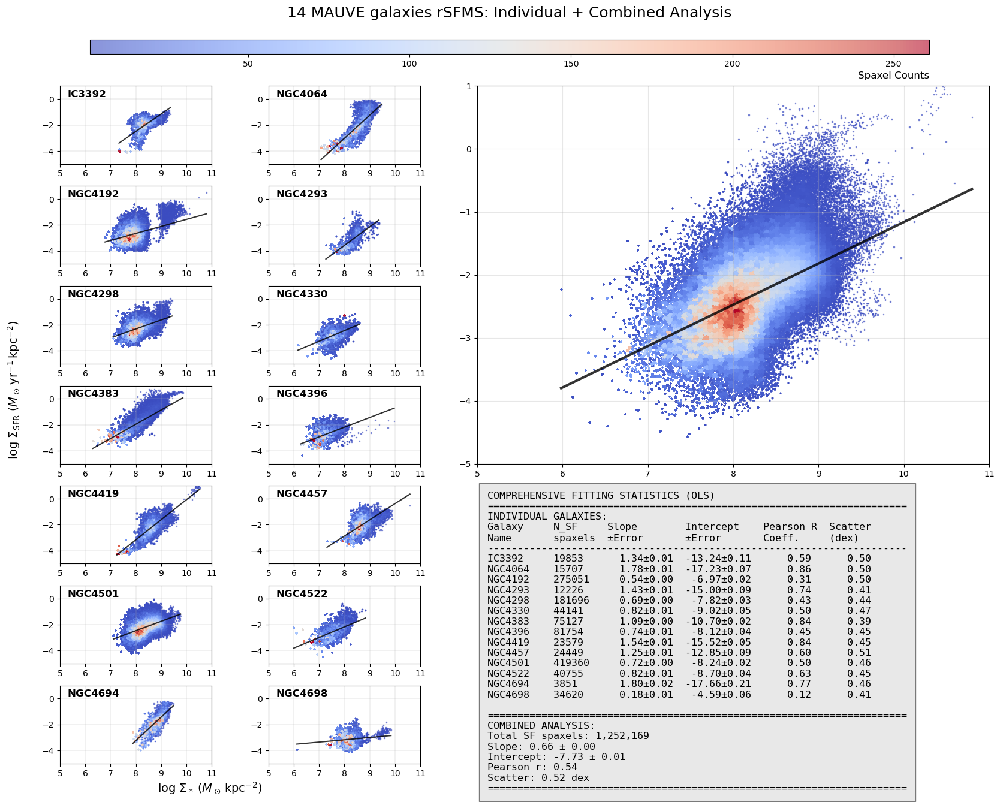

In [17]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
from scipy.stats import linregress
import itertools

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

def calculate_fit_statistics(x, y):
    """Calculate comprehensive fitting statistics"""
    slope, intercept, r_val, p_val, std_err = linregress(x, y)
    n = len(x)
    x_mean = np.mean(x)
    ss_xx = np.sum((x - x_mean)**2)
    
    y_pred = slope * x + intercept
    residuals = y - y_pred
    mse = np.sum(residuals**2) / (n - 2)
    rmse = np.sqrt(mse)
    
    slope_err = rmse / np.sqrt(ss_xx)
    intercept_err = rmse * np.sqrt(1/n + x_mean**2/ss_xx)
    std_residuals = np.std(residuals, ddof=2)
    
    return {
        'slope': slope, 'slope_err': slope_err,
        'intercept': intercept, 'intercept_err': intercept_err,
        'pearson_r': r_val, 'std_residuals': std_residuals,
        'y_pred': y_pred, 'residuals': residuals
    }

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots (from cell 15)
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    stats = None
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        stats = calculate_fit_statistics(x_sf, y_sf)
        individual_stats.append((gal, stats))
        
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        xx = np.linspace(x_sf.min(), x_sf.max(), 200)
        yy = stats['slope'] * xx + stats['intercept']
        axP.plot(xx, yy, 'k-', linewidth=1.5, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot (from cell 16) - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)
global_stats = calculate_fit_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Fit line
xx = np.linspace(all_x.min(), all_x.max(), 200)
yy = global_stats['slope'] * xx + global_stats['intercept']
ax_combined.plot(xx, yy, 'k-', linewidth=3, alpha=0.8)

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)
# ax_combined.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_combined.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:5])  # Spans rows 5-7, last 2 cols 
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "COMPREHENSIVE FITTING STATISTICS (OLS)\n"
stats_table += "="*70 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Slope':<12} {'Intercept':<12} {'Pearson R':<10} {'Scatter':<10}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'±Error':<12} {'±Error':<12} {'Coeff.':<10} {'(dex)':<10}\n"
stats_table += "-"*70 + "\n"

for gal, stats in individual_stats:
    n_sf = galaxy_counts[gal]
    stats_table += (f"{gal:<10} {n_sf:<8} {stats['slope']:>6.2f}±{stats['slope_err']:<5.2f} "
                   f"{stats['intercept']:>6.2f}±{stats['intercept_err']:<5.2f} "
                   f"{stats['pearson_r']:>8.2f}  {stats['std_residuals']:>8.2f}\n")

stats_table += "\n" + "="*70 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
stats_table += f"Slope: {global_stats['slope']:.2f} ± {global_stats['slope_err']:.2f}\n"
stats_table += f"Intercept: {global_stats['intercept']:.2f} ± {global_stats['intercept_err']:.2f}\n"
stats_table += f"Pearson r: {global_stats['pearson_r']:.2f}\n"
stats_table += f"Scatter: {global_stats['std_residuals']:.2f} dex\n"
stats_table += "="*70

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


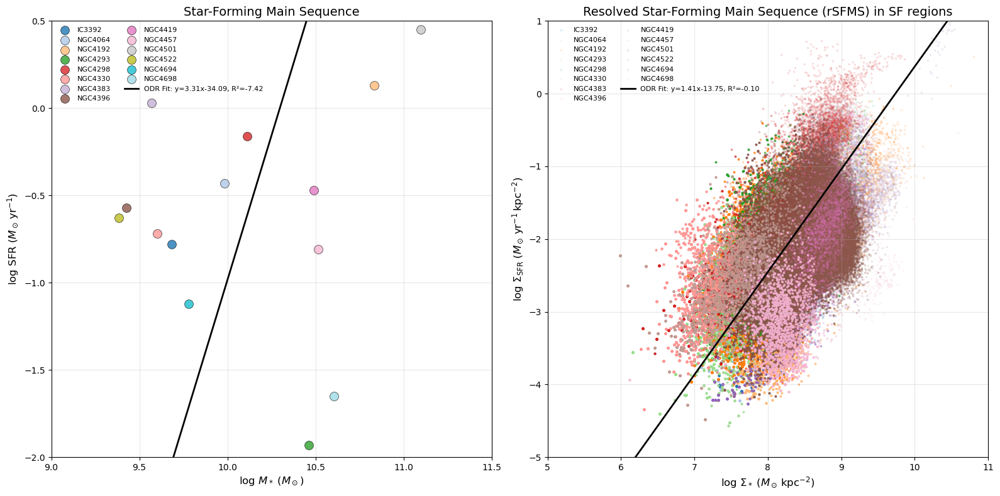

Subplot 1: Plotted 14 galaxies with valid total mass and SFR data
Subplot 2: Plotted spatially-resolved data for 14 galaxies


In [18]:
# ------------------------------------------------------------------
# Combined Plot: Total SFMS + Spatially-resolved Star Formation
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
import itertools
from scipy import odr
from astropy.io import fits

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# ------------------------------------------------------------------
# SUBPLOT 1: Total Stellar Mass vs Total SFR from log files
# ------------------------------------------------------------------

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# Define linear function for ODR
def linear_func(p, x):
    return p[0] * x + p[1]

# Discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Extract total masses and SFRs
log_masses = []
log_sfrs = []
galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        galaxy_names.append(gal)

# Convert to numpy arrays
log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Color-code each galaxy
colors_total = plt.cm.tab20(np.linspace(0, 1, len(galaxy_names)))

for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, galaxy_names)):
    ax1.scatter(mass, sfr, s=100, c=[colors_total[i]], label=gal, alpha=0.8, 
               edgecolors='black', linewidth=0.5)

# Fit ODR regression line to total SFMS data
if len(log_masses) > 1:
    # Set up ODR
    linear_model = odr.Model(linear_func)
    data = odr.RealData(log_masses, log_sfrs)
    odr_obj = odr.ODR(data, linear_model, beta0=[1., 0.])
    output = odr_obj.run()
    
    slope_total, intercept_total = output.beta
    
    # Calculate R-squared manually for ODR
    y_pred = linear_func(output.beta, log_masses)
    ss_res = np.sum((log_sfrs - y_pred) ** 2)
    ss_tot = np.sum((log_sfrs - np.mean(log_sfrs)) ** 2)
    r_squared_total = 1 - (ss_res / ss_tot)
    
    # Plot fit line
    xx_total = np.linspace(log_masses.min(), log_masses.max(), 200)
    yy_total = linear_func(output.beta, xx_total)
    ax1.plot(xx_total, yy_total, 'k-', linewidth=2, 
             label=f'ODR Fit: y={slope_total:.2f}x{intercept_total:+.2f}, R²={r_squared_total:.2f}')

# Add labels and formatting for subplot 1
ax1.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=12)
ax1.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=12)
ax1.set_title('Star-Forming Main Sequence', fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper left', fontsize=8, ncol=2, frameon=False)
ax1.set_xlim(9, 11.5)
ax1.set_ylim(-2, 0.5)

# ------------------------------------------------------------------
# SUBPLOT 2: Spatially-resolved Σ* vs ΣSFR
# ------------------------------------------------------------------

# Colour cycle for spatially-resolved plot
colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# Collect all data points for global fit
all_x = []
all_y = []

for gal, colour in zip(galaxies, colors_spatial):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
    if not bin_file.exists() or not gas_file.exists():
        continue

    # Read FITS extensions
    try:
        with fits.open(bin_file) as hdul:
            logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
        with fits.open(gas_file) as hdul:
            logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

        # Mask bad pixels
        good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

        # Scatter plot
        ax2.scatter(
            logSigmaM[good],
            logSigmaSFR[good],
            s=1, 
            marker=',', 
            alpha=0.1,
            color=colour,
            label=gal
        )
        
        # Collect points for global fit
        all_x.extend(logSigmaM[good])
        all_y.extend(logSigmaSFR[good])
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Convert to numpy arrays for fitting
all_x = np.array(all_x)
all_y = np.array(all_y)

# Fit ODR regression to all points
if len(all_x) > 0:
    # Set up ODR
    linear_model = odr.Model(linear_func)
    data = odr.RealData(all_x, all_y)
    odr_obj = odr.ODR(data, linear_model, beta0=[1., 0.])
    output = odr_obj.run()
    
    slope, intercept = output.beta
    
    # Calculate R-squared manually for ODR
    y_pred = linear_func(output.beta, all_x)
    ss_res = np.sum((all_y - y_pred) ** 2)
    ss_tot = np.sum((all_y - np.mean(all_y)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)

    # Plot fit line
    xx = np.linspace(all_x.min(), all_x.max(), 200)
    yy = linear_func(output.beta, xx)
    ax2.plot(xx, yy, 'k-', linewidth=2, 
             label=f'ODR Fit: y={slope:.2f}x{intercept:+.2f}, R²={r_squared:.2f}')

# Final cosmetics for subplot 2
ax2.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_title(r'Resolved Star-Forming Main Sequence (rSFMS) in SF regions', fontsize=14)
ax2.set_xlim(5, 11)
ax2.set_ylim(-5, 1)
ax2.grid(True, alpha=0.3)
ax2.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

plt.tight_layout()
plt.show()

print(f"Subplot 1: Plotted {len(galaxy_names)} galaxies with valid total mass and SFR data")
print(f"Subplot 2: Plotted spatially-resolved data for {len([g for g in galaxies if Path(f'{g}_SPATIAL_BINNING_maps_extended.fits').exists()])} galaxies")

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/2587708471.py:189: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.06, 0.06, 1, 0.85])


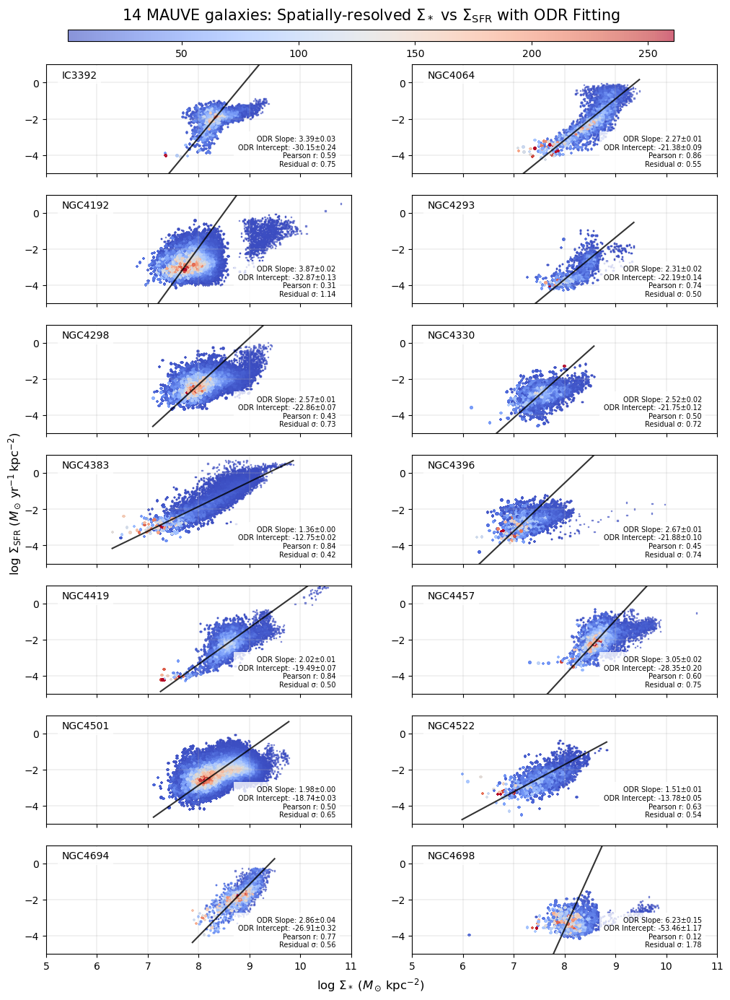

COMPREHENSIVE ODR FITTING STATISTICS - INDIVIDUAL GALAXIES
Galaxy       ODR Slope      ODR Intercept  Pearson R    Residual σ  
Name         ±Error         ±Error         Coeff.       (dex)       
------------------------------------------------------------------------------------------
IC3392         3.39±0.03   -30.15±0.24         0.59        0.75
NGC4064        2.27±0.01   -21.38±0.09         0.86        0.55
NGC4192        3.87±0.02   -32.87±0.13         0.31        1.14
NGC4293        2.31±0.02   -22.19±0.14         0.74        0.50
NGC4298        2.57±0.01   -22.86±0.07         0.43        0.73
NGC4330        2.52±0.02   -21.75±0.12         0.50        0.72
NGC4383        1.36±0.00   -12.75±0.02         0.84        0.42
NGC4396        2.67±0.01   -21.88±0.10         0.45        0.74
NGC4419        2.02±0.01   -19.49±0.07         0.84        0.50
NGC4457        3.05±0.02   -28.35±0.20         0.60        0.75
NGC4501        1.98±0.00   -18.74±0.03         0.50        0.65
NGC4522 

In [19]:
# ------------------------------------------------------------------
# INDIVIDUAL GALAXY PLOTS with Orthogonal Distance Regression (ODR)
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
from scipy import odr
from scipy.stats import linregress

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

def linear_func(p, x):
    """Linear function for ODR: y = p[0] * x + p[1]"""
    return p[0] * x + p[1]

def calculate_odr_statistics(x, y):
    """Calculate comprehensive ODR fitting statistics"""
    # Create ODR model
    linear_model = odr.Model(linear_func)
    data = odr.RealData(x, y)
    
    # Initial guess for parameters [slope, intercept] using OLS
    slope_ols, intercept_ols, r_val, p_val, std_err_ols = linregress(x, y)
    
    # Set up ODR
    odr_obj = odr.ODR(data, linear_model, beta0=[slope_ols, intercept_ols])
    odr_result = odr_obj.run()
    
    # Extract results
    slope_odr = odr_result.beta[0]
    intercept_odr = odr_result.beta[1]
    slope_err = odr_result.sd_beta[0]
    intercept_err = odr_result.sd_beta[1]
    
    # Calculate fitted values and residuals
    y_pred = linear_func(odr_result.beta, x)
    residuals = y - y_pred
    
    # Calculate Pearson correlation coefficient (same as OLS)
    pearson_r = np.corrcoef(x, y)[0, 1]
    
    # Standard deviation of orthogonal residuals
    std_residuals = np.std(residuals, ddof=2)
    
    return {
        'slope': slope_odr,
        'slope_err': slope_err,
        'intercept': intercept_odr,
        'intercept_err': intercept_err,
        'pearson_r': pearson_r,
        'std_residuals': std_residuals,
        'y_pred': y_pred,
        'residuals': residuals,
        'odr_result': odr_result
    }

# 1 · figure & GridSpec (2 columns layout)
fig = plt.figure(figsize=(12, 16))
gs = GridSpec(
    nrows=7, ncols=2, figure=fig,
    wspace=0.2, hspace=0.2
)

plot_idx = 0
scatter_for_cbar = None
individual_odr_stats = []

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    # Check for valid data in either dataset
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    # Skip if no valid data points in either dataset
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = plot_idx // 2  # 0-6
    col = plot_idx % 2   # 0 or 1
    plot_idx += 1

    # SFMS scatter with both datasets
    axP = fig.add_subplot(gs[row, col])
    
    # Calculate percentages for non-nan values relative to sigSFR
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    # Plot SF data with density-based colormap and perform ODR fitting
    stats = None
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate comprehensive ODR fitting statistics
        try:
            stats = calculate_odr_statistics(x_sf, y_sf)
            individual_odr_stats.append((gal, stats))
        except Exception as e:
            print(f"ODR fitting failed for {gal}: {e}")
            continue
        
        # Create 2D histogram for density calculation
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        
        # Find bin indices for each point
        x_idx = np.digitize(x_sf, xedges) - 1
        y_idx = np.digitize(y_sf, yedges) - 1
        
        # Clip indices to valid range
        x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
        y_idx = np.clip(y_idx, 0, H.shape[1] - 1)
        
        # Get density for each point
        density = H[x_idx, y_idx]
        
        # Create scatter plot colored by density
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot the ODR best-fit line
        xx = np.linspace(x_sf.min(), x_sf.max(), 200)
        yy = linear_func(stats['odr_result'].beta, xx)
        axP.plot(xx, yy, 'k-', linewidth=1.5, alpha=0.8)
        
        # Store scatter plot for colorbar (use the first one)
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)
    
    # Add galaxy name as annotation in top left
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, va='top', ha='left', 
             fontsize=10, bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Add ODR fitting statistics in bottom right if available
    if stats is not None:
        stats_text = (f"ODR Slope: {stats['slope']:.2f}±{stats['slope_err']:.2f}\n"
                     f"ODR Intercept: {stats['intercept']:.2f}±{stats['intercept_err']:.2f}\n"
                     f"Pearson r: {stats['pearson_r']:.2f}\n"
                     f"Residual σ: {stats['std_residuals']:.2f}")
        axP.text(0.95, 0.05, stats_text, transform=axP.transAxes, va='bottom', ha='right',
                fontsize=7, bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

    # Remove individual x axis ticks except for the last row
    if row == 6:  # Last row gets x labels
        pass
    else:
        axP.set_xticklabels([])

# Add horizontal colorbar below the suptitle
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.9, 0.7, 0.01])  # [left, bottom, width, height]
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    # cbar.set_label('Number Density', fontsize=10)

# Add shared axis labels using fig.text
fig.text(0.5, 0.08,
         r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=12)
fig.text(0.08, 0.5,
         r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$',
         va='center', rotation='vertical', fontsize=12)

# 2 · global title
fig.suptitle(
    fr'{ngal} MAUVE galaxies: Spatially-resolved $\Sigma_*{{\rm\ vs\ }}\Sigma_{{\mathrm{{SFR}}}}$ with ODR Fitting',
    fontsize=15, y=0.93
)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.85])
plt.show()

# 3 · Print comprehensive ODR fitting statistics for each galaxy
print("="*90)
print("COMPREHENSIVE ODR FITTING STATISTICS - INDIVIDUAL GALAXIES")
print("="*90)
print(f"{'Galaxy':<12} {'ODR Slope':<14} {'ODR Intercept':<14} {'Pearson R':<12} {'Residual σ':<12}")
print(f"{'Name':<12} {'±Error':<14} {'±Error':<14} {'Coeff.':<12} {'(dex)':<12}")
print("-"*90)

for gal, stats in individual_odr_stats:
    print(f"{gal:<12} {stats['slope']:>6.2f}±{stats['slope_err']:<6.2f} "
          f"{stats['intercept']:>6.2f}±{stats['intercept_err']:<6.2f} "
          f"{stats['pearson_r']:>10.2f}  {stats['std_residuals']:>10.2f}")

print("="*90)

# 4 · Compare ODR vs OLS for each galaxy
print("\nODR vs OLS COMPARISON FOR EACH GALAXY:")
print("="*90)
print(f"{'Galaxy':<12} {'ODR Slope':<12} {'OLS Slope':<12} {'Slope Diff':<12} {'ODR Inter':<12} {'OLS Inter':<12} {'Inter Diff':<12}")
print("-"*90)

for gal, odr_stats in individual_odr_stats:
    # Calculate OLS for comparison
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        slope_ols, intercept_ols, r_ols, p_ols, stderr_ols = linregress(x_sf, y_sf)
        
        slope_diff = abs(odr_stats['slope'] - slope_ols)
        inter_diff = abs(odr_stats['intercept'] - intercept_ols)
        
        print(f"{gal:<12} {odr_stats['slope']:>10.3f}  {slope_ols:>10.3f}  {slope_diff:>10.3f}  "
              f"{odr_stats['intercept']:>10.3f}  {intercept_ols:>10.3f}  {inter_diff:>10.3f}")

print("="*90)

Total data points from all galaxies: 1252169
Performing Orthogonal Distance Regression (ODR)...


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/835598731.py:158: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.85])


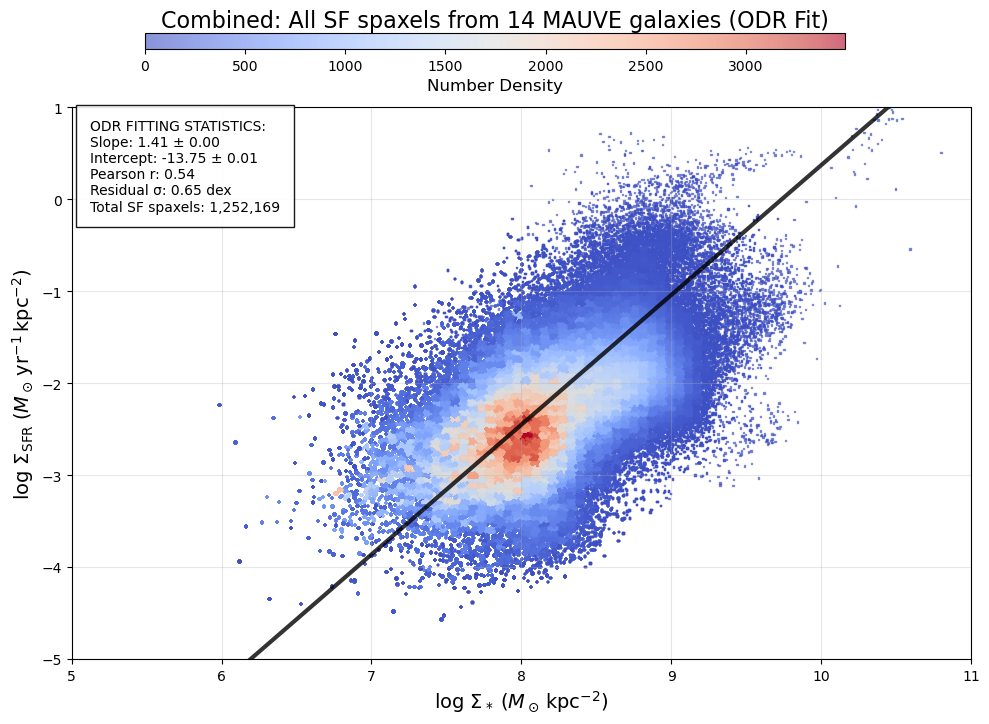

ODR FITTING STATISTICS - ALL SF SPAXELS FROM 14 GALAXIES
Total SF spaxels: 1,252,169
Slope (ODR): 1.41 ± 0.00
Intercept (ODR): -13.75 ± 0.01
Pearson correlation coefficient: 0.54
Standard deviation of residuals: 0.65 dex

ODR vs OLS COMPARISON:
--------------------------------------------------
ODR Slope:     1.4122 ± 0.0014
OLS Slope:     0.6568 ± 0.0009
ODR Intercept: -13.7495 ± 0.0112
OLS Intercept: -7.7298
Difference in slope: 0.7554
Difference in intercept: 6.0197


In [20]:
# ------------------------------------------------------------------
# COMBINED PLOT with Orthogonal Distance Regression (ODR)
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
from scipy import odr
import itertools

# 0 · discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
    return sigM, sigSFR_SF

def linear_func(p, x):
    """Linear function for ODR: y = p[0] * x + p[1]"""
    return p[0] * x + p[1]

def calculate_odr_statistics(x, y):
    """Calculate comprehensive ODR fitting statistics"""
    # Create ODR model
    linear_model = odr.Model(linear_func)
    data = odr.RealData(x, y)
    
    # Initial guess for parameters [slope, intercept]
    # Use OLS as initial guess
    from scipy.stats import linregress
    slope_ols, intercept_ols, r_val, p_val, std_err_ols = linregress(x, y)
    
    # Set up ODR
    odr_obj = odr.ODR(data, linear_model, beta0=[slope_ols, intercept_ols])
    odr_result = odr_obj.run()
    
    # Extract results
    slope_odr = odr_result.beta[0]
    intercept_odr = odr_result.beta[1]
    slope_err = odr_result.sd_beta[0]
    intercept_err = odr_result.sd_beta[1]
    
    # Calculate fitted values and residuals
    y_pred = linear_func(odr_result.beta, x)
    residuals = y - y_pred
    
    # Calculate Pearson correlation coefficient (same as OLS)
    pearson_r = np.corrcoef(x, y)[0, 1]
    
    # Standard deviation of orthogonal residuals
    std_residuals = np.std(residuals, ddof=2)
    
    return {
        'slope': slope_odr,
        'slope_err': slope_err,
        'intercept': intercept_odr,
        'intercept_err': intercept_err,
        'pearson_r': pearson_r,
        'std_residuals': std_residuals,
        'y_pred': y_pred,
        'residuals': residuals,
        'odr_result': odr_result
    }

# 1 · Create single figure with proper layout for colorbar
fig = plt.figure(figsize=(10, 8))

# Collect all data points for global fit
all_x = []
all_y = []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR_SF = load_maps(gal)
    
    # Check for valid SF data
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Collect points for global fit
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0
        print(f"Skipping {gal}: no valid SF data")

# Convert to numpy arrays for fitting
all_x = np.array(all_x)
all_y = np.array(all_y)

# Create 2D histogram for density calculation of ALL combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])

# Find bin indices for each point
x_idx = np.digitize(all_x, xedges) - 1
y_idx = np.digitize(all_y, yedges) - 1

# Clip indices to valid range
x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
y_idx = np.clip(y_idx, 0, H.shape[1] - 1)

# Get density for each point
density = H[x_idx, y_idx]

# Create scatter plot colored by density
scatter = plt.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                     cmap='coolwarm', label=f'All SF spaxels (n={len(all_x):,})')

# Calculate comprehensive ODR fitting statistics for all combined data
print(f"Total data points from all galaxies: {len(all_x)}")
print("Performing Orthogonal Distance Regression (ODR)...")
global_stats = calculate_odr_statistics(all_x, all_y)

# Plot ODR fit line
xx = np.linspace(all_x.min(), all_x.max(), 200)
yy = linear_func(global_stats['odr_result'].beta, xx)
plt.plot(xx, yy, 'k-', linewidth=3, alpha=0.8, 
         label=f'ODR Fit')

# 2 · Plot formatting
plt.xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=14)
plt.ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=14)
plt.xlim(5, 11)
plt.ylim(-5, 1)
plt.grid(True, alpha=0.3)

# Add comprehensive ODR fitting statistics as text annotation
stats_text = (f"ODR FITTING STATISTICS:\n"
              f"Slope: {global_stats['slope']:.2f} ± {global_stats['slope_err']:.2f}\n"
              f"Intercept: {global_stats['intercept']:.2f} ± {global_stats['intercept_err']:.2f}\n"
              f"Pearson r: {global_stats['pearson_r']:.2f}\n"
              f"Residual σ: {global_stats['std_residuals']:.2f} dex\n"
              f"Total SF spaxels: {len(all_x):,}")

plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes, 
         va='top', ha='left', fontsize=10,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='black', pad=10))

# Add horizontal colorbar below the title
cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Number Density', fontsize=12)

# Add title with space for colorbar
fig.suptitle(r'Combined: All SF spaxels from 14 MAUVE galaxies (ODR Fit)', fontsize=16, y=0.90)

# # Legend
# plt.legend(frameon=True, fontsize=10, loc='lower right')

plt.tight_layout(rect=[0, 0, 1, 0.85])
plt.show()

# 3 · Print detailed ODR statistics
print("="*90)
print("ODR FITTING STATISTICS - ALL SF SPAXELS FROM 14 GALAXIES")
print("="*90)
print(f"Total SF spaxels: {len(all_x):,}")
print(f"Slope (ODR): {global_stats['slope']:.2f} ± {global_stats['slope_err']:.2f}")
print(f"Intercept (ODR): {global_stats['intercept']:.2f} ± {global_stats['intercept_err']:.2f}")
print(f"Pearson correlation coefficient: {global_stats['pearson_r']:.2f}")
print(f"Standard deviation of residuals: {global_stats['std_residuals']:.2f} dex")
print("="*90)

# 4 · Additional ODR-specific information
print("\nODR vs OLS COMPARISON:")
print("-"*50)
# Quick OLS comparison for reference
from scipy.stats import linregress
slope_ols, intercept_ols, r_ols, p_ols, stderr_ols = linregress(all_x, all_y)
print(f"ODR Slope:     {global_stats['slope']:.4f} ± {global_stats['slope_err']:.4f}")
print(f"OLS Slope:     {slope_ols:.4f} ± {stderr_ols:.4f}")
print(f"ODR Intercept: {global_stats['intercept']:.4f} ± {global_stats['intercept_err']:.4f}")
print(f"OLS Intercept: {intercept_ols:.4f}")
print(f"Difference in slope: {abs(global_stats['slope'] - slope_ols):.4f}")
print(f"Difference in intercept: {abs(global_stats['intercept'] - intercept_ols):.4f}")
print("="*90)

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/2619404158.py:217: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


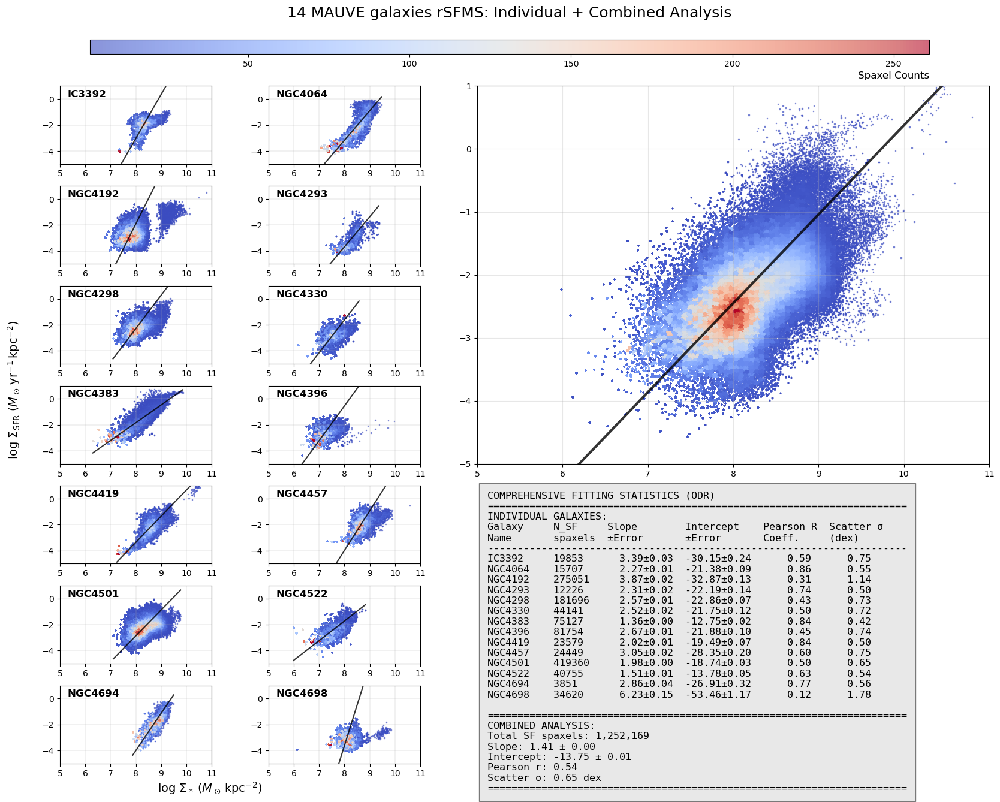

In [21]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
from scipy import odr
from scipy.stats import linregress
import itertools

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

def linear_func(p, x):
    """Linear function for ODR: y = p[0] * x + p[1]"""
    return p[0] * x + p[1]

def calculate_fit_statistics(x, y):
    """Calculate comprehensive fitting statistics using ODR"""
    # Create ODR model
    linear_model = odr.Model(linear_func)
    data = odr.RealData(x, y)
    
    # Initial guess using OLS
    slope_ols, intercept_ols, r_val, p_val, std_err_ols = linregress(x, y)
    
    # Set up ODR
    odr_obj = odr.ODR(data, linear_model, beta0=[slope_ols, intercept_ols])
    odr_result = odr_obj.run()
    
    # Extract ODR results
    slope = odr_result.beta[0]
    intercept = odr_result.beta[1]
    slope_err = odr_result.sd_beta[0]
    intercept_err = odr_result.sd_beta[1]
    
    # Calculate fitted values and residuals
    y_pred = slope * x + intercept
    residuals = y - y_pred
    std_residuals = np.std(residuals, ddof=2)
    
    # Calculate Pearson correlation coefficient (same as OLS)
    pearson_r = np.corrcoef(x, y)[0, 1]
    
    return {
        'slope': slope, 'slope_err': slope_err,
        'intercept': intercept, 'intercept_err': intercept_err,
        'pearson_r': pearson_r, 'std_residuals': std_residuals,
        'y_pred': y_pred, 'residuals': residuals
    }

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots (from cell 15)
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    stats = None
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        stats = calculate_fit_statistics(x_sf, y_sf)
        individual_stats.append((gal, stats))
        
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        xx = np.linspace(x_sf.min(), x_sf.max(), 200)
        yy = stats['slope'] * xx + stats['intercept']
        axP.plot(xx, yy, 'k-', linewidth=1.5, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot (from cell 16) - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)
global_stats = calculate_fit_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Fit line
xx = np.linspace(all_x.min(), all_x.max(), 200)
yy = global_stats['slope'] * xx + global_stats['intercept']
ax_combined.plot(xx, yy, 'k-', linewidth=3, alpha=0.8)

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)
# ax_combined.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax_combined.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "COMPREHENSIVE FITTING STATISTICS (ODR)\n"
stats_table += "="*70 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Slope':<12} {'Intercept':<12} {'Pearson R':<10} {'Scatter σ':<10}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'±Error':<12} {'±Error':<12} {'Coeff.':<10} {'(dex)':<10}\n"
stats_table += "-"*70 + "\n"

for gal, stats in individual_stats:
    n_sf = galaxy_counts[gal]
    stats_table += (f"{gal:<10} {n_sf:<8} {stats['slope']:>6.2f}±{stats['slope_err']:<5.2f} "
                   f"{stats['intercept']:>6.2f}±{stats['intercept_err']:<5.2f} "
                   f"{stats['pearson_r']:>8.2f}  {stats['std_residuals']:>8.2f}\n")

stats_table += "\n" + "="*70 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
stats_table += f"Slope: {global_stats['slope']:.2f} ± {global_stats['slope_err']:.2f}\n"
stats_table += f"Intercept: {global_stats['intercept']:.2f} ± {global_stats['intercept_err']:.2f}\n"
stats_table += f"Pearson r: {global_stats['pearson_r']:.2f}\n"
stats_table += f"Scatter σ: {global_stats['std_residuals']:.2f} dex\n"
stats_table += "="*70

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/2375944927.py:131: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.85])


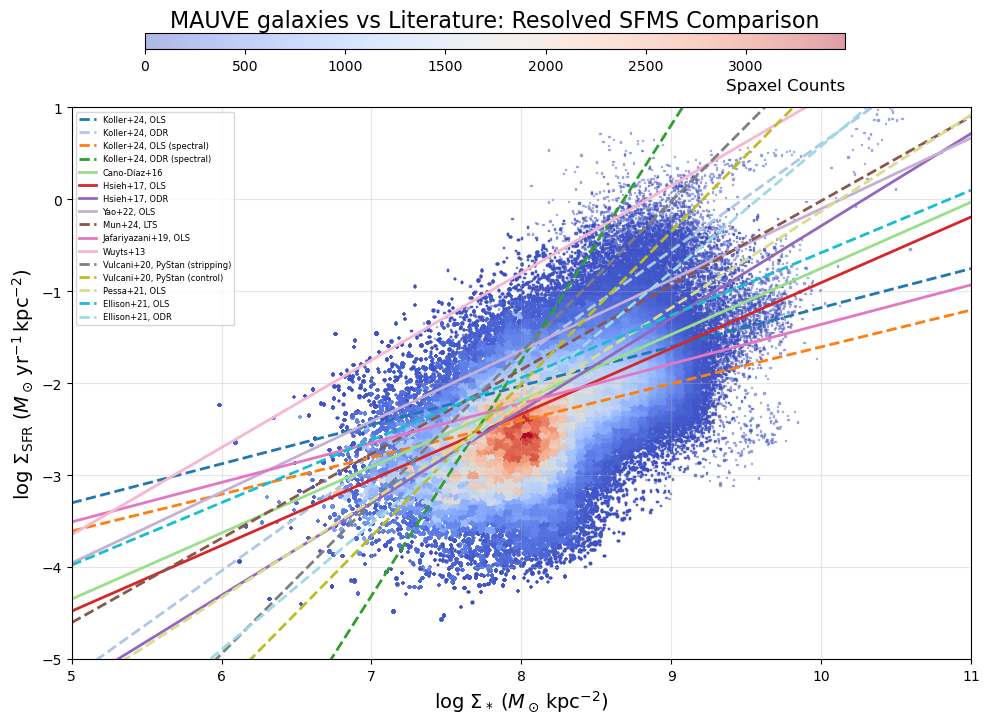

In [22]:
# ------------------------------------------------------------------
# COMBINED PLOT - Data Visualization with Literature Comparison
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits

# 0 · discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
    return sigM, sigSFR_SF

# 1 · Create single figure with proper layout for colorbar
fig, ax_combined = plt.subplots(figsize=(10, 8))

# Collect all data points
all_x = []
all_y = []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR_SF = load_maps(gal)
    
    # Check for valid SF data
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Collect points
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0
        print(f"Skipping {gal}: no valid SF data")

# Convert to numpy arrays
all_x = np.array(all_x)
all_y = np.array(all_y)

# Create 2D histogram for density calculation of ALL combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])

# Find bin indices for each point
x_idx = np.digitize(all_x, xedges) - 1
y_idx = np.digitize(all_y, yedges) - 1

# Clip indices to valid range
x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
y_idx = np.clip(y_idx, 0, H.shape[1] - 1)

# Get density for each point
density = H[x_idx, y_idx]

# Create scatter plot colored by density
scatter = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.4, marker=',', 
                             cmap='coolwarm')

# Define x range for plotting literature fits
x = np.linspace(5, 11, 100)

# Data from table - plotting all references
plot_data = [
    # Reference 1: This work (SF-spaxels), OLS
    (0.425, -5.428, 'Koller+24, OLS', '--'),
    # Reference 1: This work (SF-spaxels), ODR  
    (1.162, -11.014, 'Koller+24, ODR', '--'),
    # Reference 2: This work (spectral decomposition), OLS
    (0.401, -5.615, 'Koller+24, OLS (spectral)', '--'),
    # Reference 2: This work (spectral decomposition), ODR
    (2.562, -22.248, 'Koller+24, ODR (spectral)', '--'),
    # Reference 3: Cano-Díaz et al. (2016)
    (0.72, -7.95, 'Cano-Díaz+16', '-'),
    # Reference 4: Hsieh et al. (2017), OLS
    (0.715, -8.056, 'Hsieh+17, OLS', '-'),
    # Reference 4: Hsieh et al. (2017), ODR
    (1.005, -10.338, 'Hsieh+17, ODR', '-'),
    # Reference 5: Yao et al. (2022), OLS
    (0.771, -7.812, 'Yao+22, OLS', '-'),
    # Reference 6: Mun et al. (2024), LTS
    (0.918, -9.196, 'Mun+24, LTS', '--'),
    # Reference 7: Jafariyazani et al. (2019), OLS
    (0.43, -5.66, 'Jafariyazani+19, OLS', '-'),
    # Reference 8: Wuyts et al. (2013)
    (0.95, -8.4, 'Wuyts+13', '-'), 
    # Vulcani et al. (2020) - stripping sample
    (1.641, -14.79, 'Vulcani+20, PyStan (stripping)', '--'),
    # Vulcani et al. (2020) - control sample
    (1.659, -15.28, 'Vulcani+20, PyStan (control)', '--'),
    # Pessa et al. (2021) - OLS
    (1.05, -10.63, 'Pessa+21, OLS', '--'),
    # Ellison et al. (2021) - OLS
    (0.68, -7.38, 'Ellison+21, OLS', '--'),
    # Ellison et al. (2021) - ODR
    (1.37, -13.12, 'Ellison+21, ODR', '--')
]

# Plot all literature fits
colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
for i, (b, a, label, linestyle) in enumerate(plot_data):
    y = b * x + a
    ax_combined.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])

# 2 · Plot formatting
ax_combined.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=14)
ax_combined.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=14)
ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# Add legend with smaller font to fit all entries
ax_combined.legend(loc='upper left', fontsize=6, ncol=1, frameon=True, framealpha=0.8)

# Add horizontal colorbar below the title
cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Add title with space for colorbar
fig.suptitle(r'MAUVE galaxies vs Literature: Resolved SFMS Comparison', fontsize=16, y=0.90)

plt.tight_layout(rect=[0, 0, 1, 0.85])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/689447973.py:202: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


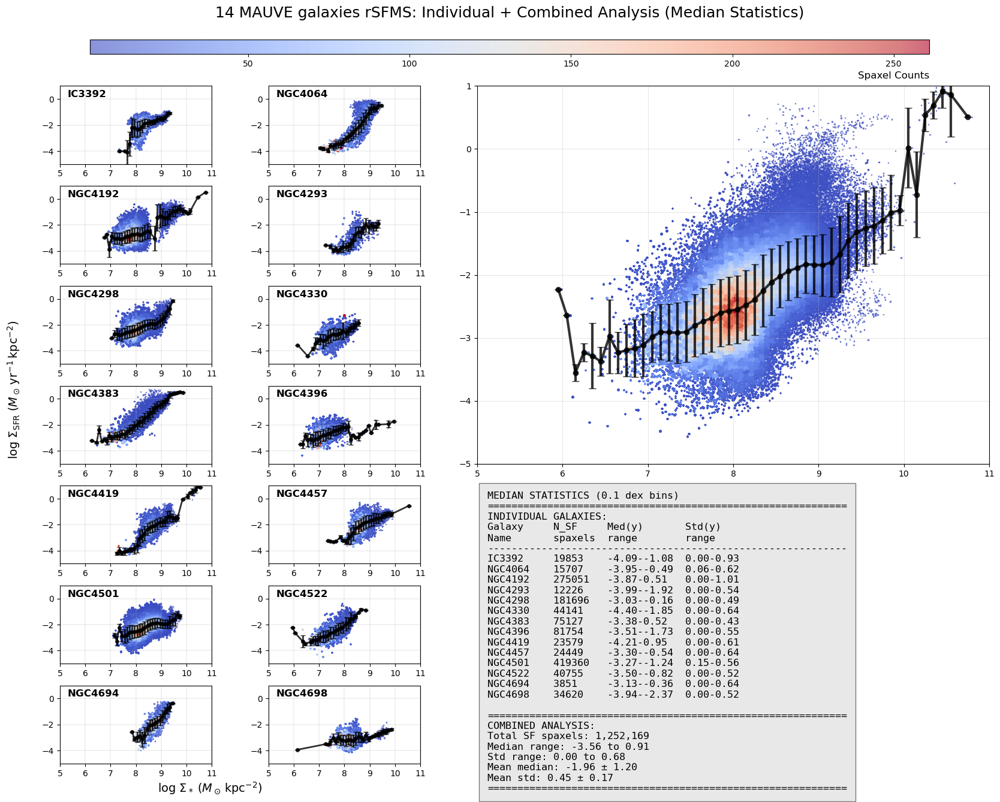

In [23]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

def calculate_median_statistics(x, y, x_range=(5, 11), bin_width=0.1):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if np.sum(mask) > 0:
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate median statistics
        x_med, y_med, y_std = calculate_median_statistics(x_sf, y_sf)
        individual_stats.append((gal, x_med, y_med, y_std, len(x_sf)))
        
        # Density-based scatter
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot median with error bars
        axP.errorbar(x_med, y_med, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)

# Calculate combined median statistics
x_med_combined, y_med_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined median with error bars
ax_combined.errorbar(x_med_combined, y_med_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.1 dex bins)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Med(y)':<12} {'Std(y)':<12}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12}\n"
stats_table += "-"*60 + "\n"

for gal, x_med, y_med, y_std, n_sf in individual_stats:
    if len(y_med) > 0:
        med_range = f"{y_med.min():.2f}-{y_med.max():.2f}"
        std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"
    else:
        med_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_sf:<8} {med_range:<12} {std_range:<12}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
if len(y_med_combined) > 0:
    stats_table += f"Median range: {y_med_combined.min():.2f} to {y_med_combined.max():.2f}\n"
    stats_table += f"Std range: {y_std_combined.min():.2f} to {y_std_combined.max():.2f}\n"
    stats_table += f"Mean median: {np.mean(y_med_combined):.2f} ± {np.std(y_med_combined):.2f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.2f} ± {np.std(y_std_combined):.2f}\n"
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis (Median Statistics)', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/4169083656.py:305: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


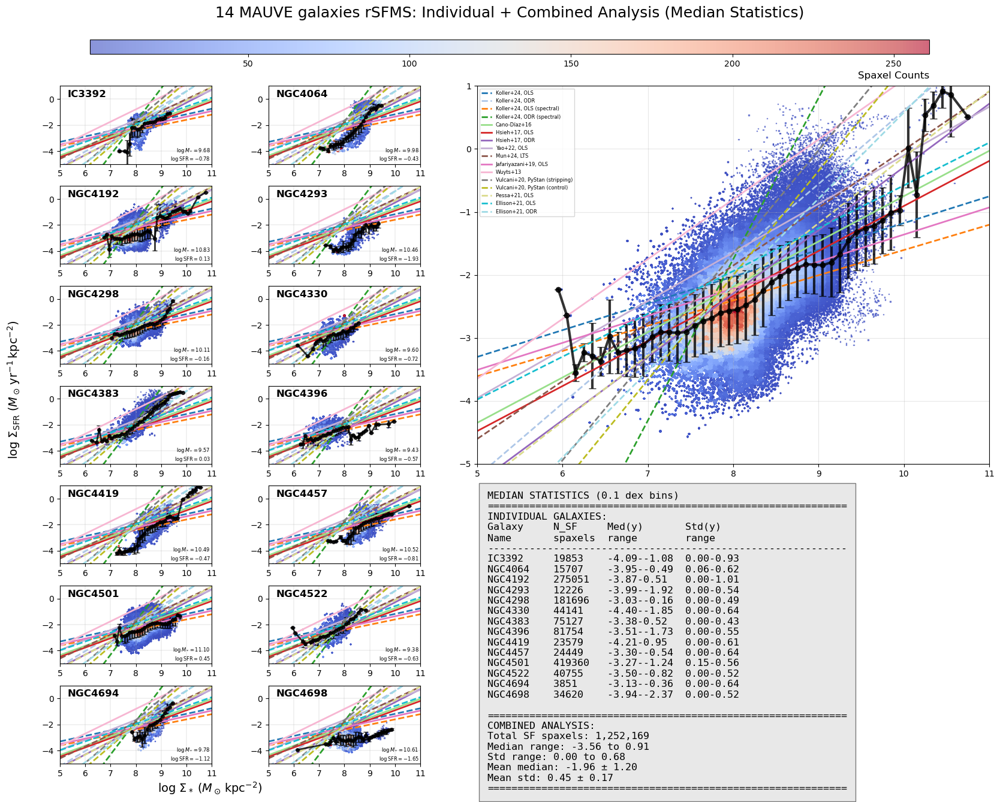

In [24]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(5, 11), bin_width=0.1):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if np.sum(mask) > 0:
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_fits(ax, show_legend=False):
    """Plot literature fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(5, 11, 100)
    
    # Data from table - plotting all references
    plot_data = [
        # Reference 1: This work (SF-spaxels), OLS
        (0.425, -5.428, 'Koller+24, OLS', '--'),
        # Reference 1: This work (SF-spaxels), ODR  
        (1.162, -11.014, 'Koller+24, ODR', '--'),
        # Reference 2: This work (spectral decomposition), OLS
        (0.401, -5.615, 'Koller+24, OLS (spectral)', '--'),
        # Reference 2: This work (spectral decomposition), ODR
        (2.562, -22.248, 'Koller+24, ODR (spectral)', '--'),
        # Reference 3: Cano-Díaz et al. (2016)
        (0.72, -7.95, 'Cano-Díaz+16', '-'),
        # Reference 4: Hsieh et al. (2017), OLS
        (0.715, -8.056, 'Hsieh+17, OLS', '-'),
        # Reference 4: Hsieh et al. (2017), ODR
        (1.005, -10.338, 'Hsieh+17, ODR', '-'),
        # Reference 5: Yao et al. (2022), OLS
        (0.771, -7.812, 'Yao+22, OLS', '-'),
        # Reference 6: Mun et al. (2024), LTS
        (0.918, -9.196, 'Mun+24, LTS', '--'),
        # Reference 7: Jafariyazani et al. (2019), OLS
        (0.43, -5.66, 'Jafariyazani+19, OLS', '-'),
        # Reference 8: Wuyts et al. (2013)
        (0.95, -8.4, 'Wuyts+13', '-'), 
        # Vulcani et al. (2020) - stripping sample
        (1.641, -14.79, 'Vulcani+20, PyStan (stripping)', '--'),
        # Vulcani et al. (2020) - control sample
        (1.659, -15.28, 'Vulcani+20, PyStan (control)', '--'),
        # Pessa et al. (2021) - OLS
        (1.05, -10.63, 'Pessa+21, OLS', '--'),
        # Ellison et al. (2021) - OLS
        (0.68, -7.38, 'Ellison+21, OLS', '--'),
        # Ellison et al. (2021) - ODR
        (1.37, -13.12, 'Ellison+21, ODR', '--')
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (b, a, label, linestyle) in enumerate(plot_data):
        y = b * x + a
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate median statistics
        x_med, y_med, y_std = calculate_median_statistics(x_sf, y_sf)
        individual_stats.append((gal, x_med, y_med, y_std, len(x_sf)))
        
        # Density-based scatter
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot median with error bars
        axP.errorbar(x_med, y_med, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add literature fits to individual panels (no legend)
    plot_literature_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)

# Calculate combined median statistics
x_med_combined, y_med_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined median with error bars
ax_combined.errorbar(x_med_combined, y_med_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

# Add literature fits to combined panel (with legend)
plot_literature_fits(ax_combined, show_legend=True)

# Add legend with small font
ax_combined.legend(fontsize=6, ncol=1, loc='upper left')

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.1 dex bins)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Med(y)':<12} {'Std(y)':<12}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12}\n"
stats_table += "-"*60 + "\n"

for gal, x_med, y_med, y_std, n_sf in individual_stats:
    if len(y_med) > 0:
        med_range = f"{y_med.min():.2f}-{y_med.max():.2f}"
        std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"
    else:
        med_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_sf:<8} {med_range:<12} {std_range:<12}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
if len(y_med_combined) > 0:
    stats_table += f"Median range: {y_med_combined.min():.2f} to {y_med_combined.max():.2f}\n"
    stats_table += f"Std range: {y_std_combined.min():.2f} to {y_std_combined.max():.2f}\n"
    stats_table += f"Mean median: {np.mean(y_med_combined):.2f} ± {np.std(y_med_combined):.2f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.2f} ± {np.std(y_std_combined):.2f}\n"
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis (Median Statistics)', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/3091152988.py:305: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


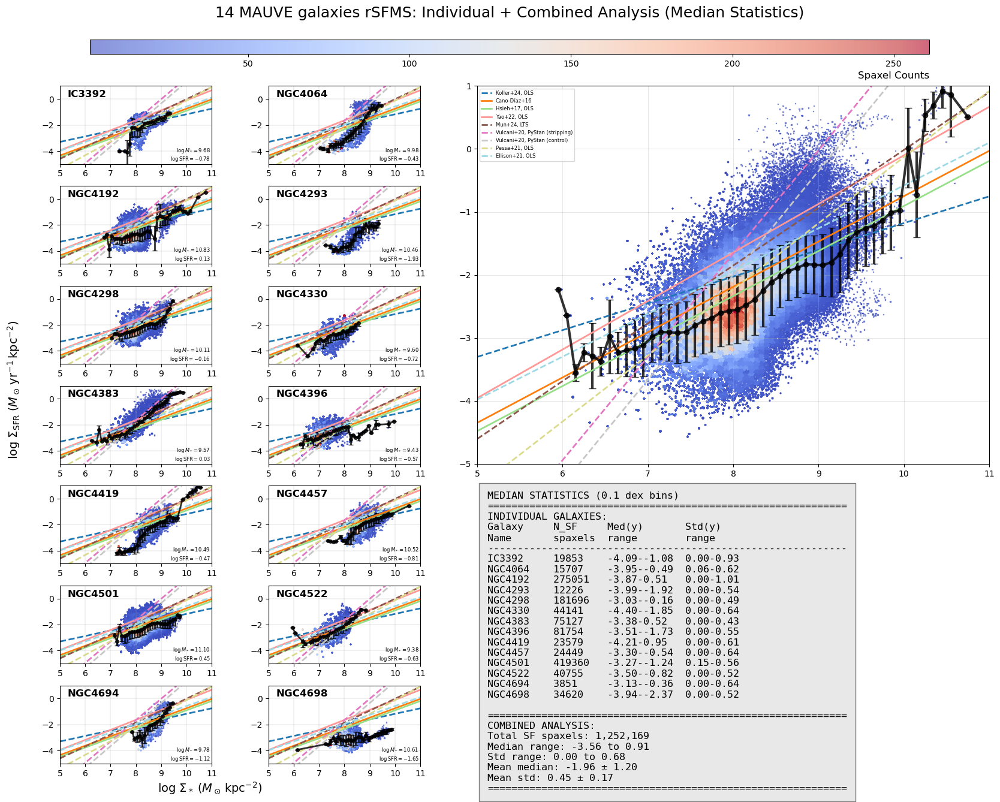

In [25]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(5, 11), bin_width=0.1):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if np.sum(mask) > 0:
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_fits(ax, show_legend=False):
    """Plot literature fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(5, 11, 100)
    
    # Data from table - plotting all references
    plot_data = [
        # Reference 1: This work (SF-spaxels), OLS
        (0.425, -5.428, 'Koller+24, OLS', '--'),
        # # Reference 1: This work (SF-spaxels), ODR  
        # (1.162, -11.014, 'Koller+24, ODR', '--'),
        # # # Reference 2: This work (spectral decomposition), OLS
        # # (0.401, -5.615, 'Koller+24, OLS (spectral)', '--'),
        # # # Reference 2: This work (spectral decomposition), ODR
        # # (2.562, -22.248, 'Koller+24, ODR (spectral)', '--'),
        # Reference 3: Cano-Díaz et al. (2016)
        (0.72, -7.95, 'Cano-Díaz+16', '-'),
        # Reference 4: Hsieh et al. (2017), OLS
        (0.715, -8.056, 'Hsieh+17, OLS', '-'),
        # # Reference 4: Hsieh et al. (2017), ODR
        # (1.005, -10.338, 'Hsieh+17, ODR', '-'),
        # Reference 5: Yao et al. (2022), OLS
        (0.771, -7.812, 'Yao+22, OLS', '-'),
        # Reference 6: Mun et al. (2024), LTS
        (0.918, -9.196, 'Mun+24, LTS', '--'),
        # # Reference 7: Jafariyazani et al. (2019), OLS
        # (0.43, -5.66, 'Jafariyazani+19, OLS', '-'),
        # # Reference 8: Wuyts et al. (2013)
        # (0.95, -8.4, 'Wuyts+13', '-'), 
        # Vulcani et al. (2020) - stripping sample
        (1.641, -14.79, 'Vulcani+20, PyStan (stripping)', '--'),
        # Vulcani et al. (2020) - control sample
        (1.659, -15.28, 'Vulcani+20, PyStan (control)', '--'),
        # Pessa et al. (2021) - OLS
        (1.05, -10.63, 'Pessa+21, OLS', '--'),
        # Ellison et al. (2021) - OLS
        (0.68, -7.38, 'Ellison+21, OLS', '--'),
        # # Ellison et al. (2021) - ODR
        # (1.37, -13.12, 'Ellison+21, ODR', '--')
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (b, a, label, linestyle) in enumerate(plot_data):
        y = b * x + a
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate median statistics
        x_med, y_med, y_std = calculate_median_statistics(x_sf, y_sf)
        individual_stats.append((gal, x_med, y_med, y_std, len(x_sf)))
        
        # Density-based scatter
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot median with error bars
        axP.errorbar(x_med, y_med, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add literature fits to individual panels (no legend)
    plot_literature_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)

# Calculate combined median statistics
x_med_combined, y_med_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined median with error bars
ax_combined.errorbar(x_med_combined, y_med_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

# Add literature fits to combined panel (with legend)
plot_literature_fits(ax_combined, show_legend=True)

# Add legend with small font
ax_combined.legend(fontsize=6, ncol=1, loc='upper left')

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.1 dex bins)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Med(y)':<12} {'Std(y)':<12}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12}\n"
stats_table += "-"*60 + "\n"

for gal, x_med, y_med, y_std, n_sf in individual_stats:
    if len(y_med) > 0:
        med_range = f"{y_med.min():.2f}-{y_med.max():.2f}"
        std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"
    else:
        med_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_sf:<8} {med_range:<12} {std_range:<12}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
if len(y_med_combined) > 0:
    stats_table += f"Median range: {y_med_combined.min():.2f} to {y_med_combined.max():.2f}\n"
    stats_table += f"Std range: {y_std_combined.min():.2f} to {y_std_combined.max():.2f}\n"
    stats_table += f"Mean median: {np.mean(y_med_combined):.2f} ± {np.std(y_med_combined):.2f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.2f} ± {np.std(y_std_combined):.2f}\n"
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis (Median Statistics)', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/3681474093.py:305: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


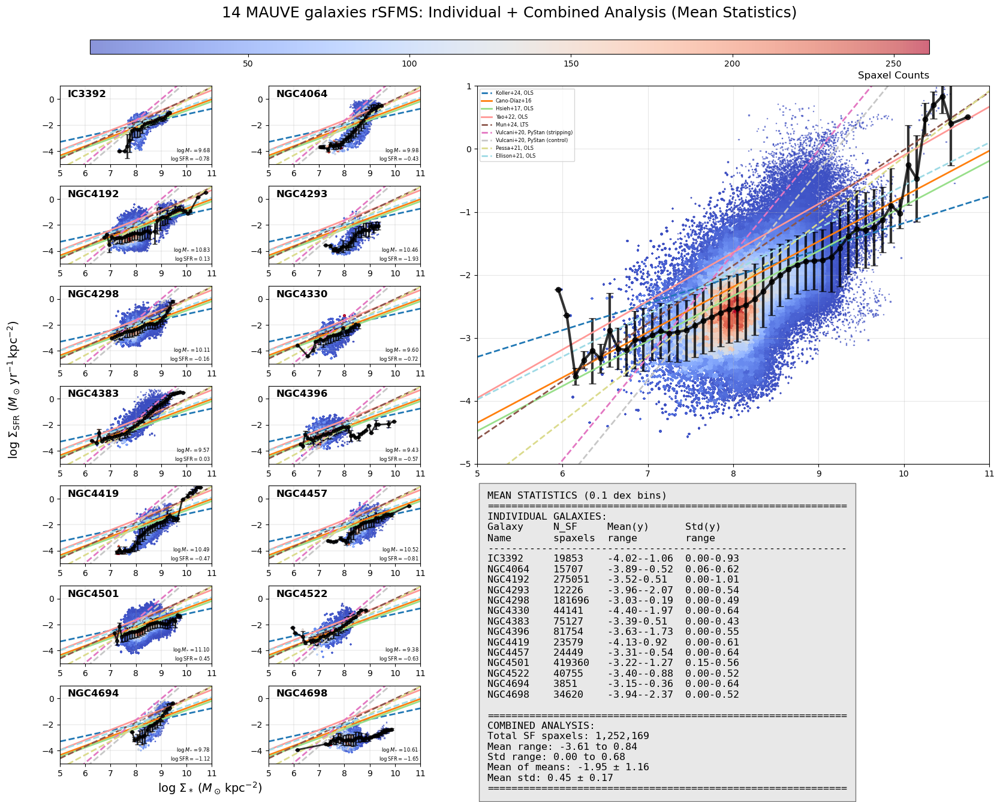

In [26]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_mean_statistics(x, y, x_range=(5, 11), bin_width=0.1):
    """Calculate mean and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    means = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if np.sum(mask) > 0:
            y_bin = y[mask]
            means.append(np.mean(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(means), np.array(stds)

def plot_literature_fits(ax, show_legend=False):
    """Plot literature fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(5, 11, 100)
    
    # Data from table - plotting all references
    plot_data = [
        # Reference 1: This work (SF-spaxels), OLS
        (0.425, -5.428, 'Koller+24, OLS', '--'),
        # # Reference 1: This work (SF-spaxels), ODR  
        # (1.162, -11.014, 'Koller+24, ODR', '--'),
        # # # Reference 2: This work (spectral decomposition), OLS
        # # (0.401, -5.615, 'Koller+24, OLS (spectral)', '--'),
        # # # Reference 2: This work (spectral decomposition), ODR
        # # (2.562, -22.248, 'Koller+24, ODR (spectral)', '--'),
        # Reference 3: Cano-Díaz et al. (2016)
        (0.72, -7.95, 'Cano-Díaz+16', '-'),
        # Reference 4: Hsieh et al. (2017), OLS
        (0.715, -8.056, 'Hsieh+17, OLS', '-'),
        # # Reference 4: Hsieh et al. (2017), ODR
        # (1.005, -10.338, 'Hsieh+17, ODR', '-'),
        # Reference 5: Yao et al. (2022), OLS
        (0.771, -7.812, 'Yao+22, OLS', '-'),
        # Reference 6: Mun et al. (2024), LTS
        (0.918, -9.196, 'Mun+24, LTS', '--'),
        # # Reference 7: Jafariyazani et al. (2019), OLS
        # (0.43, -5.66, 'Jafariyazani+19, OLS', '-'),
        # # Reference 8: Wuyts et al. (2013)
        # (0.95, -8.4, 'Wuyts+13', '-'), 
        # Vulcani et al. (2020) - stripping sample
        (1.641, -14.79, 'Vulcani+20, PyStan (stripping)', '--'),
        # Vulcani et al. (2020) - control sample
        (1.659, -15.28, 'Vulcani+20, PyStan (control)', '--'),
        # Pessa et al. (2021) - OLS
        (1.05, -10.63, 'Pessa+21, OLS', '--'),
        # Ellison et al. (2021) - OLS
        (0.68, -7.38, 'Ellison+21, OLS', '--'),
        # # Ellison et al. (2021) - ODR
        # (1.37, -13.12, 'Ellison+21, ODR', '--')
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (b, a, label, linestyle) in enumerate(plot_data):
        y = b * x + a
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate mean statistics
        x_mean, y_mean, y_std = calculate_mean_statistics(x_sf, y_sf)
        individual_stats.append((gal, x_mean, y_mean, y_std, len(x_sf)))
        
        # Density-based scatter
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot mean with error bars
        axP.errorbar(x_mean, y_mean, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add literature fits to individual panels (no legend)
    plot_literature_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)

# Calculate combined mean statistics
x_mean_combined, y_mean_combined, y_std_combined = calculate_mean_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined mean with error bars
ax_combined.errorbar(x_mean_combined, y_mean_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

# Add literature fits to combined panel (with legend)
plot_literature_fits(ax_combined, show_legend=True)

# Add legend with small font
ax_combined.legend(fontsize=6, ncol=1, loc='upper left')

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEAN STATISTICS (0.1 dex bins)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Mean(y)':<12} {'Std(y)':<12}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12}\n"
stats_table += "-"*60 + "\n"

for gal, x_mean, y_mean, y_std, n_sf in individual_stats:
    if len(y_mean) > 0:
        mean_range = f"{y_mean.min():.2f}-{y_mean.max():.2f}"
        std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"
    else:
        mean_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_sf:<8} {mean_range:<12} {std_range:<12}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
if len(y_mean_combined) > 0:
    stats_table += f"Mean range: {y_mean_combined.min():.2f} to {y_mean_combined.max():.2f}\n"
    stats_table += f"Std range: {y_std_combined.min():.2f} to {y_std_combined.max():.2f}\n"
    stats_table += f"Mean of means: {np.mean(y_mean_combined):.2f} ± {np.std(y_mean_combined):.2f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.2f} ± {np.std(y_std_combined):.2f}\n"
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis (Mean Statistics)', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/2616908684.py:305: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


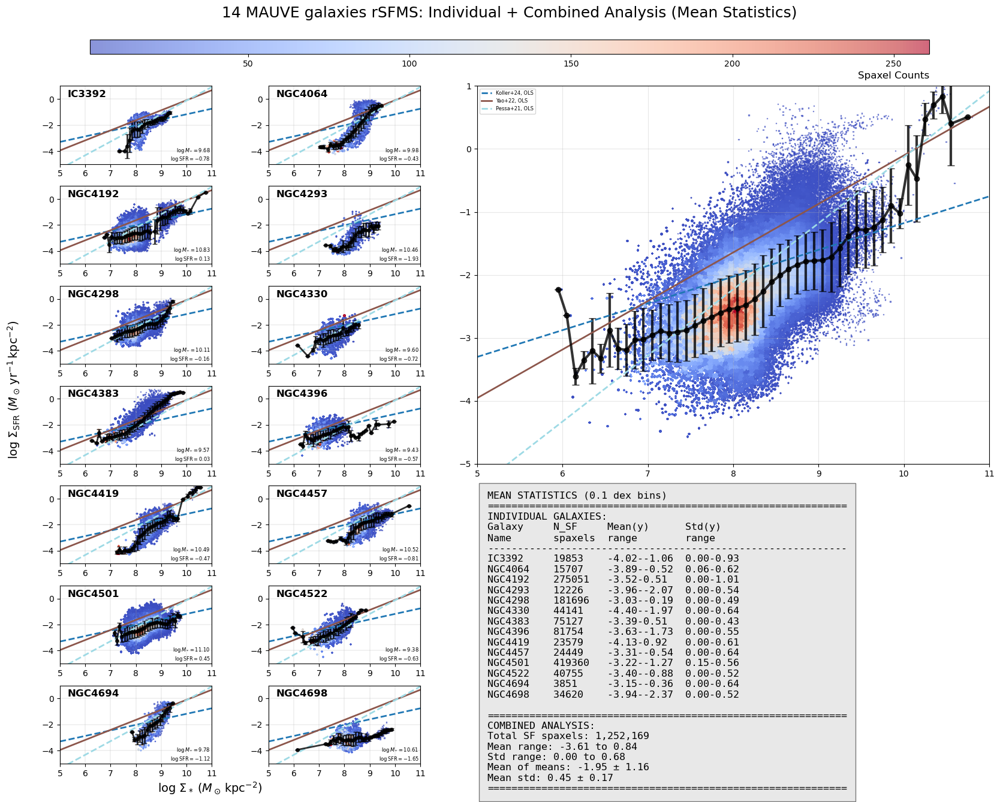

In [27]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_mean_statistics(x, y, x_range=(5, 11), bin_width=0.1):
    """Calculate mean and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    means = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if np.sum(mask) > 0:
            y_bin = y[mask]
            means.append(np.mean(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(means), np.array(stds)

def plot_literature_fits(ax, show_legend=False):
    """Plot literature fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(5, 11, 100)
    
    # Data from table - plotting all references
    plot_data = [
        # Reference 1: This work (SF-spaxels), OLS
        (0.425, -5.428, 'Koller+24, OLS', '--'),
        # # Reference 1: This work (SF-spaxels), ODR  
        # (1.162, -11.014, 'Koller+24, ODR', '--'),
        # # # Reference 2: This work (spectral decomposition), OLS
        # # (0.401, -5.615, 'Koller+24, OLS (spectral)', '--'),
        # # # Reference 2: This work (spectral decomposition), ODR
        # # (2.562, -22.248, 'Koller+24, ODR (spectral)', '--'),
        # # Reference 3: Cano-Díaz et al. (2016)
        # (0.72, -7.95, 'Cano-Díaz+16', '-'),
        # # Reference 4: Hsieh et al. (2017), OLS
        # (0.715, -8.056, 'Hsieh+17, OLS', '-'),
        # # Reference 4: Hsieh et al. (2017), ODR
        # (1.005, -10.338, 'Hsieh+17, ODR', '-'),
        # Reference 5: Yao et al. (2022), OLS
        (0.771, -7.812, 'Yao+22, OLS', '-'),
        # # Reference 6: Mun et al. (2024), LTS
        # (0.918, -9.196, 'Mun+24, LTS', '--'),
        # # Reference 7: Jafariyazani et al. (2019), OLS
        # (0.43, -5.66, 'Jafariyazani+19, OLS', '-'),
        # # Reference 8: Wuyts et al. (2013)
        # (0.95, -8.4, 'Wuyts+13', '-'), 
        # # Vulcani et al. (2020) - stripping sample
        # (1.641, -14.79, 'Vulcani+20, PyStan (stripping)', '--'),
        # # Vulcani et al. (2020) - control sample
        # (1.659, -15.28, 'Vulcani+20, PyStan (control)', '--'),
        # Pessa et al. (2021) - OLS
        (1.05, -10.63, 'Pessa+21, OLS', '--'),
        # # Ellison et al. (2021) - OLS
        # (0.68, -7.38, 'Ellison+21, OLS', '--'),
        # # Ellison et al. (2021) - ODR
        # (1.37, -13.12, 'Ellison+21, ODR', '--')
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (b, a, label, linestyle) in enumerate(plot_data):
        y = b * x + a
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate mean statistics
        x_mean, y_mean, y_std = calculate_mean_statistics(x_sf, y_sf)
        individual_stats.append((gal, x_mean, y_mean, y_std, len(x_sf)))
        
        # Density-based scatter
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot mean with error bars
        axP.errorbar(x_mean, y_mean, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add literature fits to individual panels (no legend)
    plot_literature_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)

# Calculate combined mean statistics
x_mean_combined, y_mean_combined, y_std_combined = calculate_mean_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined mean with error bars
ax_combined.errorbar(x_mean_combined, y_mean_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

# Add literature fits to combined panel (with legend)
plot_literature_fits(ax_combined, show_legend=True)

# Add legend with small font
ax_combined.legend(fontsize=6, ncol=1, loc='upper left')

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEAN STATISTICS (0.1 dex bins)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Mean(y)':<12} {'Std(y)':<12}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12}\n"
stats_table += "-"*60 + "\n"

for gal, x_mean, y_mean, y_std, n_sf in individual_stats:
    if len(y_mean) > 0:
        mean_range = f"{y_mean.min():.2f}-{y_mean.max():.2f}"
        std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"
    else:
        mean_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_sf:<8} {mean_range:<12} {std_range:<12}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
if len(y_mean_combined) > 0:
    stats_table += f"Mean range: {y_mean_combined.min():.2f} to {y_mean_combined.max():.2f}\n"
    stats_table += f"Std range: {y_std_combined.min():.2f} to {y_std_combined.max():.2f}\n"
    stats_table += f"Mean of means: {np.mean(y_mean_combined):.2f} ± {np.std(y_mean_combined):.2f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.2f} ± {np.std(y_std_combined):.2f}\n"
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis (Mean Statistics)', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_34285/2104472544.py:305: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


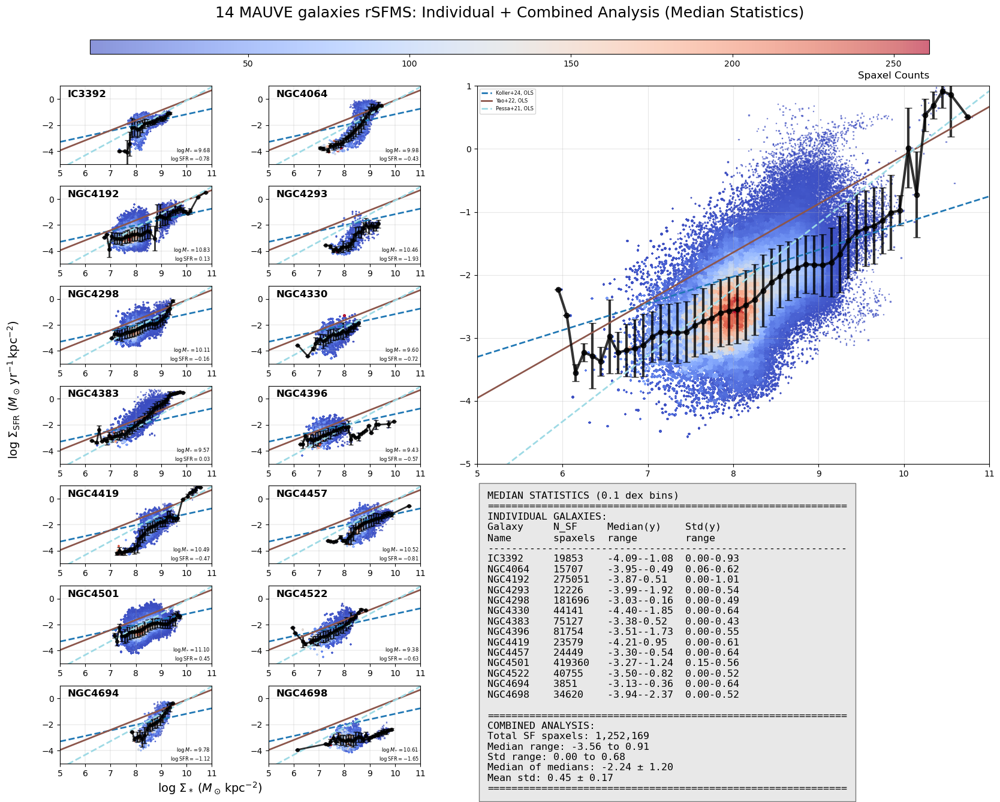

In [28]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(5, 11), bin_width=0.1):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if np.sum(mask) > 0:
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_fits(ax, show_legend=False):
    """Plot literature fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(5, 11, 100)
    
    # Data from table - plotting all references
    plot_data = [
        # Reference 1: This work (SF-spaxels), OLS
        (0.425, -5.428, 'Koller+24, OLS', '--'),
        # # Reference 1: This work (SF-spaxels), ODR  
        # (1.162, -11.014, 'Koller+24, ODR', '--'),
        # # # Reference 2: This work (spectral decomposition), OLS
        # # (0.401, -5.615, 'Koller+24, OLS (spectral)', '--'),
        # # # Reference 2: This work (spectral decomposition), ODR
        # # (2.562, -22.248, 'Koller+24, ODR (spectral)', '--'),
        # # Reference 3: Cano-Díaz et al. (2016)
        # (0.72, -7.95, 'Cano-Díaz+16', '-'),
        # # Reference 4: Hsieh et al. (2017), OLS
        # (0.715, -8.056, 'Hsieh+17, OLS', '-'),
        # # Reference 4: Hsieh et al. (2017), ODR
        # (1.005, -10.338, 'Hsieh+17, ODR', '-'),
        # Reference 5: Yao et al. (2022), OLS
        (0.771, -7.812, 'Yao+22, OLS', '-'),
        # # Reference 6: Mun et al. (2024), LTS
        # (0.918, -9.196, 'Mun+24, LTS', '--'),
        # # Reference 7: Jafariyazani et al. (2019), OLS
        # (0.43, -5.66, 'Jafariyazani+19, OLS', '-'),
        # # Reference 8: Wuyts et al. (2013)
        # (0.95, -8.4, 'Wuyts+13', '-'), 
        # # Vulcani et al. (2020) - stripping sample
        # (1.641, -14.79, 'Vulcani+20, PyStan (stripping)', '--'),
        # # Vulcani et al. (2020) - control sample
        # (1.659, -15.28, 'Vulcani+20, PyStan (control)', '--'),
        # Pessa et al. (2021) - OLS
        (1.05, -10.63, 'Pessa+21, OLS', '--'),
        # # Ellison et al. (2021) - OLS
        # (0.68, -7.38, 'Ellison+21, OLS', '--'),
        # # Ellison et al. (2021) - ODR
        # (1.37, -13.12, 'Ellison+21, ODR', '--')
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (b, a, label, linestyle) in enumerate(plot_data):
        y = b * x + a
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
    if not np.any(good_SF) and not np.any(good_nonSF):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    total_sigSFR = np.sum(np.isfinite(sigSFR))
    pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
        # Calculate median statistics
        x_median, y_median, y_std = calculate_median_statistics(x_sf, y_sf)
        individual_stats.append((gal, x_median, y_median, y_std, len(x_sf)))
        
        # Density-based scatter
        H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
        x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
        y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
        density = H[x_idx, y_idx]
        
        scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
                             cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
        # Plot median with error bars
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
        
        if scatter_for_cbar is None:
            scatter_for_cbar = scatter
    
    # Add literature fits to individual panels (no legend)
    plot_literature_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(5, 11)
    axP.set_ylim(-5, 1)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined median with error bars
ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

# Add literature fits to combined panel (with legend)
plot_literature_fits(ax_combined, show_legend=True)

# Add legend with small font
ax_combined.legend(fontsize=6, ncol=1, loc='upper left')

ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.1 dex bins)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Median(y)':<12} {'Std(y)':<12}\n"
stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12}\n"
stats_table += "-"*60 + "\n"

for gal, x_median, y_median, y_std, n_sf in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.2f}-{y_median.max():.2f}"
        std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_sf:<8} {median_range:<12} {std_range:<12}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total SF spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median range: {y_median_combined.min():.2f} to {y_median_combined.max():.2f}\n"
    stats_table += f"Std range: {y_std_combined.min():.2f} to {y_std_combined.max():.2f}\n"
    stats_table += f"Median of medians: {np.median(y_median_combined):.2f} ± {np.std(y_median_combined):.2f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.2f} ± {np.std(y_std_combined):.2f}\n"
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=12, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis (Median Statistics)', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])

# Save figures
plt.savefig('mauve_14galaxies_rSFMS.png', dpi=600, bbox_inches='tight')
plt.savefig('mauve_14galaxies_rSFMS.pdf', bbox_inches='tight')

plt.show()


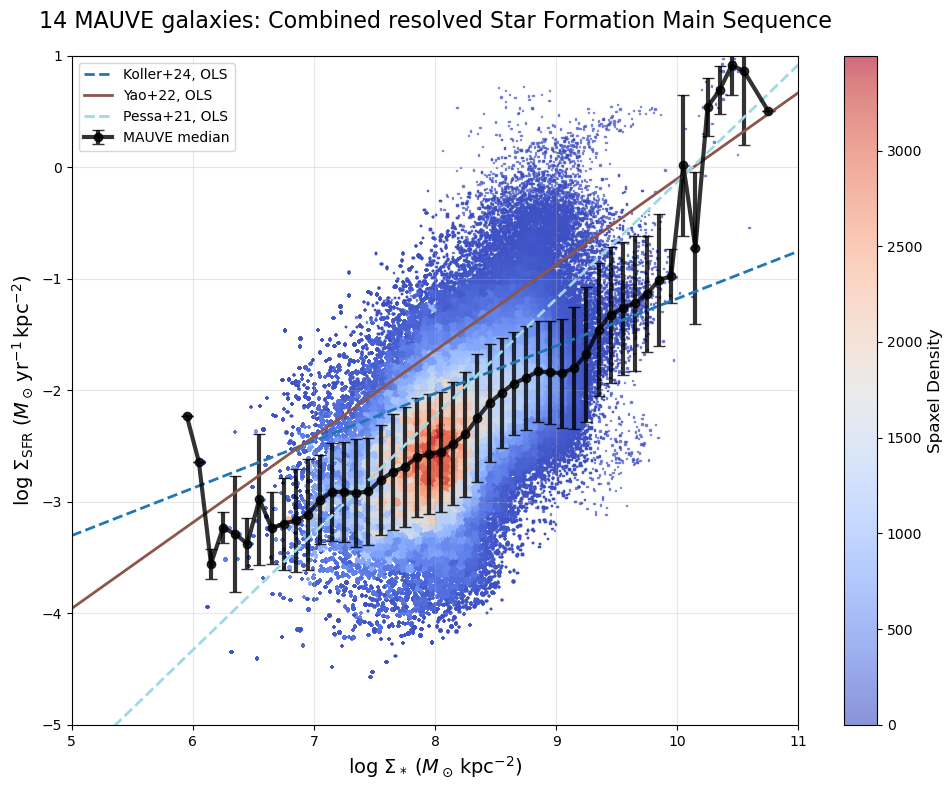

In [29]:
# ------------------------------------------------------------------
# COMBINED PLOT ONLY: All galaxies combined analysis
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import re

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
        sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
        sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
    return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

def calculate_median_statistics(x, y, x_range=(5, 11), bin_width=0.1):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if np.sum(mask) > 0:
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_fits(ax, show_legend=True):
    """Plot literature fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(5, 11, 100)
    
    # Data from table - plotting selected references
    plot_data = [
        # Reference 1: This work (SF-spaxels), OLS
        (0.425, -5.428, 'Koller+24, OLS', '--'),
        # Reference 5: Yao et al. (2022), OLS
        (0.771, -7.812, 'Yao+22, OLS', '-'),
        # Pessa et al. (2021) - OLS
        (1.05, -10.63, 'Pessa+21, OLS', '--'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (b, a, label, linestyle) in enumerate(plot_data):
        y = b * x + a
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# Create single figure for combined plot
fig, ax_combined = plt.subplots(1, 1, figsize=(10, 8))

# Collect all data for combined analysis
all_x, all_y = [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
    if np.any(good_SF):
        x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        all_x.extend(x_sf)
        all_y.extend(y_sf)
        galaxy_counts[gal] = len(x_sf)
    else:
        galaxy_counts[gal] = 0

all_x, all_y = np.array(all_x), np.array(all_y)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Density-based scatter for combined data
H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
density = H[x_idx, y_idx]

scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
                                      cmap='coolwarm')

# Plot combined median with error bars
ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                    fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8,
                    label='MAUVE median')

# Add literature fits to combined panel (with legend)
plot_literature_fits(ax_combined, show_legend=True)

# Add legend
ax_combined.legend(fontsize=10, loc='upper left')

# Add colorbar
cbar = plt.colorbar(scatter_combined, ax=ax_combined)
cbar.set_label('Spaxel Density', fontsize=12)

# Set axis properties
ax_combined.set_xlim(5, 11)
ax_combined.set_ylim(-5, 1)
ax_combined.grid(True, alpha=0.3)
ax_combined.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=14)
ax_combined.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=14)

# Global title
plt.title(fr'{ngal} MAUVE galaxies: Combined resolved Star Formation Main Sequence', 
          fontsize=16, pad=20)

plt.tight_layout()

# Save figures with updated filename
plt.savefig('mauve_14galaxies_rSFMS_combined.png', dpi=600, bbox_inches='tight')
plt.savefig('mauve_14galaxies_rSFMS_combined.pdf', bbox_inches='tight')

plt.show()

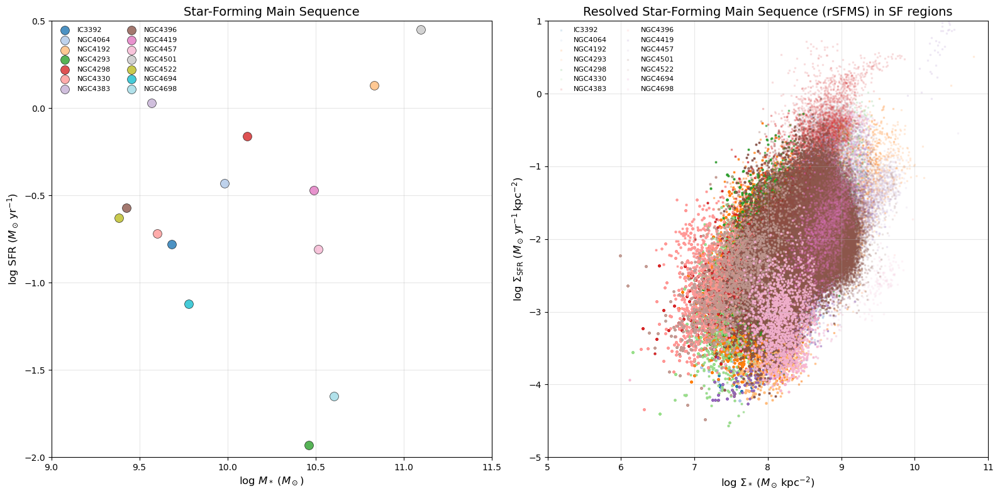

Subplot 1: Plotted 14 galaxies with valid total mass and SFR data
Subplot 2: Plotted spatially-resolved data for 14 galaxies


In [30]:
# ------------------------------------------------------------------
# Combined Plot: Total SFMS + Spatially-resolved Star Formation
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
import itertools
from scipy.stats import linregress
from astropy.io import fits

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# ------------------------------------------------------------------
# SUBPLOT 1: Total Stellar Mass vs Total SFR from log files
# ------------------------------------------------------------------

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# Discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Extract total masses and SFRs
log_masses = []
log_sfrs = []
galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        galaxy_names.append(gal)

# Convert to numpy arrays
log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Color-code each galaxy
colors_total = plt.cm.tab20(np.linspace(0, 1, len(galaxy_names)))

for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, galaxy_names)):
    ax1.scatter(mass, sfr, s=100, c=[colors_total[i]], label=gal, alpha=0.8, 
               edgecolors='black', linewidth=0.5)

# Add labels and formatting for subplot 1
ax1.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=12)
ax1.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=12)
ax1.set_title('Star-Forming Main Sequence', fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper left', fontsize=8, ncol=2, frameon=False)
ax1.set_xlim(9, 11.5)
ax1.set_ylim(-2, 0.5)

# ------------------------------------------------------------------
# SUBPLOT 2: Spatially-resolved Σ* vs ΣSFR
# ------------------------------------------------------------------

# Colour cycle for spatially-resolved plot
colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# Collect all data points for global fit
all_x = []
all_y = []

for gal, colour in zip(galaxies, colors_spatial):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
    if not bin_file.exists() or not gas_file.exists():
        continue

    # Read FITS extensions
    try:
        with fits.open(bin_file) as hdul:
            logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
        with fits.open(gas_file) as hdul:
            logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

        # Mask bad pixels
        good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

        # Scatter plot
        ax2.scatter(
            logSigmaM[good],
            logSigmaSFR[good],
            s=1, 
            marker=',', 
            alpha=0.1,
            color=colour,
            label=gal
        )
        
        # Collect points for global fit
        all_x.extend(logSigmaM[good])
        all_y.extend(logSigmaSFR[good])
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Final cosmetics for subplot 2
ax2.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_title(r'Resolved Star-Forming Main Sequence (rSFMS) in SF regions', fontsize=14)
ax2.set_xlim(5, 11)
ax2.set_ylim(-5, 1)
ax2.grid(True, alpha=0.3)
ax2.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

plt.tight_layout()
plt.show()

print(f"Subplot 1: Plotted {len(galaxy_names)} galaxies with valid total mass and SFR data")
print(f"Subplot 2: Plotted spatially-resolved data for {len([g for g in galaxies if Path(f'{g}_SPATIAL_BINNING_maps_extended.fits').exists()])} galaxies")


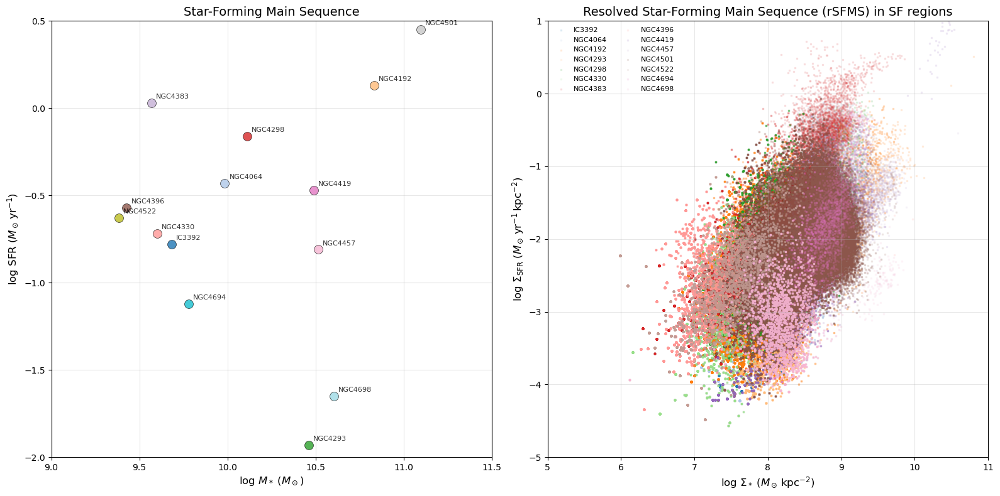

Subplot 1: Plotted 14 galaxies with valid total mass and SFR data
Subplot 2: Plotted spatially-resolved data for 14 galaxies


In [31]:
# ------------------------------------------------------------------
# Combined Plot: Total SFMS + Spatially-resolved Star Formation
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
import itertools
from scipy.stats import linregress
from astropy.io import fits

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# ------------------------------------------------------------------
# SUBPLOT 1: Total Stellar Mass vs Total SFR from log files
# ------------------------------------------------------------------

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# Discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Extract total masses and SFRs
log_masses = []
log_sfrs = []
galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        galaxy_names.append(gal)

# Convert to numpy arrays
log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Color-code each galaxy
colors_total = plt.cm.tab20(np.linspace(0, 1, len(galaxy_names)))

# Plot points and add galaxy names as annotations
for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, galaxy_names)):
    # Plot the point
    ax1.scatter(mass, sfr, s=100, c=[colors_total[i]], alpha=0.8, 
               edgecolors='black', linewidth=0.5)
    
    # Add galaxy name as annotation with slight offset
    ax1.annotate(gal, (mass, sfr), xytext=(5, 5), textcoords='offset points', 
                fontsize=8, alpha=0.8)

# Add labels and formatting for subplot 1
ax1.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=12)
ax1.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=12)
ax1.set_title('Star-Forming Main Sequence', fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.set_xlim(9, 11.5)
ax1.set_ylim(-2, 0.5)

# ------------------------------------------------------------------
# SUBPLOT 2: Spatially-resolved Σ* vs ΣSFR
# ------------------------------------------------------------------

# Colour cycle for spatially-resolved plot
colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# Collect all data points for global fit
all_x = []
all_y = []

for gal, colour in zip(galaxies, colors_spatial):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
    if not bin_file.exists() or not gas_file.exists():
        continue

    # Read FITS extensions
    try:
        with fits.open(bin_file) as hdul:
            logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
        with fits.open(gas_file) as hdul:
            logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

        # Mask bad pixels
        good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

        # Scatter plot
        ax2.scatter(
            logSigmaM[good],
            logSigmaSFR[good],
            s=1, 
            marker=',', 
            alpha=0.1,
            color=colour,
            label=gal
        )
        
        # Collect points for global fit
        all_x.extend(logSigmaM[good])
        all_y.extend(logSigmaSFR[good])
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Final cosmetics for subplot 2
ax2.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_title(r'Resolved Star-Forming Main Sequence (rSFMS) in SF regions', fontsize=14)
ax2.set_xlim(5, 11)
ax2.set_ylim(-5, 1)
ax2.grid(True, alpha=0.3)
ax2.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

plt.tight_layout()
plt.show()

print(f"Subplot 1: Plotted {len(galaxy_names)} galaxies with valid total mass and SFR data")
print(f"Subplot 2: Plotted spatially-resolved data for {len([g for g in galaxies if Path(f'{g}_SPATIAL_BINNING_maps_extended.fits').exists()])} galaxies")

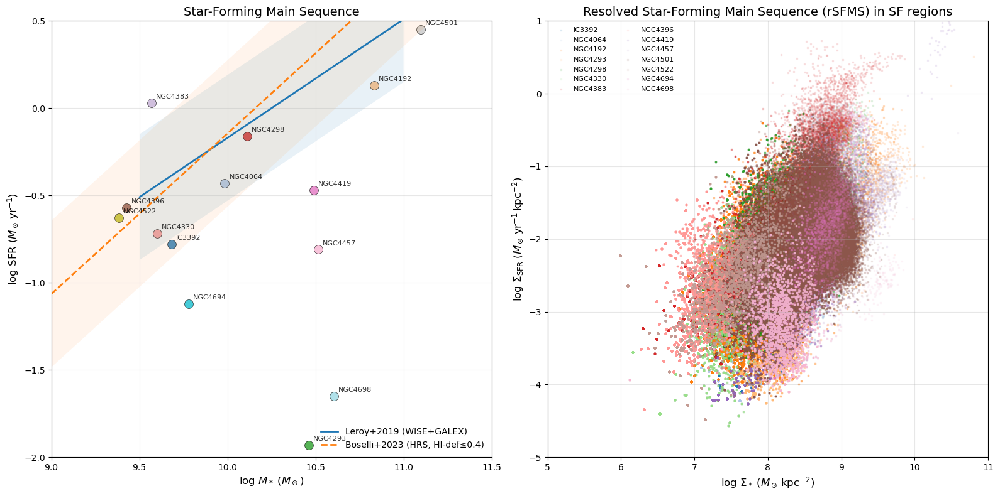

Subplot 1: Plotted 14 galaxies with valid total mass and SFR data
Subplot 2: Plotted spatially-resolved data for 14 galaxies


In [32]:
# ------------------------------------------------------------------
# Combined Plot: Total SFMS + Spatially-resolved Star Formation
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
import itertools
from scipy.stats import linregress
from astropy.io import fits

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# ------------------------------------------------------------------
# SUBPLOT 1: Total Stellar Mass vs Total SFR from log files
# ------------------------------------------------------------------

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def sfms_leroy2019(logM, scatter=0.36, valid=(9.5, 11.0)):
    """Leroy+2019 eq.19 converted to log SFR: logSFR = 0.68*logM - 6.97."""
    y = 0.68 * np.asarray(logM) - 6.97
    # mask outside their stated mass range
    y = np.where((logM < valid[0]) | (logM > valid[1]), np.nan, y)
    return y

def sfms_boselli2023(logM, slope=0.92, intercept=-1.57, x_pivot=8.451, scatter=0.42):
    """
    Boselli+2023 (HRS, HI-def ≤ 0.4): fit with pivot x_pivot.
    y = slope * (logM - x_pivot) + intercept
    """
    logM = np.asarray(logM)
    y = slope * (logM - x_pivot) + intercept
    return y

# Discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Extract total masses and SFRs
log_masses = []
log_sfrs = []
galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        galaxy_names.append(gal)

# Convert to numpy arrays
log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Color-code each galaxy
colors_total = plt.cm.tab20(np.linspace(0, 1, len(galaxy_names)))

# Plot points and add galaxy names as annotations
for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, galaxy_names)):
    # Plot the point
    ax1.scatter(mass, sfr, s=100, c=[colors_total[i]], alpha=0.8, 
               edgecolors='black', linewidth=0.5)
    
    # Add galaxy name as annotation with slight offset
    ax1.annotate(gal, (mass, sfr), xytext=(5, 5), textcoords='offset points', 
                fontsize=8, alpha=0.8)

# Add labels and formatting for subplot 1
ax1.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=12)
ax1.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=12)
ax1.set_title('Star-Forming Main Sequence', fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.set_xlim(9, 11.5)
ax1.set_ylim(-2, 0.5)

# Add SFMS relations
x_line = np.linspace(*ax1.get_xlim(), 400)

# Leroy+2019 line + ±0.36 dex band
y_l19 = sfms_leroy2019(x_line)
ax1.plot(x_line, y_l19, lw=2, ls='-', label='Leroy+2019 (WISE+GALEX)')
ax1.fill_between(x_line, y_l19 - 0.36, y_l19 + 0.36, alpha=0.10, linewidth=0)

# Boselli+2023 line + intrinsic-scatter band
y_b23 = sfms_boselli2023(x_line)
ax1.plot(x_line, y_b23, lw=2, ls='--', label='Boselli+2023 (HRS, HI-def≤0.4)')
ax1.fill_between(x_line, y_b23 - 0.42, y_b23 + 0.42, alpha=0.08, linewidth=0)

# Add legend for SFMS relations
ax1.legend(frameon=False, fontsize=10, loc='lower right')

# ------------------------------------------------------------------
# SUBPLOT 2: Spatially-resolved Σ* vs ΣSFR
# ------------------------------------------------------------------

# Colour cycle for spatially-resolved plot
colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# Collect all data points for global fit
all_x = []
all_y = []

for gal, colour in zip(galaxies, colors_spatial):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
    if not bin_file.exists() or not gas_file.exists():
        continue

    # Read FITS extensions
    try:
        with fits.open(bin_file) as hdul:
            logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
        with fits.open(gas_file) as hdul:
            logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

        # Mask bad pixels
        good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

        # Scatter plot
        ax2.scatter(
            logSigmaM[good],
            logSigmaSFR[good],
            s=1, 
            marker=',', 
            alpha=0.1,
            color=colour,
            label=gal
        )
        
        # Collect points for global fit
        all_x.extend(logSigmaM[good])
        all_y.extend(logSigmaSFR[good])
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Final cosmetics for subplot 2
ax2.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_title(r'Resolved Star-Forming Main Sequence (rSFMS) in SF regions', fontsize=14)
ax2.set_xlim(5, 11)
ax2.set_ylim(-5, 1)
ax2.grid(True, alpha=0.3)
ax2.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

plt.tight_layout()
plt.show()

print(f"Subplot 1: Plotted {len(galaxy_names)} galaxies with valid total mass and SFR data")
print(f"Subplot 2: Plotted spatially-resolved data for {len([g for g in galaxies if Path(f'{g}_SPATIAL_BINNING_maps_extended.fits').exists()])} galaxies")

## Inclination

Inclinatons are determined from the SDSS r-band axis ratio ($b/a$) as
$$\cos(i) = \sqrt{\frac{(b/a)^2-q_0^2}{1-q_0^2}}$$
The inclination degree $i$ is provided by Table 1 of Brown+2021, and we choose the intrinsic thickness as $q_0 = 0.2$ for all galaxies with a clear disc component (Cortese+2016).
Then the inclination correction for observed surface density preperties
$$\Sigma_{\rm corr} = \frac{b}{a}\Sigma_{\rm observed}$$

In [33]:
# # ------------------------------------------------------------------
# # Helper function for inclination correction
# # ------------------------------------------------------------------

# def read_galaxy_inclination(galaxy_name, inclination_file="MAUVE_Inclination.dat"):
#     """
#     Read galaxy inclination from MAUVE_Inclination.dat file.
    
#     Parameters:
#     -----------
#     galaxy_name : str
#         Name of the galaxy (e.g., 'IC3392')
#     inclination_file : str
#         Path to the inclination data file
        
#     Returns:
#     --------
#     float
#         Inclination angle in degrees, or None if galaxy not found
#     """
#     try:
#         with open(inclination_file, 'r') as f:
#             for line in f:
#                 parts = line.strip().split()
#                 if len(parts) == 2 and parts[0].upper() == galaxy_name.upper():
#                     return float(parts[1])
#         print(f"Warning: Galaxy {galaxy_name} not found in {inclination_file}")
#         return None
#     except FileNotFoundError:
#         print(f"Warning: Inclination file {inclination_file} not found")
#         return None
#     except Exception as e:
#         print(f"Warning: Error reading inclination file: {e}")
#         return None

# # ------------------------------------------------------------------
# # Two-panel comparison: Observed (left) vs Inclination-corrected (right)
# # ------------------------------------------------------------------

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# # ------------------------------------------------------------------
# # LEFT PANEL: Original rSFMS (exactly as before)
# # ------------------------------------------------------------------

# # Colour cycle for spatially-resolved plot
# colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# # Collect all data points for global fit
# all_x = []
# all_y = []

# for gal, colour in zip(galaxies, colors_spatial):
#     bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
#     gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
#     if not bin_file.exists() or not gas_file.exists():
#         continue

#     # Read FITS extensions
#     try:
#         with fits.open(bin_file) as hdul:
#             logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
#         with fits.open(gas_file) as hdul:
#             logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

#         # Mask bad pixels
#         good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

#         # Scatter plot
#         ax1.scatter(
#             logSigmaM[good],
#             logSigmaSFR[good],
#             s=1, 
#             marker=',', 
#             alpha=0.1,
#             color=colour,
#             label=gal
#         )
        
#         # Collect points for global fit
#         all_x.extend(logSigmaM[good])
#         all_y.extend(logSigmaSFR[good])
        
#     except Exception as e:
#         print(f"Error processing {gal}: {e}")
#         continue

# # Final cosmetics for left panel
# ax1.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax1.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax1.set_title(r'Resolved Star-Forming Main Sequence (rSFMS) in SF regions', fontsize=14)
# ax1.set_xlim(5, 11)
# ax1.set_ylim(-5, 1)
# ax1.grid(True, alpha=0.3)
# ax1.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

# # ------------------------------------------------------------------
# # RIGHT PANEL: Inclination-corrected rSFMS
# # ------------------------------------------------------------------

# # Reset color cycle for right panel
# colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# for gal, colour in zip(galaxies, colors_spatial):
#     bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
#     gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
#     if not bin_file.exists() or not gas_file.exists():
#         continue

#     # Get galaxy inclination
#     galaxy_inclination = read_galaxy_inclination(gal)
#     if galaxy_inclination is None:
#         print(f"Skipping {gal} - no inclination data")
#         continue
        
#     inclination_rad = np.deg2rad(galaxy_inclination)
#     cos_inclination = np.cos(inclination_rad)
    
#     print(f"Galaxy {gal} inclination: {galaxy_inclination}° (b/a = {np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)):.3f})")

#     # Read FITS extensions
#     try:
#         with fits.open(bin_file) as hdul:
#             logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
#         with fits.open(gas_file) as hdul:
#             logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

#         # Mask bad pixels
#         good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

#         # Apply inclination correction: multiply surface densities by b/a
#         logSigmaM_corr = logSigmaM[good] + np.log10(np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)))
#         logSigmaSFR_corr = logSigmaSFR[good] + np.log10(np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)))

#         # Scatter plot with inclination correction
#         ax2.scatter(
#             logSigmaM_corr,
#             logSigmaSFR_corr,
#             s=1, 
#             marker=',', 
#             alpha=0.1,
#             color=colour,
#             label=f'{gal} (b/a={np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)):.3f})'
#         )
        
#     except Exception as e:
#         print(f"Error processing {gal}: {e}")
#         continue

# # Final cosmetics for right panel
# ax2.set_xlabel(r'$\log\,\Sigma_* \frac{b}{a} \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax2.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}} \frac{b}{a}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
# ax2.set_title(r'Inclination-Corrected rSFMS in SF regions', fontsize=14)
# ax2.set_xlim(5, 11)
# ax2.set_ylim(-5, 1)
# ax2.grid(True, alpha=0.3)
# ax2.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

# plt.tight_layout()
# plt.show()

# print(f"Comparison plot created: Original (left) vs Inclination-corrected (right)")

In [34]:
# # ------------------------------------------------------------------
# # COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics
# # 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# # ------------------------------------------------------------------
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.gridspec import GridSpec
# from pathlib import Path
# from astropy.io import fits
# import itertools
# import re  # Add this import for regex

# # 0 · discover galaxies & colour palette
# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bins]
# ngal = len(galaxies)
# assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# def load_maps(gal):
#     with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
#         sigM = h['LOGMASS_SURFACE_DENSITY'].data
#     with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
#         sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
#         sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
#         sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
#     return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# # Extraction functions for log files
# def extract_total_stellar_mass(galaxy_name):
#     """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
#     log_file = Path(f'mass_logs/{galaxy_name}.log')
#     if not log_file.exists():
#         return None
    
#     try:
#         with open(log_file, 'r') as f:
#             content = f.read()
#         pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
#         match = re.search(pattern, content)
#         return float(match.group(1)) if match else None
#     except Exception as e:
#         print(f"Error reading mass log for {galaxy_name}: {e}")
#         return None

# def extract_total_sfr(galaxy_name):
#     """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
#     log_file = Path(f'sfr_logs/{galaxy_name}.log')
#     if not log_file.exists():
#         return None
    
#     try:
#         with open(log_file, 'r') as f:
#             content = f.read()
#         pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
#         match = re.search(pattern, content)
#         return float(match.group(1)) if match else None
#     except Exception as e:
#         print(f"Error reading SFR log for {galaxy_name}: {e}")
#         return None

# def calculate_median_statistics(x, y, x_range=(5, 11), bin_width=0.1):
#     """Calculate median and std in binned intervals"""
#     x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
#     x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
#     medians = []
#     stds = []
#     x_valid = []
    
#     for i in range(len(x_bins) - 1):
#         mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
#         if np.sum(mask) > 0:
#             y_bin = y[mask]
#             medians.append(np.median(y_bin))
#             stds.append(np.std(y_bin))
#             x_valid.append(x_centers[i])
    
#     return np.array(x_valid), np.array(medians), np.array(stds)

# def plot_literature_fits(ax, show_legend=False):
#     """Plot literature fits on the given axis"""
#     # Define x range for plotting literature fits
#     x = np.linspace(5, 11, 100)
    
#     # Data from table - plotting all references
#     plot_data = [
#         # Reference 1: This work (SF-spaxels), OLS
#         (0.425, -5.428, 'Koller+24, OLS', '--'),
#         # # Reference 1: This work (SF-spaxels), ODR  
#         # (1.162, -11.014, 'Koller+24, ODR', '--'),
#         # # # Reference 2: This work (spectral decomposition), OLS
#         # # (0.401, -5.615, 'Koller+24, OLS (spectral)', '--'),
#         # # # Reference 2: This work (spectral decomposition), ODR
#         # # (2.562, -22.248, 'Koller+24, ODR (spectral)', '--'),
#         # # Reference 3: Cano-Díaz et al. (2016)
#         # (0.72, -7.95, 'Cano-Díaz+16', '-'),
#         # # Reference 4: Hsieh et al. (2017), OLS
#         # (0.715, -8.056, 'Hsieh+17, OLS', '-'),
#         # # Reference 4: Hsieh et al. (2017), ODR
#         # (1.005, -10.338, 'Hsieh+17, ODR', '-'),
#         # Reference 5: Yao et al. (2022), OLS
#         (0.771, -7.812, 'Yao+22, OLS', '-'),
#         # # Reference 6: Mun et al. (2024), LTS
#         # (0.918, -9.196, 'Mun+24, LTS', '--'),
#         # # Reference 7: Jafariyazani et al. (2019), OLS
#         # (0.43, -5.66, 'Jafariyazani+19, OLS', '-'),
#         # # Reference 8: Wuyts et al. (2013)
#         # (0.95, -8.4, 'Wuyts+13', '-'), 
#         # # Vulcani et al. (2020) - stripping sample
#         # (1.641, -14.79, 'Vulcani+20, PyStan (stripping)', '--'),
#         # # Vulcani et al. (2020) - control sample
#         # (1.659, -15.28, 'Vulcani+20, PyStan (control)', '--'),
#         # Pessa et al. (2021) - OLS
#         (1.05, -10.63, 'Pessa+21, OLS', '--'),
#         # # Ellison et al. (2021) - OLS
#         # (0.68, -7.38, 'Ellison+21, OLS', '--'),
#         # # Ellison et al. (2021) - ODR
#         # (1.37, -13.12, 'Ellison+21, ODR', '--')
#     ]
    
#     # Plot all literature fits
#     colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
#     for i, (b, a, label, linestyle) in enumerate(plot_data):
#         y = b * x + a
#         if show_legend:
#             ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
#         else:
#             ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# # 1 · Create comprehensive figure with 4-column layout
# fig = plt.figure(figsize=(20, 16))
# gs = GridSpec(nrows=8, ncols=4, figure=fig,
#               width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
#               height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
#               wspace=0.3, hspace=0.3)

# plot_idx = 0
# scatter_for_cbar = None
# individual_stats = []

# # COLUMNS 1-2: Individual galaxy plots
# for idx, gal in enumerate(galaxies):
#     sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
#     good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
#     good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
#     if not np.any(good_SF) and not np.any(good_nonSF):
#         print(f"Skipping {gal}: no valid data points")
#         continue
    
#     row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
#     col = plot_idx % 2
#     plot_idx += 1

#     axP = fig.add_subplot(gs[row, col])
    
#     total_sigSFR = np.sum(np.isfinite(sigSFR))
#     pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
#     pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
#     if np.any(good_SF):
#         x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
        
#         # Calculate median statistics
#         x_median, y_median, y_std = calculate_median_statistics(x_sf, y_sf)
#         individual_stats.append((gal, x_median, y_median, y_std, len(x_sf)))
        
#         # Density-based scatter
#         H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
#         x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
#         y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
#         density = H[x_idx, y_idx]
        
#         scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
#                              cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
#         # Plot median with error bars
#         axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
#                     markersize=4, capsize=3, alpha=0.8)
        
#         if scatter_for_cbar is None:
#             scatter_for_cbar = scatter
    
#     # Add literature fits to individual panels (no legend)
#     plot_literature_fits(axP, show_legend=False)
    
#     # Add galaxy name in top left corner
#     axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
#              va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
#     # Bottom right: total stellar mass and SFR from log files
#     total_mass = extract_total_stellar_mass(gal)
#     total_sfr = extract_total_sfr(gal)
    
#     if total_mass is not None and total_sfr is not None:
#         log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
#         axP.text(0.99, 0.01, log_text,
#                  transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
#                  bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
#     axP.set_xlim(5, 11)
#     axP.set_ylim(-5, 1)
#     axP.grid(True, lw=0.25)

# # COLUMNS 3-4: Combined plot - Upper panel
# ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# # Collect all data for combined analysis
# all_x, all_y = [], []
# galaxy_counts = {}

# for gal in galaxies:
#     sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
#     good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
#     if np.any(good_SF):
#         x_sf, y_sf = sigM[good_SF], sigSFR_SF[good_SF]
#         all_x.extend(x_sf)
#         all_y.extend(y_sf)
#         galaxy_counts[gal] = len(x_sf)
#     else:
#         galaxy_counts[gal] = 0

# all_x, all_y = np.array(all_x), np.array(all_y)

# # Calculate combined median statistics
# x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# # Density-based scatter for combined data
# H, xedges, yedges = np.histogram2d(all_x, all_y, bins=100, range=[[5, 11], [-5, 1]])
# x_idx = np.clip(np.digitize(all_x, xedges) - 1, 0, H.shape[0] - 1)
# y_idx = np.clip(np.digitize(all_y, yedges) - 1, 0, H.shape[1] - 1)
# density = H[x_idx, y_idx]

# scatter_combined = ax_combined.scatter(all_x, all_y, c=density, s=1, alpha=0.6, marker=',', 
#                                       cmap='coolwarm')

# # Plot combined median with error bars
# ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
#                     fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

# # Add literature fits to combined panel (with legend)
# plot_literature_fits(ax_combined, show_legend=True)

# # Add legend with small font
# ax_combined.legend(fontsize=6, ncol=1, loc='upper left')

# ax_combined.set_xlim(5, 11)
# ax_combined.set_ylim(-5, 1)
# ax_combined.grid(True, alpha=0.3)

# # COLUMNS 3-4: Statistics table - Lower panel
# ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
# ax_stats.axis('off')

# # Create comprehensive statistics text
# stats_table = "MEDIAN STATISTICS (0.1 dex bins)\n"
# stats_table += "="*60 + "\n"
# stats_table += "INDIVIDUAL GALAXIES:\n"
# stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Median(y)':<12} {'Std(y)':<12}\n"
# stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12}\n"
# stats_table += "-"*60 + "\n"

# for gal, x_median, y_median, y_std, n_sf in individual_stats:
#     if len(y_median) > 0:
#         median_range = f"{y_median.min():.2f}-{y_median.max():.2f}"
#         std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"
#     else:
#         median_range = "N/A"
#         std_range = "N/A"
    
#     stats_table += f"{gal:<10} {n_sf:<8} {median_range:<12} {std_range:<12}\n"

# stats_table += "\n" + "="*60 + "\n"
# stats_table += "COMBINED ANALYSIS:\n"
# stats_table += f"Total SF spaxels: {len(all_x):,}\n"
# if len(y_median_combined) > 0:
#     stats_table += f"Median range: {y_median_combined.min():.2f} to {y_median_combined.max():.2f}\n"
#     stats_table += f"Std range: {y_std_combined.min():.2f} to {y_std_combined.max():.2f}\n"
#     stats_table += f"Median of medians: {np.median(y_median_combined):.2f} ± {np.std(y_median_combined):.2f}\n"
#     stats_table += f"Mean std: {np.mean(y_std_combined):.2f} ± {np.std(y_std_combined):.2f}\n"
# stats_table += "="*60

# ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
#               fontsize=12, family='monospace',
#               bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# # Add horizontal colorbar at the top
# if scatter_for_cbar is not None:
#     cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
#     cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
#     cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# # Global title and labels
# fig.suptitle(fr'{ngal} MAUVE galaxies rSFMS: Individual + Combined Analysis (Median Statistics)', 
#              fontsize=18, y=0.90)

# # Shared axis labels
# fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
#          ha='center', fontsize=14)
# fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
#          va='center', rotation='vertical', fontsize=14)

# plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])

# plt.show()


# ####################################################################

# # ------------------------------------------------------------------
# # Helper function for inclination correction
# # ------------------------------------------------------------------

# def read_galaxy_inclination(galaxy_name, inclination_file="MAUVE_Inclination.dat"):
#     """
#     Read galaxy inclination from MAUVE_Inclination.dat file.
    
#     Parameters:
#     -----------
#     galaxy_name : str
#         Name of the galaxy (e.g., 'IC3392')
#     inclination_file : str
#         Path to the inclination data file
        
#     Returns:
#     --------
#     float
#         Inclination angle in degrees, or None if galaxy not found
#     """
#     try:
#         with open(inclination_file, 'r') as f:
#             for line in f:
#                 parts = line.strip().split()
#                 if len(parts) == 2 and parts[0].upper() == galaxy_name.upper():
#                     return float(parts[1])
#         print(f"Warning: Galaxy {galaxy_name} not found in {inclination_file}")
#         return None
#     except FileNotFoundError:
#         print(f"Warning: Inclination file {inclination_file} not found")
#         return None
#     except Exception as e:
#         print(f"Warning: Error reading inclination file: {e}")
#         return None

# # ------------------------------------------------------------------
# # INCLINATION-CORRECTED LAYOUT ONLY:
# # Individual galaxies + Combined plot + Statistics (Inclination-corrected)
# # 4-column layout: Cols 1-2 = Individual galaxies, Cols 3-4 = Combined inclination-corrected
# # ------------------------------------------------------------------
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.gridspec import GridSpec
# from pathlib import Path
# from astropy.io import fits
# import itertools
# import re  # Add this import for regex

# # 0 · discover galaxies & colour palette
# bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bins]
# ngal = len(galaxies)
# assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# def load_maps(gal):
#     with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
#         sigM = h['LOGMASS_SURFACE_DENSITY'].data
#     with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
#         sigSFR = h['LOGSFR_SURFACE_DENSITY'].data
#         sigSFR_SF = h['LOGSFR_SURFACE_DENSITY_SF'].data
#         sigSFR_nonSF = h['LOGSFR_SURFACE_DENSITY_nonSF'].data
#     return sigM, sigSFR, sigSFR_SF, sigSFR_nonSF

# # Extraction functions for log files
# def extract_total_stellar_mass(galaxy_name):
#     """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
#     log_file = Path(f'mass_logs/{galaxy_name}.log')
#     if not log_file.exists():
#         return None
    
#     try:
#         with open(log_file, 'r') as f:
#             content = f.read()
#         pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
#         match = re.search(pattern, content)
#         return float(match.group(1)) if match else None
#     except Exception as e:
#         print(f"Error reading mass log for {galaxy_name}: {e}")
#         return None

# def extract_total_sfr(galaxy_name):
#     """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
#     log_file = Path(f'sfr_logs/{galaxy_name}.log')
#     if not log_file.exists():
#         return None
    
#     try:
#         with open(log_file, 'r') as f:
#             content = f.read()
#         pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
#         match = re.search(pattern, content)
#         return float(match.group(1)) if match else None
#     except Exception as e:
#         print(f"Error reading SFR log for {galaxy_name}: {e}")
#         return None

# def calculate_median_statistics(x, y, x_range=(5, 11), bin_width=0.1):
#     """Calculate median and std in binned intervals"""
#     x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
#     x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
#     medians = []
#     stds = []
#     x_valid = []
    
#     for i in range(len(x_bins) - 1):
#         mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
#         if np.sum(mask) > 0:
#             y_bin = y[mask]
#             medians.append(np.median(y_bin))
#             stds.append(np.std(y_bin))
#             x_valid.append(x_centers[i])
    
#     return np.array(x_valid), np.array(medians), np.array(stds)

# def plot_literature_fits(ax, show_legend=False):
#     """Plot literature fits on the given axis"""
#     # Define x range for plotting literature fits
#     x = np.linspace(5, 11, 100)
    
#     # Data from table - plotting all references
#     plot_data = [
#         # Reference 1: This work (SF-spaxels), OLS
#         (0.425, -5.428, 'Koller+24, OLS', '--'),
#         # Reference 5: Yao et al. (2022), OLS
#         (0.771, -7.812, 'Yao+22, OLS', '-'),
#         # Pessa et al. (2021) - OLS
#         (1.05, -10.63, 'Pessa+21, OLS', '--'),
#     ]
    
#     # Plot all literature fits
#     colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
#     for i, (b, a, label, linestyle) in enumerate(plot_data):
#         y = b * x + a
#         if show_legend:
#             ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
#         else:
#             ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# # 1 · Create comprehensive figure with 4-column layout
# fig = plt.figure(figsize=(20, 16))
# gs = GridSpec(nrows=8, ncols=4, figure=fig,
#               width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
#               height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
#               wspace=0.3, hspace=0.3)

# plot_idx = 0
# scatter_for_cbar = None
# individual_stats = []

# # COLUMNS 1-2: Individual galaxy plots (inclination-corrected)
# for idx, gal in enumerate(galaxies):
#     # Get galaxy inclination first
#     galaxy_inclination = read_galaxy_inclination(gal)
#     if galaxy_inclination is None:
#         print(f"Skipping {gal} for inclination correction - no inclination data")
#         continue
        
#     inclination_rad = np.deg2rad(galaxy_inclination)
#     cos_inclination = np.cos(inclination_rad)
    
#     sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
    
#     good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
#     good_nonSF = np.isfinite(sigM) & np.isfinite(sigSFR_nonSF)
    
#     if not np.any(good_SF) and not np.any(good_nonSF):
#         print(f"Skipping {gal}: no valid data points")
#         continue
    
#     row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
#     col = plot_idx % 2
#     plot_idx += 1

#     axP = fig.add_subplot(gs[row, col])
    
#     total_sigSFR = np.sum(np.isfinite(sigSFR))
#     pct_SF = np.sum(np.isfinite(sigSFR_SF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
#     pct_nonSF = np.sum(np.isfinite(sigSFR_nonSF)) / total_sigSFR * 100 if total_sigSFR > 0 else 0
    
#     if np.any(good_SF):
#         # Apply inclination correction to individual galaxy plots
#         x_sf = sigM[good_SF] + np.log10(np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)))
#         y_sf = sigSFR_SF[good_SF] + np.log10(np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)))
        
#         # Calculate median statistics
#         x_median, y_median, y_std = calculate_median_statistics(x_sf, y_sf)
#         individual_stats.append((gal, x_median, y_median, y_std, len(x_sf), cos_inclination))
        
#         # Density-based scatter
#         H, xedges, yedges = np.histogram2d(x_sf, y_sf, bins=100, range=[[5, 11], [-5, 1]])
#         x_idx = np.clip(np.digitize(x_sf, xedges) - 1, 0, H.shape[0] - 1)
#         y_idx = np.clip(np.digitize(y_sf, yedges) - 1, 0, H.shape[1] - 1)
#         density = H[x_idx, y_idx]
        
#         scatter = axP.scatter(x_sf, y_sf, c=density, s=1, alpha=0.6, marker=',', 
#                              cmap='coolwarm', label=f'SF: {pct_SF:.0f}%')
        
#         # Plot median with error bars
#         axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
#                     markersize=4, capsize=3, alpha=0.8)
        
#         if scatter_for_cbar is None:
#             scatter_for_cbar = scatter
    
#     # Add literature fits to individual panels (no legend)
#     plot_literature_fits(axP, show_legend=False)
    
#     # Add galaxy name and inclination in top left corner
#     axP.text(0.05, 0.95, f'{gal}\nθ={galaxy_inclination:.1f}°', transform=axP.transAxes, fontsize=10, fontweight='bold',
#              va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
#     # Bottom right: total stellar mass and SFR from log files
#     total_mass = extract_total_stellar_mass(gal)
#     total_sfr = extract_total_sfr(gal)
    
#     if total_mass is not None and total_sfr is not None:
#         log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
#         axP.text(0.99, 0.01, log_text,
#                  transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
#                  bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
#     axP.set_xlim(5, 11)
#     axP.set_ylim(-5, 1)
#     axP.grid(True, lw=0.25)

# # COLUMNS 3-4: Combined plot - INCLINATION CORRECTED
# ax_corrected = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# # Collect all data for combined analysis (inclination-corrected)
# all_x_corr, all_y_corr = [], []
# galaxy_corrections = {}

# for gal in galaxies:
#     # Get galaxy inclination
#     galaxy_inclination = read_galaxy_inclination(gal)
#     if galaxy_inclination is None:
#         print(f"Skipping {gal} for inclination correction - no inclination data")
#         continue
        
#     inclination_rad = np.deg2rad(galaxy_inclination)
#     cos_inclination = np.cos(inclination_rad)
#     galaxy_corrections[gal] = cos_inclination
    
#     print(f"Galaxy {gal} inclination (b/a = {np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)):.3f})")
    
#     sigM, sigSFR, sigSFR_SF, sigSFR_nonSF = load_maps(gal)
#     good_SF = np.isfinite(sigM) & np.isfinite(sigSFR_SF)
    
#     if np.any(good_SF):
#         x_sf = sigM[good_SF] + np.log10(np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)))  # Apply inclination correction
#         y_sf = sigSFR_SF[good_SF] + np.log10(np.abs(np.sqrt((1-0.2**2)*cos_inclination**2+0.2**2)))  # Apply inclination correction
#         all_x_corr.extend(x_sf)
#         all_y_corr.extend(y_sf)

# all_x_corr, all_y_corr = np.array(all_x_corr), np.array(all_y_corr)

# # Calculate combined median statistics (corrected)
# x_median_corr, y_median_corr, y_std_corr = calculate_median_statistics(all_x_corr, all_y_corr)

# # Density-based scatter for combined data (corrected)
# H_corr, xedges, yedges = np.histogram2d(all_x_corr, all_y_corr, bins=100, range=[[5, 11], [-5, 1]])
# x_idx = np.clip(np.digitize(all_x_corr, xedges) - 1, 0, H_corr.shape[0] - 1)
# y_idx = np.clip(np.digitize(all_y_corr, yedges) - 1, 0, H_corr.shape[1] - 1)
# density_corr = H_corr[x_idx, y_idx]

# scatter_corrected = ax_corrected.scatter(all_x_corr, all_y_corr, c=density_corr, s=1, alpha=0.6, marker=',', 
#                                         cmap='coolwarm')

# # Plot combined median with error bars (corrected)
# ax_corrected.errorbar(x_median_corr, y_median_corr, yerr=y_std_corr, 
#                      fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8)

# # Add literature fits to corrected panel (with legend)
# plot_literature_fits(ax_corrected, show_legend=True)
# ax_corrected.legend(fontsize=6, ncol=1, loc='upper left')

# ax_corrected.set_xlim(5, 11)
# ax_corrected.set_ylim(-5, 1)
# ax_corrected.grid(True, alpha=0.3)
# ax_corrected.set_title('Inclination-Corrected rSFMS (Combined)', fontsize=14)

# # COLUMNS 3-4: Statistics table - Lower panel
# ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
# ax_stats.axis('off')

# # Create comprehensive statistics text
# stats_table = "INCLINATION-CORRECTED MEDIAN STATISTICS\n"
# stats_table += "="*70 + "\n"
# stats_table += "INDIVIDUAL GALAXIES:\n"
# stats_table += f"{'Galaxy':<10} {'N_SF':<8} {'Median(y)':<12} {'Std(y)':<12} {'b/a':<8}\n"
# stats_table += f"{'Name':<10} {'spaxels':<8} {'range':<12} {'range':<12} {'':<8}\n"
# stats_table += "-"*70 + "\n"

# for gal, x_median, y_median, y_std, n_sf, cos_theta in individual_stats:
#     if len(y_median) > 0:
#         median_range = f"{y_median.min():.2f}-{y_median.max():.2f}"
#         std_range = f"{y_std.min():.2f}-{y_std.max():.2f}"  
#     else:
#         median_range = "N/A"
#         std_range = "N/A"

#     stats_table += f"{gal:<10} {n_sf:<8} {median_range:<12} {std_range:<12} {np.abs(np.sqrt((1-0.2**2)*cos_theta**2+0.2**2)):.3f}\n"

# stats_table += "\n" + "="*70 + "\n"
# stats_table += "COMBINED ANALYSIS (INCLINATION-CORRECTED):\n"
# stats_table += f"Total SF spaxels: {len(all_x_corr):,}\n"

# if len(y_median_corr) > 0:
#     stats_table += f"Median range: {y_median_corr.min():.2f} to {y_median_corr.max():.2f}\n"
#     stats_table += f"Std range: {y_std_corr.min():.2f} to {y_std_corr.max():.2f}\n"
#     stats_table += f"Median of medians: {np.median(y_median_corr):.2f} ± {np.std(y_median_corr):.2f}\n"
#     stats_table += f"Mean std: {np.mean(y_std_corr):.2f} ± {np.std(y_std_corr):.2f}\n"

# stats_table += "="*70

# ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
#               fontsize=10, family='monospace',
#               bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# # Add horizontal colorbar at the top
# if scatter_for_cbar is not None:
#     cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
#     cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
#     cbar.set_label('Spaxel Counts', fontsize=12, loc='right')

# # Global title and labels
# fig.suptitle(fr'{ngal} MAUVE galaxies: Inclination-Corrected rSFMS Analysis', 
#              fontsize=18, y=0.90)

# # Shared axis labels
# fig.text(0.25, 0.08, r'$\log\,\Sigma_* \frac{b}{a} \; (M_\odot\,\mathrm{kpc}^{-2})$', 
#          ha='center', fontsize=14)
# fig.text(0.08, 0.5, r'$\log\,\Sigma_{\mathrm{SFR}} \frac{b}{a}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', 
#          va='center', rotation='vertical', fontsize=14)

# plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])

# plt.show()

# print(f"Inclination-corrected plot created: Individual galaxies + Combined analysis")